# readme
descrip: plot geostrohphic mass flux (Vg*PD) and ageostrohphic mass flux (Vag*PD) at surface for reviewer #2 <br>

update history: <br>
v1.0 DL 2022Jan12 <br>
 
extra notes: <br>
for time series files such as UVEL, VVEL, PD <br>
=== HR === <br>
CESM-TNST HR Ens#1 has missing time: 2033-07, 2038-09, 2052-11<br>
CESM-CTRL HR does not have missing UVEL and VVEL<br>

=== LR ===<br>
CESM-TNST LR miss 2014-Jan (2014-02-01 monthly file) from time series file<br>
CESM-CTRL LR miss 0374-09, 0398-12, 0417-02, 0445-06, 0401-11 from time series file <br>

# import modules

In [1]:
# general python packages
import numpy as np
# from scipy import stats
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
# import matplotlib.dates as mdates
%matplotlib inline
import proplot as plot
import cartopy
# import cartopy.crs as ccrs
cartopy.config['pre_existing_data_dir']='/ihesp/shared/cartopy_features'
# from cartopy.mpl.geoaxes import GeoAxes
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
# from mpl_toolkits.axes_grid1 import AxesGrid
import glob

# python GCM(POP) packages
import xgcm
import pop_tools
# import xoak
# import xesmf as xe
import seawater 

# dask jupyter lab packages
from dask.distributed import Client
# from dask.distributed import performance_report

# file name with time packages
from itertools import product
# from cftime import DatetimeNoLeap

# incorporate dask 

In [2]:
client = Client("tcp://10.73.3.176:44618")
client

<Client: 'tcp://10.73.3.170:40404' processes=16 threads=16, memory=316.64 GiB>

# define parameters

In [3]:
# === r: region (US east coast excluding Gulf of Mexico) ===
# reference: Plot2FindGulfMexicoYucatanChannelFLstraitnlatnlonIndex_2021Jul20.ipynb


nlon1_r_g16, nlon2_r_g16 = 260, 321
nlat1_r_g16, nlat2_r_g16 = 230, 350

lon1_r, lon2_r = -85, -50
lat1_r, lat2_r = 25, 55
# ===========================================================

# --- US southeast coast region ---
nlat1_r_t12, nlat2_r_t12 = 1500-50, 1510+50
nlon1_r_t12, nlon2_r_t12 = 280, 360
# ---------------------------------

z = 15*100 # 15 m 
g = 9.8 # gravity acceleration
# rho0 = 1035 # reference density, see Fox-Kemper and Ferrari (2008) Table 1
omega = 7.29e-5 # Earths Angular Velocity, [rad/s], from POP model output
# deg2rad, rad2deg = np.pi/180.0,  180.0/np.pi # Angle conversions 

# time2 = np.arange(2001,2100+1,1)

chunks_HR = {'nlat':400,'nlon':300,'z_t':1}
chunks_LR = {'nlat':384,'nlon':320/5,'z_t':1}

outdir = '/scratch/user/dapengli/Projects4iHESP/Project_SeaLevelUSEastCoast_2021Mar30/pics/'
pic1 = outdir + 'VgPD_USEastCoastCESM4reviewer2_2022Jan11.png'
pic2 = outdir + 'VagPD_USEastCoastCESM4reviewer2_2022Jan11.png'

In [4]:
# function to compute gradient 
# copied by DL on 2022Jan07 from https://github.com/NCAR/pop-tools/blob/master/docs/source/examples/pop_div_curl_xr_xgcm_metrics_compare.ipynb

def x_gradh(F, grid):
    """
    gradient of scalar xgcm_metrics
    for pop
    """
    F_yi = grid.interp(F, axis="Y", boundary="extend")  # 0.5*(F[i,j+1]+F[i,j])
    F_xi = grid.interp(F, axis="X", boundary="extend")  # 0.5*(F[i+1,j]+F[i,j])
    dFdx = grid.derivative(F_yi, axis="X", boundary="extend")
    dFdy = grid.derivative(F_xi, axis="Y", boundary="extend")
    return dFdx, dFdy

# read files

In [5]:
# read ssh TH

# --- infiles below return error when converting them to xgcm object (do not use) --- 
# infile_ssh_TH = ('/ihesp/archive/Sunway_Runs/HR_HF_TNST/'
#                  'B.E.13.BTRANS.ne120_t12.sehires38.003.sunway.pop.h.SSH.185001.210012.nc')
# infile0_ssh_TH = ('/ihesp/archive/B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF/ocn/proc/tseries/month_1/SSH/'
#                   'B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF.pop.h.nday1.SSH.200601-201512.nc')
# infile0_ssh_TH = ('/ihesp/archive/B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway/ocn/proc/tseries/month_1/SSH/'
#                   'B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway.pop.h.nday1.SSH.200001-200611.nc')

# ds_ssh_TH = xr.open_dataset(infile_ssh_TH, chunks={'nlat':400,'nlon':300})
# ds0_ssh_TH = xr.open_dataset(infile0_ssh_TH, chunks={'nlat':400,'nlon':300})
# ds_ssh_TH
# -----------------------------------------------------------------------------------

infile1_ssh_TH = ('/ihesp/archive/B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway/ocn/proc/tseries/month_1/SSH/'
                  'B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway.pop.h.nday1.SSH.200001-200611.nc')

indir2_ssh_TH = ('/ihesp/archive/B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF/ocn/proc/tseries/month_1/SSH/')
infiles2_ssh_TH = sorted(glob.glob(indir2_ssh_TH + 'B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF.pop*'))
print('first file: ', infiles2_ssh_TH[0])
print('last file: ', infiles2_ssh_TH[-1])

ds1_ssh_TH_raw = xr.open_dataset(infile1_ssh_TH, chunks={'nlat':400,'nlon':300})
ds1_ssh_TH = ds1_ssh_TH_raw.sel(time=slice('2001-02','2006-01'))
print('ds1_ssh_TH first time: ', ds1_ssh_TH.time[0].values)
print('ds1_ssh_TH end time: ', ds1_ssh_TH.time[-1].values)

ds2_ssh_TH = xr.open_mfdataset(infiles2_ssh_TH, compat="override", combine="by_coords", 
                               data_vars="minimal", coords="minimal", chunks={'nlat':400,'nlon':300}, parallel=True)
print('ds2_ssh_TH first time: ', ds2_ssh_TH.time[0].values)
print('ds2_ssh_TH end time: ', ds2_ssh_TH.time[-1].values)
ds_ssh_TH = xr.concat([ds1_ssh_TH, ds2_ssh_TH], dim="time")
# ds_ssh_TH

# # ssh daily data files for filling missing monthly values in ppt
# indir_ssh_daily_THe0 = '/ihesp/archive/B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF/ocn/daily/'
# infile_ssh_203307_THe0 = indir_ssh_daily_THe0 + 'cmpr_B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF.pop.h.nday1.2033-07-01.nc'
# infile_ssh_203809_THe0 = indir_ssh_daily_THe0 + 'cmpr_B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF.pop.h.nday1.2038-09-01.nc'
# infile_ssh_205211_THe0 = indir_ssh_daily_THe0 + 'cmpr_B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF.pop.h.nday1.2052-11-01.nc'

# ds_ssh_203307_THe0 = xr.open_dataset(infile_ssh_203307_THe0, chunks={'time':1})
# ds_ssh_203809_THe0 = xr.open_dataset(infile_ssh_203809_THe0, chunks={'time':1})
# ds_ssh_205211_THe0 = xr.open_dataset(infile_ssh_205211_THe0, chunks={'time':1})

# # ds_ssh_daily_TH = xr.open_mfdataset([infile_ssh_203307_THe0, infile_ssh_203809_THe0, infile_ssh_205211_THe0], compat="override", combine="by_coords", 
# #                                data_vars="minimal", coords="minimal", chunks={'nlat':400,'nlon':300}, parallel=True)
# # ds_ssh_daily_TH
# infile_ssh_daily_TH = ('/ihesp/archive/B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF/tseries3/ocn/to_archive/'
# 'B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF.pop.h.nday1.SSH.202001-210012.nc')
# ds_ssh_daily_TH = xr.open_dataset(infile_ssh_daily_TH, chunks={'time':1})
# ds_ssh_daily_TH

first file:  /ihesp/archive/B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF/ocn/proc/tseries/month_1/SSH/B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF.pop.h.nday1.SSH.200601-201512.nc
last file:  /ihesp/archive/B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF/ocn/proc/tseries/month_1/SSH/B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF.pop.h.nday1.SSH.209601-210202.nc
ds1_ssh_TH first time:  2001-02-01 00:00:00
ds1_ssh_TH end time:  2006-01-01 00:00:00
ds2_ssh_TH first time:  2006-02-01 00:00:00
ds2_ssh_TH end time:  2101-01-01 00:00:00


In [7]:
# read ssh CH
indir_ssh_CH = ('/ihesp/archive/B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02/ocn/proc/SSH/')
infiles_ssh_CH = sorted(glob.glob(indir_ssh_CH + 'B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02.pop.h.nday1.SSH.04*'))
infile1_ssh_CH = indir_ssh_CH + 'B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02.pop.h.nday1.SSH.050001-050912.nc'
infiles_ssh_CH.append(infile1_ssh_CH)
print('first file: ', infiles_ssh_CH[0])
print('last file: ', infiles_ssh_CH[-1])

ds_ssh_CH_raw = xr.open_mfdataset(infiles_ssh_CH, compat="override", combine="by_coords", 
                                  data_vars="minimal", coords="minimal", chunks={'nlat':400,'nlon':300}, parallel=True)
print('ds2_ssh_CH_raw first time: ', ds_ssh_CH_raw.time[0].values)
print('ds2_ssh_CH_raw end time: ', ds_ssh_CH_raw.time[-1].values)

ds_ssh_CH = ds_ssh_CH_raw.isel(time=slice(12,-9*12))
print('ds2_ssh_CH first time: ', ds_ssh_CH.time[0].values)
print('ds2_ssh_CH end time: ', ds_ssh_CH.time[-1].values)
print('ds2_ssh_CH # time: ', len(ds_ssh_CH.time))

# ds_ssh_CH

first file:  /ihesp/archive/B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02/ocn/proc/SSH/B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02.pop.h.nday1.SSH.040001-040912.nc
last file:  /ihesp/archive/B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02/ocn/proc/SSH/B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02.pop.h.nday1.SSH.050001-050912.nc
ds2_ssh_CH_raw first time:  0400-02-01 00:00:00
ds2_ssh_CH_raw end time:  0510-01-01 00:00:00
ds2_ssh_CH first time:  0401-02-01 00:00:00
ds2_ssh_CH end time:  0501-01-01 00:00:00
ds2_ssh_CH # time:  1200


In [8]:
# read ssh TL
infile_ssh_TL = ('/ihesp/archive/Sunway_Runs/LR_HF_TNST/'
                 'B.E.13.BTRANS.ne30g16.sehires38.003.sunway.pop.h.SSH.185001.210012.nc')
ds_ssh_TL_raw = xr.open_dataset(infile_ssh_TL, chunks={'nlat':384,'nlon':320/5})
ds_ssh_TL = ds_ssh_TL_raw.sel(time=slice('2001-01','2100-12'))

print('ds_ssh_TL first time: ', ds_ssh_TL.time[0].values)
print('ds_ssh_TL end time: ', ds_ssh_TL.time[-1].values)
print('ds_ssh_TL # time: ', len(ds_ssh_TL.time))

# ds_ssh_TL

ds_ssh_TL first time:  2001-01-17 00:00:00
ds_ssh_TL end time:  2100-12-17 00:00:00
ds_ssh_TL # time:  1200


In [9]:
infile_ssh_CL = ('/ihesp/archive/Sunway_Runs/LR_PI_CTRL/'
                 'B.E.13.B1850C5.ne30g16.sehires38.003.sunway.pop.h.SSH.000101.050012.nc')
ds_ssh_CL_raw = xr.open_dataset(infile_ssh_CL, chunks={'nlat':384,'nlon':320/5})
print('ds_ssh_CL_raw time[0]', ds_ssh_CL_raw.time[0].values)
print('ds_ssh_CL_raw time[-1]', ds_ssh_CL_raw.time[-1].values)
# 250-->1850, 500-->2100
# 1-->1621, # 1850-(250-1)=1601
# time_CL = xr.cftime_range(start="1601-01", end="2101-01", freq='M')
# 2101-01 is not included, the last time is 2100-12
# ds_CL = ds_CL_raw.sel(time=slice(400))
# ds_CL = ds_CL_raw.assign_coords(time=time_CL)
ds_ssh_CL = ds_ssh_CL_raw.sel(time=slice('0401','0500'))
print('ds_ssh_CL time[0]', ds_ssh_CL.time[0].values)
print('ds_ssh_CL time[-1]', ds_ssh_CL.time[-1].values)
print('ds_ssh_CL # time', len(ds_ssh_CL.time))
# ds_ssh_CL

ds_ssh_CL_raw time[0] 0001-02-01 00:00:00
ds_ssh_CL_raw time[-1] 0500-12-17 00:00:00
ds_ssh_CL time[0] 0401-01-17 00:00:00
ds_ssh_CL time[-1] 0500-12-17 00:00:00
ds_ssh_CL # time 1200


In [10]:
# read U, V vel TH 

# --- read one file ---
# infile_uvel_TH = ('/ihesp/archive/B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF/ocn/proc/tseries/month_1/UVEL/'
#                   'B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF.pop.h.UVEL.200601-200612.nc')
# ds_uvel_TH = xr.open_dataset(infile_uvel_TH, chunks={'nlat':400, 'nlon':300, 'z_t':1})
# ds_uvel_TH

# infile_vvel_TH = ('/ihesp/archive/B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF/ocn/proc/tseries/month_1/VVEL/'
#                   'B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF.pop.h.VVEL.200601-200612.nc')
# ds_vvel_TH = xr.open_dataset(infile_vvel_TH, chunks={'nlat':400, 'nlon':300, 'z_t':1})
# ds_vvel_TH
# ---------------------


# example file: 'B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway.pop.h.TEMP.192801-192812.nc'
yrs1a_TH = np.arange(2001,2005+1) 
prefix1a_TH = 'B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway.pop.h.'

indir1a_uvel_TH = ('/ihesp/archive/B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway/ocn/proc/tseries/month_1/UVEL/')
infiles1a_uvel_TH = [indir1a_uvel_TH + prefix1a_TH + 'UVEL.' + str(iyr) + '01-' + str(iyr) + '12.nc' 
               for iyr in yrs1a_TH]
infiles1a_uvel_TH

indir1a_vvel_TH = ('/ihesp/archive/B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway/ocn/proc/tseries/month_1/VVEL/')
infiles1a_vvel_TH = [indir1a_vvel_TH + prefix1a_TH + 'VVEL.' + str(iyr) + '01-' + str(iyr) + '12.nc' 
               for iyr in yrs1a_TH]
infiles1a_vvel_TH


yrs2_TH = np.arange(2006,2100+1)
prefix2_TH = 'B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF.pop.h.'
indir1b_uvel_TH = ('/ihesp/archive/B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF/ocn/proc/tseries/month_1/UVEL/')
infiles2_uvel_TH = [indir1b_uvel_TH + prefix2_TH + 'UVEL.' + str(iyr) + '01-' + str(iyr) + '12.nc' 
               for iyr in yrs2_TH]
infiles2_uvel_TH

indir1b_vvel_TH = ('/ihesp/archive/B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF/ocn/proc/tseries/month_1/VVEL/')
infiles2_vvel_TH = [indir1b_vvel_TH + prefix2_TH + 'VVEL.' + str(iyr) + '01-' + str(iyr) + '12.nc' 
               for iyr in yrs2_TH]
infiles2_vvel_TH


ds_uvel_TH = xr.open_mfdataset(infiles1a_uvel_TH + infiles2_uvel_TH, compat="override", combine="by_coords", 
                               data_vars="minimal", coords="minimal", chunks=chunks_HR, parallel=True)

ds_vvel_TH = xr.open_mfdataset(infiles1a_vvel_TH + infiles2_vvel_TH, compat="override", combine="by_coords", 
                               data_vars="minimal", coords="minimal", chunks=chunks_HR, parallel=True)

print('ds_vvel_TH first time: ', ds_vvel_TH.time[0].values)
print('ds_vvel_TH end time: ', ds_vvel_TH.time[-1].values)
print('ds_vvel_TH # time: ', len(ds_vvel_TH.time))
#ds_vvel_TH

ds_vvel_TH first time:  2001-02-01 00:00:00
ds_vvel_TH end time:  2101-01-01 00:00:00
ds_vvel_TH # time:  1200


In [11]:
# read CH U, V vel

# 'B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway.pop.h.TEMP.192801-192812.nc'
yrs1a_CH = np.arange(401,500+1) 
prefix1a_CH = 'B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02.pop.h.'

indir1a_uvel_CH = ('/ihesp/archive/B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02/ocn/proc/UVEL/')
infiles1a_uvel_CH = [indir1a_uvel_CH + prefix1a_CH + 'UVEL.' + str(iyr).zfill(4) +'01-' + str(iyr).zfill(4)+ '12.nc'
                     for iyr in yrs1a_CH]
infiles1a_uvel_CH

indir1a_vvel_CH = ('/ihesp/archive/B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02/ocn/proc/VVEL/')
infiles1a_vvel_CH = [indir1a_vvel_CH + prefix1a_CH + 'VVEL.' + str(iyr).zfill(4) +'01-' + str(iyr).zfill(4)+ '12.nc'
               for iyr in yrs1a_CH]
infiles1a_vvel_CH

ds_uvel_CH = xr.open_mfdataset(infiles1a_uvel_CH, compat="override", combine="by_coords", 
                       data_vars="minimal", coords="minimal", chunks=chunks_HR, 
                       parallel=True)

ds_vvel_CH = xr.open_mfdataset(infiles1a_vvel_CH, compat="override", combine="by_coords", 
                       data_vars="minimal", coords="minimal", chunks=chunks_HR, 
                       parallel=True)

print('ds_vvel_CH first time: ', ds_vvel_CH.time[0].values)
print('ds_vvel_CH end time: ', ds_vvel_CH.time[-1].values)
print('ds_vvel_CH # time: ', len(ds_vvel_CH.time))
# ds_vvel_CH 

ds_vvel_CH first time:  0401-02-01 00:00:00
ds_vvel_CH end time:  0501-01-01 00:00:00
ds_vvel_CH # time:  1200


In [12]:
# read U, V TL
infile1_uvel_TL = ('/ihesp/archive/B.E.13.BHISTC5.ne30g16.sehires38.003.sunway/tseries/ocn/to_archive/'
                   'B.E.13.BHISTC5.ne30g16.sehires38.003.sunway.pop.h.UVEL.185001-200512.nc')
infile1_vvel_TL = ('/ihesp/archive/B.E.13.BHISTC5.ne30g16.sehires38.003.sunway/tseries/ocn/to_archive/'
                   'B.E.13.BHISTC5.ne30g16.sehires38.003.sunway.pop.h.VVEL.185001-200512.nc')

infile2_uvel_TL = ('/ihesp/archive/B.E.13.BRCP85C5CN.ne30g16.sehires38.003.sunway.CN_OFF/tseries/ocn/to_archive/'
                   'B.E.13.BRCP85C5CN.ne30g16.sehires38.003.sunway.CN_OFF.pop.h.UVEL.200601-210512.nc')
infile2_vvel_TL = ('/ihesp/archive/B.E.13.BRCP85C5CN.ne30g16.sehires38.003.sunway.CN_OFF/tseries/ocn/to_archive/'
                   'B.E.13.BRCP85C5CN.ne30g16.sehires38.003.sunway.CN_OFF.pop.h.VVEL.200601-210512.nc')

ds_uvel_TL_raw = xr.open_mfdataset([infile1_uvel_TL, infile2_uvel_TL], compat="override", combine="by_coords", 
                       data_vars="minimal", coords="minimal", chunks=chunks_LR, parallel=True)

ds_vvel_TL_raw = xr.open_mfdataset([infile1_vvel_TL, infile2_vvel_TL], compat="override", combine="by_coords", 
                       data_vars="minimal", coords="minimal", chunks=chunks_LR, parallel=True)

# === 2022Jan10 directly selecting time (codes below) returns errors due to different calendar types === 
# ds_uvel_TL = ds_uvel_TL_raw.sel(time=slice('2001-01','2101-01'))
# TypeError: cannot compare cftime.datetime(1978, 1, 1, 0, 0, 0, 0, calendar='noleap', has_year_zero=True) and 
#     cftime.datetime(2001, 1, 1, 0, 0, 0, 0, calendar='gregorian', has_year_zero=False)
# ========================================================================================

# 2001-1850=151 yr, 2100-2001+1=100 yr
time_vvel_s_TL = ds_vvel_TL_raw.time.to_pandas().index.shift(-1,'D') # shift it one month back 
ds_uvel_TL = ds_uvel_TL_raw.assign_coords(time=time_vvel_s_TL).sel(time=slice('2001','2100'))
ds_vvel_TL = ds_vvel_TL_raw.assign_coords(time=time_vvel_s_TL).sel(time=slice('2001','2100'))

print('ds_vvel_TL first time: ', ds_vvel_TL.time[0].values)
print('ds_vvel_TL end time: ', ds_vvel_TL.time[-1].values)
print('ds_vvel_TL # time: ', len(ds_vvel_TL.time)) # miss 2014-Jan (2014-02-01 monthly file) from vvel data file

# ds_uvel_TL

ds_vvel_TL first time:  2001-01-31 00:00:00
ds_vvel_TL end time:  2100-12-31 00:00:00
ds_vvel_TL # time:  1199


In [13]:
# read U, V CL
infile_uvel_CL = ('/ihesp/archive/B.E.13.B1850C5.ne30g16.sehires38.003.sunway/tseries/ocn/to_archive/'
                  'B.E.13.B1850C5.ne30g16.sehires38.003.sunway.pop.h.UVEL.25001-50112.nc')
infile_vvel_CL = ('/ihesp/archive/B.E.13.B1850C5.ne30g16.sehires38.003.sunway/tseries/ocn/to_archive/'
                  'B.E.13.B1850C5.ne30g16.sehires38.003.sunway.pop.h.VVEL.25001-50112.nc')
ds_uvel_CL_raw = xr.open_dataset(infile_uvel_CL, chunks=chunks_LR)
ds_vvel_CL_raw = xr.open_dataset(infile_vvel_CL, chunks=chunks_LR)
ds_uvel_CL = ds_uvel_CL_raw.sel(time=slice('0401-02','0501-01'))
ds_vvel_CL = ds_vvel_CL_raw.sel(time=slice('0401-02','0501-01'))

print('ds_vvel_CL first time: ', ds_vvel_CL.time[0].values)
print('ds_vvel_CL end time: ', ds_vvel_CL.time[-1].values)
print('ds_vvel_CL # time: ', len(ds_vvel_CL.time)) 
# miss 0417-02, 0445-06, 0401-11 three monthly data files
# ds_vvel_CL

ds_vvel_CL first time:  0401-02-01 00:00:00
ds_vvel_CL end time:  0501-01-01 00:00:00
ds_vvel_CL # time:  1197


In [14]:
infile_t12 = ('/ihesp/user/dapengli/Projects4iHESP/SupplementaryFiles4POP/POP_grids_2021Nov01/'
              'POPgrids_tx0.1v2_2020Jun29.nc') # POP t12 grid file
ds_t12 = xr.open_dataset(infile_t12)
ds_t12

infile_3dDZT_t12 = ('/ihesp/user/dapengli/Projects4iHESP/SupplementaryFiles4POP/POP_grids_2021Nov01/'
                    '3dDZT_SY_2021Nov04.nc') 
ds_3dDZT_t12 = xr.open_dataset(infile_3dDZT_t12)
ds_3dDZT_t12

infile_3dDZU_t12 = ('/ihesp/user/dapengli/Projects4iHESP/SupplementaryFiles4POP/POP_grids_2021Nov01/'
                    '3dDZU_SY_2021Nov04.nc') 
ds_3dDZU_t12 = xr.open_dataset(infile_3dDZU_t12)
ds_3dDZU_t12

infile_g16 = ('/ihesp/user/dapengli/Projects4iHESP/SupplementaryFiles4POP/POP_grids_2021Nov01/'
              'POPgrids_gx1v6_2020Jun29.nc') # POP g16 grid file
ds_g16 = xr.open_dataset(infile_g16)
ds_g16

<xarray.Dataset>
Dimensions:      (nlat: 384, nlon: 320, z_t: 60, z_w: 60, z_w_bot: 60)
Coordinates:
    TLAT         (nlat, nlon) float64 ...
    TLONG        (nlat, nlon) float64 ...
  * z_t          (z_t) float64 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
  * z_w          (z_w) float64 0.0 1e+03 2e+03 3e+03 ... 4.75e+05 5e+05 5.25e+05
  * z_w_bot      (z_w_bot) float64 1e+03 2e+03 3e+03 ... 5e+05 5.25e+05 5.5e+05
Dimensions without coordinates: nlat, nlon
Data variables:
    ULAT         (nlat, nlon) float64 ...
    ULONG        (nlat, nlon) float64 ...
    DXT          (nlat, nlon) float64 ...
    DYT          (nlat, nlon) float64 ...
    TAREA        (nlat, nlon) float64 ...
    KMT          (nlat, nlon) int32 ...
    REGION_MASK  (nlat, nlon) int32 ...
    dz           (z_t) float64 ...
Attributes:
    lateral_dims:         [384 320]
    vertical_dims:        60
    vert_grid_file:       gx1v7_vert_grid
    horiz_grid_fname:     inputdata/ocn/pop/gx1v6/grid/horiz_grid_20010402.ie...
    topography_fname:     inputdata/ocn/pop/gx1v6/grid/topography_20090204.ie...
    region_mask_fname:    inputdata/ocn/pop/gx1v6/grid/region_mask_20090205.i...
    type:                 dipole
    region_mask_regions:  {'Caspian Sea': -14, 'Black Sea': -13, 'Baltic Sea'...
    title:                POP_gx1v6 grid

# data analysis

In [15]:
# make TH time coordinate consistent across different ds, otherwise xarray data array subtraction does not work 
print(ds_ssh_TH.time[0].values, ds_ssh_TH.time[-1].values, len(ds_ssh_TH.time)) 
print(ds_uvel_TH.time[0].values, ds_uvel_TH.time[-1].values, len(ds_uvel_TH.time)) 
# print(ds_pd_TH.time[0].values, ds_pd_TH.time[-1].values, len(ds_pd_TH.time)) 

time_vvel_s_TH = ds_uvel_TH.time.to_pandas().index.shift(-1,'D') # shift it one month back 
print(time_vvel_s_TH)

ds_ssh_TH = ds_ssh_TH.assign_coords(time=time_vvel_s_TH)
# ds_pd_TH = ds_pd_TH.assign_coords(time=time_vvel_s_TH)
ds_uvel_TH = ds_uvel_TH.assign_coords(time=time_vvel_s_TH)
ds_vvel_TH = ds_vvel_TH.assign_coords(time=time_vvel_s_TH)

2001-02-01 00:00:00 2101-01-01 00:00:00 1200
2001-02-01 00:00:00 2101-01-01 00:00:00 1200
CFTimeIndex([2001-01-31 00:00:00, 2001-02-28 00:00:00, 2001-03-31 00:00:00,
             2001-04-30 00:00:00, 2001-05-31 00:00:00, 2001-06-30 00:00:00,
             2001-07-31 00:00:00, 2001-08-31 00:00:00, 2001-09-30 00:00:00,
             2001-10-31 00:00:00,
             ...
             2100-03-31 00:00:00, 2100-04-30 00:00:00, 2100-05-31 00:00:00,
             2100-06-30 00:00:00, 2100-07-31 00:00:00, 2100-08-31 00:00:00,
             2100-09-30 00:00:00, 2100-10-31 00:00:00, 2100-11-30 00:00:00,
             2100-12-31 00:00:00],
            dtype='object', length=1200, calendar='noleap', freq='M')


In [16]:
# make CH time coordinate consistent across different ds, otherwise xarray data array subtraction does not work 
print(ds_ssh_CH.time[0].values, ds_ssh_CH.time[-1].values, len(ds_ssh_CH.time)) 
print(ds_uvel_CH.time[0].values, ds_uvel_CH.time[-1].values, len(ds_uvel_CH.time)) 
# print(ds_pd_CH.time[0].values, ds_pd_CH.time[-1].values, len(ds_pd_CH.time)) 

time_vvel_s_CH = ds_uvel_CH.time.to_pandas().index.shift(-1,'D') # shift it one month back 
print(time_vvel_s_CH)

ds_ssh_CH = ds_ssh_CH.assign_coords(time=time_vvel_s_CH)
# ds_pd_CH = ds_pd_CH.assign_coords(time=time_vvel_s_CH)
ds_uvel_CH = ds_uvel_CH.assign_coords(time=time_vvel_s_CH)
ds_vvel_CH = ds_vvel_CH.assign_coords(time=time_vvel_s_CH)

0401-02-01 00:00:00 0501-01-01 00:00:00 1200
0401-02-01 00:00:00 0501-01-01 00:00:00 1200
CFTimeIndex([0401-01-31 00:00:00, 0401-02-28 00:00:00, 0401-03-31 00:00:00,
             0401-04-30 00:00:00, 0401-05-31 00:00:00, 0401-06-30 00:00:00,
             0401-07-31 00:00:00, 0401-08-31 00:00:00, 0401-09-30 00:00:00,
             0401-10-31 00:00:00,
             ...
             0500-03-31 00:00:00, 0500-04-30 00:00:00, 0500-05-31 00:00:00,
             0500-06-30 00:00:00, 0500-07-31 00:00:00, 0500-08-31 00:00:00,
             0500-09-30 00:00:00, 0500-10-31 00:00:00, 0500-11-30 00:00:00,
             0500-12-31 00:00:00],
            dtype='object', length=1200, calendar='noleap', freq='M')


In [17]:
# make TL time coordinate consistent across different ds, otherwise xarray data array subtraction does not work 
# CESM-TNST LR miss 2014-Jan (2014-02-01 monthly file) from time series file 
ds_ssh_TL = ds_ssh_TL.drop_sel(time = ds_ssh_TL.sel(time='2014-01').time)

print(ds_ssh_TL.time[0].values, ds_ssh_TL.time[-1].values, len(ds_ssh_TL.time)) 
print(ds_uvel_TL.time[0].values, ds_uvel_TL.time[-1].values, len(ds_uvel_TL.time)) 
# print(ds_pd_TL.time[0].values, ds_pd_TL.time[-1].values, len(ds_pd_TL.time)) 

ds_ssh_TL = ds_ssh_TL.assign_coords(time=ds_uvel_TL.time)
# ds_pd_TL = ds_pd_TL.assign_coords(time=ds_uvel_TL.time)

2001-01-17 00:00:00 2100-12-17 00:00:00 1199
2001-01-31 00:00:00 2100-12-31 00:00:00 1199


In [18]:
# make CL time coordinate consistent across different ds, otherwise xarray data array subtraction does not work 
# CESM-CTRL LR miss 0374-09, 0398-12, 0417-02, 0445-06, 0401-11 from time series file 

ds_ssh_CL = ds_ssh_CL.drop_sel(time = ds_ssh_CL.sel(time='0401-11').time)
ds_ssh_CL = ds_ssh_CL.drop_sel(time = ds_ssh_CL.sel(time='0417-02').time)
ds_ssh_CL = ds_ssh_CL.drop_sel(time = ds_ssh_CL.sel(time='0445-06').time)

print(ds_ssh_CL.time[0].values, ds_ssh_CL.time[-1].values, len(ds_ssh_CL.time)) 
print(ds_uvel_CL.time[0].values, ds_uvel_CL.time[-1].values, len(ds_uvel_CL.time)) 
# print(ds_pd_CL.time[0].values, ds_pd_CL.time[-1].values, len(ds_pd_CL.time)) 

ds_ssh_CL = ds_ssh_CL.assign_coords(time=ds_uvel_CL.time)
# ds_pd_CL = ds_pd_CL.assign_coords(time=ds_uvel_CL.time)

# print(ds_temp_TL.time[0].values, ds_temp_TL.time[-1].values, len(ds_temp_TL.time)) 
# ds_uvel_TL.sel(time='2014').time
# ds_ssh_TL.sel(time='2014-01').time

0401-01-17 00:00:00 0500-12-17 00:00:00 1197
0401-02-01 00:00:00 0501-01-01 00:00:00 1197


In [19]:
# add DXT, DXU, etc in ds_SSH_TH, need that to convert to xgcm object
# ds_ssh_TH["DXT"] = ds0_ssh_TH.DXT # cm
# ds_ssh_TH["DXU"] = ds0_ssh_TH.DXU # cm
# ds_ssh_TH["DYT"] = ds0_ssh_TH.DYT # cm
# ds_ssh_TH["DYU"] = ds0_ssh_TH.DYU # cm
# ds_ssh_TH["DZT"] = ds_3dDZT_t12.DZT*100 # cm
# ds_ssh_TH["DZU"] = ds_3dDZU_t12.DZU*100 # cm
# ds_ssh_TH["TAREA"] = ds0_ssh_TH.TAREA # cm
# ds_ssh_TH["UAREA"] = ds0_ssh_TH.UAREA # cm

# ds_ssh_TH["DXT"] = ds_ssh_TH.DXT # cm
# ds_ssh_TH["DXU"] = ds_ssh_TH.DXU # cm
# ds_ssh_TH["DYT"] = ds_ssh_TH.DYT # cm
# ds_ssh_TH["DYU"] = ds_ssh_TH.DYU # cm
ds_ssh_TH["DZT"] = ds_3dDZT_t12.DZT*100 # cm
ds_ssh_TH["DZU"] = ds_3dDZU_t12.DZU*100 # cm
# ds_ssh_TH["TAREA"] = ds_ssh_TH.TAREA # cm
# ds_ssh_TH["UAREA"] = ds_ssh_TH.UAREA # cm

ds_uvel_TH["VVEL"] = ds_vvel_TH.VVEL # add vvel to ds_uvel, so only need to conver to xgcm object once
# ds_uvel_TH["PD"] = ds_pd_TH.PD
ds_uvel_TH["DZT"] = ds_3dDZT_t12.DZT*100 # cm
ds_uvel_TH["DZU"] = ds_3dDZU_t12.DZU*100 # cm

# ds_ssh_CH["DXT"] = ds_ssh_CH.DXT # cm
# ds_ssh_CH["DXU"] = ds_ssh_CH.DXU # cm
# ds_ssh_CH["DYT"] = ds_ssh_CH.DYT # cm
# ds_ssh_CH["DYU"] = ds_ssh_CH.DYU # cm
ds_ssh_CH["DZT"] = ds_3dDZT_t12.DZT*100 # cm
ds_ssh_CH["DZU"] = ds_3dDZU_t12.DZU*100 # cm
# ds_ssh_CH["TAREA"] = ds_ssh_CH.TAREA # cm
# ds_ssh_CH["UAREA"] = ds_ssh_CH.UAREA # cm

ds_uvel_CH["VVEL"] = ds_vvel_CH.VVEL # add vvel to ds_uvel, so only need to conver to xgcm object once
# ds_uvel_CH["PD"] = ds_pd_CH.PD
ds_uvel_CH["DZT"] = ds_3dDZT_t12.DZT*100 # cm
ds_uvel_CH["DZU"] = ds_3dDZU_t12.DZU*100 # cm

ds_ssh_TH

<xarray.Dataset>
Dimensions:             (d2: 2, nlat: 2400, nlon: 3600, time: 1200, z_t: 62, z_t_150m: 15, z_w: 62, z_w_bot: 62, z_w_top: 62)
Coordinates:
  * z_t                 (z_t) float32 500.0 1.5e+03 ... 5.625e+05 5.875e+05
    TLAT                (nlat, nlon) float64 -1.0 -1.0 -1.0 ... -1.0 -1.0 -1.0
    TLONG               (nlat, nlon) float64 -1.0 -1.0 -1.0 ... -1.0 -1.0 -1.0
    ULAT                (nlat, nlon) float64 -1.0 -1.0 -1.0 ... -1.0 -1.0 -1.0
    ULONG               (nlat, nlon) float64 -1.0 -1.0 -1.0 ... -1.0 -1.0 -1.0
  * time                (time) object 2001-01-31 00:00:00 ... 2100-12-31 00:0...
  * z_t_150m            (z_t_150m) float32 500.0 1.5e+03 ... 1.35e+04 1.45e+04
  * z_w                 (z_w) float32 0.0 1e+03 2e+03 ... 5.5e+05 5.75e+05
  * z_w_bot             (z_w_bot) float32 1e+03 2e+03 3e+03 ... 5.75e+05 6e+05
  * z_w_top             (z_w_top) float32 0.0 1e+03 2e+03 ... 5.5e+05 5.75e+05
Dimensions without coordinates: d2, nlat, nlon
Data variables: (12/53)
    ANGLE               (time, nlat, nlon) float64 dask.array<chunksize=(60, 400, 300), meta=np.ndarray>
    ANGLET              (time, nlat, nlon) float64 dask.array<chunksize=(60, 400, 300), meta=np.ndarray>
    DXT                 (time, nlat, nlon) float64 dask.array<chunksize=(60, 400, 300), meta=np.ndarray>
    DXU                 (time, nlat, nlon) float64 dask.array<chunksize=(60, 400, 300), meta=np.ndarray>
    DYT                 (time, nlat, nlon) float64 dask.array<chunksize=(60, 400, 300), meta=np.ndarray>
    DYU                 (time, nlat, nlon) float64 dask.array<chunksize=(60, 400, 300), meta=np.ndarray>
    ...                  ...
    sound               (time) float64 1.5e+05 1.5e+05 ... 1.5e+05 1.5e+05
    stefan_boltzmann    (time) float64 5.67e-08 5.67e-08 ... 5.67e-08 5.67e-08
    time_bound          (time, d2) object dask.array<chunksize=(60, 2), meta=np.ndarray>
    vonkar              (time) float64 0.4 0.4 0.4 0.4 0.4 ... 0.4 0.4 0.4 0.4
    DZT                 (z_t, nlat, nlon) float64 nan nan nan ... nan nan nan
    DZU                 (z_t, nlat, nlon) float64 nan nan nan ... nan nan nan
Attributes: (12/14)
    title:                      B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway
    history:                    Mon Aug 30 17:53:01 2021: ncap2 -A -s time=ud...
    Conventions:                CF-1.0; http://www.cgd.ucar.edu/cms/eaton/net...
    contents:                   Diagnostic and Prognostic Variables
    source:                     CCSM POP2, the CCSM Ocean Component
    revision:                   $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlev...
    ...                         ...
    cell_methods:               cell_methods = time: mean ==> the variable va...
    nsteps_total:               2296931
    tavg_sum:                   2678400.0
    tavg_sum_qflux:             2678400.0
    NCO:                        netCDF Operators version 4.8.1 (Homepage = ht...
    history_of_appended_files:  Mon Aug 30 15:43:41 2021: Appended file time_...

In [20]:
# add DXT, DXU, etc in ds_SSH_TL, need that to convert to xgcm object
# repmat 1d dzt array to 3d array, codes below are copied from heat_budget_Global_FOSI.ipynb of Who Kim
dzt_3d_LR = xr.DataArray(ds_uvel_TL.dz.values[:,None,None]*np.ones((len(ds_uvel_TL.dz), len(ds_uvel_TL.nlat), len(ds_uvel_TL.nlon))), 
                         dims=['z_t','nlat','nlon'], coords={'z_t':ds_uvel_TL.z_t, 'nlat':ds_uvel_TL.nlat, 'nlon':ds_uvel_TL.nlon})

ds_ssh_TL["DXT"] = ds_uvel_TL.DXT # cm
ds_ssh_TL["DXU"] = ds_uvel_TL.DXU # cm
ds_ssh_TL["DYT"] = ds_uvel_TL.DYT # cm
ds_ssh_TL["DYU"] = ds_uvel_TL.DYU # cm
ds_ssh_TL["DZT"] = dzt_3d_LR # cm
ds_ssh_TL["DZU"] = dzt_3d_LR # cm
ds_ssh_TL["TAREA"] = ds_uvel_TL.TAREA # cm
ds_ssh_TL["UAREA"] = ds_uvel_TL.UAREA # cm

ds_uvel_TL["VVEL"] = ds_vvel_TL.VVEL # add vvel to ds_uvel, so only need to conver to xgcm object once
# ds_uvel_TL["PD"] = ds_pd_TL.PD
ds_uvel_TL["DZT"] = dzt_3d_LR # cm
ds_uvel_TL["DZU"] = dzt_3d_LR # cm

ds_ssh_CL["DXT"] = ds_uvel_CL.DXT # cm
ds_ssh_CL["DXU"] = ds_uvel_CL.DXU # cm
ds_ssh_CL["DYT"] = ds_uvel_CL.DYT # cm
ds_ssh_CL["DYU"] = ds_uvel_CL.DYU # cm
ds_ssh_CL["DZT"] = dzt_3d_LR # cm
ds_ssh_CL["DZU"] = dzt_3d_LR # cm
ds_ssh_CL["TAREA"] = ds_uvel_CL.TAREA # cm
ds_ssh_CL["UAREA"] = ds_uvel_CL.UAREA # cm

ds_uvel_CL["VVEL"] = ds_vvel_CL.VVEL # add vvel to ds_uvel, so only need to conver to xgcm object once
# ds_uvel_CL["PD"] = ds_pd_CL.PD
ds_uvel_CL["DZT"] = dzt_3d_LR # cm
ds_uvel_CL["DZU"] = dzt_3d_LR # cm

ds_ssh_TL

<xarray.Dataset>
Dimensions:     (d2: 2, nlat: 384, nlon: 320, time: 1199, z_t: 60)
Coordinates:
  * nlat        (nlat) int64 0 1 2 3 4 5 6 7 ... 376 377 378 379 380 381 382 383
  * nlon        (nlon) int64 0 1 2 3 4 5 6 7 ... 312 313 314 315 316 317 318 319
  * time        (time) object 2001-01-31 00:00:00 ... 2100-12-31 00:00:00
    TLONG       (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    TLAT        (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    ULONG       (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    ULAT        (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
  * z_t         (z_t) float32 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
Dimensions without coordinates: d2
Data variables:
    time_bound  (time, d2) object dask.array<chunksize=(1199, 2), meta=np.ndarray>
    SSH         (time, nlat, nlon) float32 dask.array<chunksize=(1199, 384, 64), meta=np.ndarray>
    DXT         (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    DXU         (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    DYT         (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    DYU         (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    DZT         (z_t, nlat, nlon) float64 1e+03 1e+03 1e+03 ... 2.5e+04 2.5e+04
    DZU         (z_t, nlat, nlon) float64 1e+03 1e+03 1e+03 ... 2.5e+04 2.5e+04
    TAREA       (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    UAREA       (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
Attributes: (12/13)
    title:           B.E.13.BHISTC5.ne30g16.sehires38.003.sunway
    history:         Thu May 14 01:43:04 2020: ncra -O -v SSH /home/export/on...
    Conventions:     CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curr...
    contents:        Diagnostic and Prognostic Variables
    source:          CCSM POP2, the CCSM Ocean Component
    revision:        $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    ...              ...
    start_time:      This dataset was created on 2020-04-11 at 22:12:21.5
    cell_methods:    cell_methods = time: mean ==> the variable values are av...
    nsteps_total:    25
    tavg_sum:        86400.0
    tavg_sum_qflux:  86400.0
    NCO:             netCDF Operators version 4.9.1 (Homepage = http://nco.sf...

In [21]:
# ds_ssh_daily_TH["DZT"] = ds_3dDZT_t12.DZT*100 # cm
# ds_ssh_daily_TH["DZU"] = ds_3dDZU_t12.DZU*100 # cm
# _, xds_ssh_daily_TH = pop_tools.to_xgcm_grid_dataset(ds_ssh_daily_TH, metrics=metrics)
# # print(grid_uvel_TH)
# xds_ssh_daily_TH

In [22]:
# ds_test = xr.Dataset()
# ds_test["DZT"] = ds_ssh_TH.DZT.compute() # cm
# ds_test["DZU"] = ds_ssh_TH.DZU.compute() # cm
# ds_test["DXU"] = ds_ssh_TH.DXU.compute() # cm
# ds_test["DXT"] = ds_ssh_TH.DXT.compute() # cm
# ds_test["DYU"] = ds_ssh_TH.DYU.compute() # cm
# ds_test["DYT"] = ds_ssh_TH.DYT.compute() # cm
# ds_test["SSH"] = ds_ssh_daily_TH.SSH.compute() # cm
# _, xds_ssh_daily_TH = pop_tools.to_xgcm_grid_dataset(ds_test)

In [23]:
# convert to xgcm object
# copied by DL on 2022Jan07 from https://github.com/NCAR/pop-tools/blob/master/docs/source/examples/pop_div_curl_xr_xgcm_metrics_compare.ipynb ===
metrics = {
    ("X",): ["DXU", "DXT"],  # X distances
    ("Y",): ["DYU", "DYT"],  # Y distances
    ("Z",): ["DZU", "DZT"],  # Z distances
    ("X", "Y"): ["UAREA", "TAREA"],  # areas, technically not needed
}


# xgcm metrics
# gridm, xdsm = pop_tools.to_xgcm_grid_dataset(ds, periodic=False, metrics=metrics)
grid_ssh_TH, xds_ssh_TH = pop_tools.to_xgcm_grid_dataset(ds_ssh_TH,periodic=False,
                                                             metrics=metrics,
                                                             boundary={"X": "extend", "Y": "extend", "Z": "extend"},)
xds_ssh_TH

grid_uvel_TH, xds_uvel_TH = pop_tools.to_xgcm_grid_dataset(ds_uvel_TH,periodic=False,
                                                             metrics=metrics,
                                                             boundary={"X": "extend", "Y": "extend", "Z": "extend"},)
print(grid_uvel_TH)
xds_uvel_TH




grid_ssh_CH, xds_ssh_CH = pop_tools.to_xgcm_grid_dataset(ds_ssh_CH,periodic=False,
                                                             metrics=metrics,
                                                             boundary={"X": "extend", "Y": "extend", "Z": "extend"},)
xds_ssh_CH

grid_uvel_CH, xds_uvel_CH = pop_tools.to_xgcm_grid_dataset(ds_uvel_CH,periodic=False,
                                                             metrics=metrics,
                                                             boundary={"X": "extend", "Y": "extend", "Z": "extend"},)
# print(grid_uvel_CH)
xds_uvel_CH

<xgcm.Grid>
X Axis (not periodic, boundary='extend'):
  * center   nlon_t --> right
  * right    nlon_u --> center
Y Axis (not periodic, boundary='extend'):
  * center   nlat_t --> right
  * right    nlat_u --> center
Z Axis (not periodic, boundary='extend'):
  * center   z_t --> left
  * right    z_w_bot --> center
  * left     z_w_top --> center


<xarray.Dataset>
Dimensions:             (d2: 2, nlat_t: 2400, nlat_u: 2400, nlon_t: 3600, nlon_u: 3600, time: 1200, z_t: 62, z_t_150m: 15, z_w_bot: 62, z_w_top: 62)
Coordinates: (12/13)
  * z_t                 (z_t) float32 500.0 1.5e+03 ... 5.625e+05 5.875e+05
  * z_t_150m            (z_t_150m) float32 500.0 1.5e+03 ... 1.35e+04 1.45e+04
  * z_w_top             (z_w_top) float32 0.0 1e+03 2e+03 ... 5.5e+05 5.75e+05
  * z_w_bot             (z_w_bot) float32 1e+03 2e+03 3e+03 ... 5.75e+05 6e+05
    ULONG               (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ULAT                (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ...                  ...
    TLAT                (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
  * time                (time) object 0401-01-31 00:00:00 ... 0500-12-31 00:0...
  * nlon_u              (nlon_u) int64 1 2 3 4 5 6 ... 3596 3597 3598 3599 3600
  * nlat_u              (nlat_u) int64 1 2 3 4 5 6 ... 2396 2397 2398 2399 2400
  * nlon_t              (nlon_t) float64 0.5 1.5 2.5 ... 3.598e+03 3.6e+03
  * nlat_t              (nlat_t) float64 0.5 1.5 2.5 ... 2.398e+03 2.4e+03
Dimensions without coordinates: d2
Data variables: (12/54)
    dz                  (z_t) float32 dask.array<chunksize=(1,), meta=np.ndarray>
    dzw                 (z_w_top) float32 dask.array<chunksize=(62,), meta=np.ndarray>
    KMT                 (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    KMU                 (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    REGION_MASK         (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    UAREA               (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ...                  ...
    nsurface_u          float64 ...
    time_bound          (time, d2) object dask.array<chunksize=(12, 2), meta=np.ndarray>
    UVEL                (time, z_t, nlat_u, nlon_u) float32 dask.array<chunksize=(12, 1, 400, 300), meta=np.ndarray>
    VVEL                (time, z_t, nlat_u, nlon_u) float32 dask.array<chunksize=(12, 1, 400, 300), meta=np.ndarray>
    DZT                 (z_t, nlat_t, nlon_t) float64 nan nan nan ... nan nan
    DZU                 (z_t, nlat_u, nlon_u) float64 nan nan nan ... nan nan
Attributes:
    title:         B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02
    history:       Sat Jul 24 17:20:39 2021: ncap2 -A -s time=udunits(time, "...
    Conventions:   CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curren...
    contents:      Diagnostic and Prognostic Variables
    source:        CCSM POP2, the CCSM Ocean Component
    revision:      $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    calendar:      All years have exactly  365 days.
    start_time:    This dataset was created on 2020-01-03 at 01:54:07.7
    cell_methods:  cell_methods = time: mean ==> the variable values are aver...
    nsteps_total:  86568131
    tavg_sum:      2678400.0
    NCO:           netCDF Operators version 4.8.1 (Homepage = http://nco.sf.n...

In [24]:
grid_ssh_TL, xds_ssh_TL = pop_tools.to_xgcm_grid_dataset(ds_ssh_TL, periodic=False,
                                                             metrics=metrics,
                                                             boundary={"X": "extend", "Y": "extend", "Z": "extend"},)
xds_ssh_TL

grid_uvel_TL, xds_uvel_TL = pop_tools.to_xgcm_grid_dataset(ds_uvel_TL, periodic=False,
                                                             metrics=metrics,
                                                             boundary={"X": "extend", "Y": "extend", "Z": "extend"},)
print(grid_uvel_TL)
xds_uvel_TL

grid_ssh_CL, xds_ssh_CL = pop_tools.to_xgcm_grid_dataset(ds_ssh_CL, periodic=False,
                                                             metrics=metrics,
                                                             boundary={"X": "extend", "Y": "extend", "Z": "extend"},)
xds_ssh_CL

grid_uvel_CL, xds_uvel_CL = pop_tools.to_xgcm_grid_dataset(ds_uvel_CL, periodic=False,
                                                             metrics=metrics,
                                                             boundary={"X": "extend", "Y": "extend", "Z": "extend"},)
# print(grid_uvel_CL)
xds_uvel_CL

<xgcm.Grid>
X Axis (not periodic, boundary='extend'):
  * center   nlon_t --> right
  * right    nlon_u --> center
Y Axis (not periodic, boundary='extend'):
  * center   nlat_t --> right
  * right    nlat_u --> center
Z Axis (not periodic, boundary='extend'):
  * center   z_t --> left
  * right    z_w_bot --> center
  * left     z_w_top --> center


<xarray.Dataset>
Dimensions:               (d2: 2, lat_aux_grid: 395, moc_comp: 3, moc_z: 61, nchar: 256, nlat_t: 384, nlat_u: 384, nlon_t: 320, nlon_u: 320, time: 1197, transport_comp: 5, transport_reg: 2, z_t: 60, z_t_150m: 15, z_w_bot: 60, z_w_top: 60)
Coordinates: (12/15)
  * z_t                   (z_t) float32 500.0 1.5e+03 ... 5.125e+05 5.375e+05
  * z_t_150m              (z_t_150m) float32 500.0 1.5e+03 ... 1.35e+04 1.45e+04
  * z_w_top               (z_w_top) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_bot               (z_w_bot) float32 1e+03 2e+03 ... 5.25e+05 5.5e+05
  * lat_aux_grid          (lat_aux_grid) float32 -79.49 -78.95 ... 89.47 90.0
  * moc_z                 (moc_z) float32 0.0 1e+03 2e+03 ... 5.25e+05 5.5e+05
    ...                    ...
    TLAT                  (nlat_t, nlon_t) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
  * time                  (time) object 0401-02-01 00:00:00 ... 0501-01-01 00...
  * nlon_u                (nlon_u) int64 1 2 3 4 5 6 ... 315 316 317 318 319 320
  * nlat_u                (nlat_u) int64 1 2 3 4 5 6 ... 379 380 381 382 383 384
  * nlon_t                (nlon_t) float64 0.5 1.5 2.5 3.5 ... 317.5 318.5 319.5
  * nlat_t                (nlat_t) float64 0.5 1.5 2.5 3.5 ... 381.5 382.5 383.5
Dimensions without coordinates: d2, moc_comp, nchar, transport_comp, transport_reg
Data variables: (12/57)
    moc_components        (moc_comp, nchar) |S1 dask.array<chunksize=(3, 256), meta=np.ndarray>
    transport_components  (transport_comp, nchar) |S1 dask.array<chunksize=(5, 256), meta=np.ndarray>
    transport_regions     (transport_reg, nchar) |S1 dask.array<chunksize=(2, 256), meta=np.ndarray>
    dz                    (z_t) float32 dask.array<chunksize=(1,), meta=np.ndarray>
    dzw                   (z_w_top) float32 dask.array<chunksize=(60,), meta=np.ndarray>
    KMT                   (nlat_t, nlon_t) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    ...                    ...
    nsurface_u            float64 ...
    time_bound            (time, d2) object dask.array<chunksize=(1197, 2), meta=np.ndarray>
    UVEL                  (time, z_t, nlat_u, nlon_u) float32 dask.array<chunksize=(1197, 1, 384, 64), meta=np.ndarray>
    VVEL                  (time, z_t, nlat_u, nlon_u) float32 dask.array<chunksize=(1197, 1, 384, 64), meta=np.ndarray>
    DZT                   (z_t, nlat_t, nlon_t) float64 1e+03 1e+03 ... 2.5e+04
    DZU                   (z_t, nlat_u, nlon_u) float64 1e+03 1e+03 ... 2.5e+04
Attributes:
    title:         B.E.13.B1850C5.ne30g16.sehires38.003.sunway
    history:       none
    Conventions:   CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curren...
    contents:      Diagnostic and Prognostic Variables
    source:        CCSM POP2, the CCSM Ocean Component
    revision:      $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    calendar:      All years have exactly  365 days.
    start_time:    This dataset was created on 2020-04-12 at 04:04:45.1
    cell_methods:  cell_methods = time: mean ==> the variable values are aver...
    nsteps_total:  2272875
    tavg_sum:      2678400.0

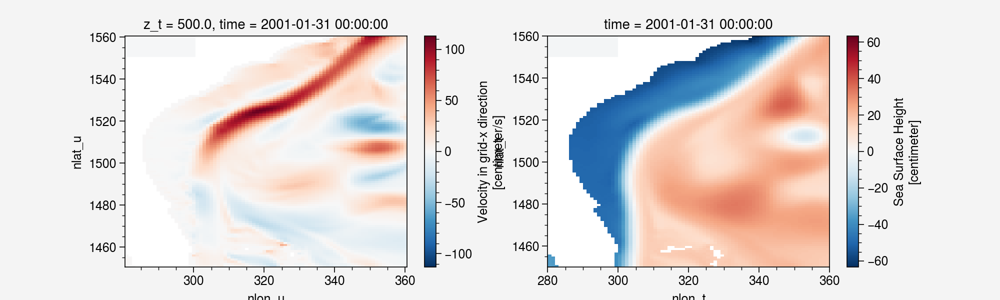

In [25]:
# small region subsection
uvel_r_TH = xds_uvel_TH.UVEL.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12),
                                  nlat_u=slice(nlat1_r_t12, nlat2_r_t12))
ssh_r_TH = xds_ssh_TH.SSH.isel(nlon_t=slice(nlon1_r_t12, nlon2_r_t12),
                               nlat_t=slice(nlat1_r_t12, nlat2_r_t12))

uvel_r_CH = xds_uvel_CH.UVEL.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12),
                                  nlat_u=slice(nlat1_r_t12, nlat2_r_t12))
ssh_r_CH = xds_ssh_CH.SSH.isel(nlon_t=slice(nlon1_r_t12, nlon2_r_t12),
                               nlat_t=slice(nlat1_r_t12, nlat2_r_t12))

# need kmu to mask land for contour plot
kmu_r_TH = xds_uvel_TH.KMU.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))
kmt_r_TH = xds_uvel_TH.KMT.isel(nlon_t=slice(nlon1_r_t12, nlon2_r_t12), nlat_t=slice(nlat1_r_t12, nlat2_r_t12))
uarea_r_TH = xds_uvel_TH.UAREA.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))
tarea_r_TH = xds_uvel_TH.TAREA.isel(nlon_t=slice(nlon1_r_t12, nlon2_r_t12), nlat_t=slice(nlat1_r_t12, nlat2_r_t12))


fig, axs = plt.subplots(1,2,figsize=(10,3))
uvel_r_TH.isel(time=0, z_t=0).plot(ax=axs[0])
ssh_r_TH.isel(time=0).plot(ax=axs[1])

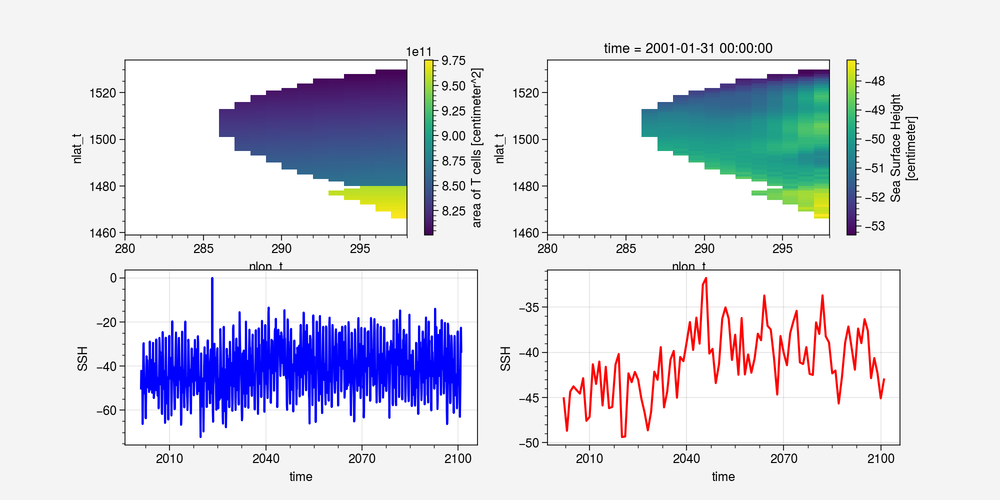

In [26]:
# compute ssh spatial av

# chose cross section (region 2)
nlat1_r2_t12 = 9
nlat2_r2_t12 = 84

nlon1_r2_t12 = 18

# need kmu to mask land for contour plot
# kmu_r_TL = xds_uvel_TL.KMU.isel(nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))
# kmu_r_TL


# xds_ssh_r_TH = xds_ssh_TH.isel(nlon_t=slice(nlon1_r_t12, nlon2_r_t12),
#                                nlat_t=slice(nlat1_r_t12, nlat2_r_t12))
ssh_r2_TH = ssh_r_TH[:,nlat1_r2_t12:nlat2_r2_t12, 0:nlon1_r2_t12]
ssh_r2_CH = ssh_r_CH[:,nlat1_r2_t12:nlat2_r2_t12, 0:nlon1_r2_t12]

kmt_r2_TH = kmt_r_TH[nlat1_r2_t12:nlat2_r2_t12, 0:nlon1_r2_t12]
tarea_r2_TH = tarea_r_TH[nlat1_r2_t12:nlat2_r2_t12, 0:nlon1_r2_t12]
tarea_r2m_TH = tarea_r2_TH.where(kmt_r2_TH>0, np.nan)
ssh_r2m_TH = ssh_r2_TH.where(kmt_r2_TH>0, np.nan)
ssh_r2m_CH = ssh_r2_CH.where(kmt_r2_TH>0, np.nan)
# print(tarea_csbox_TH.dims)

tarea_r2msum_TH = tarea_r2m_TH.sum(('nlon_t','nlat_t')).values
ssh_r2msum_TH = (ssh_r2m_TH*tarea_r2m_TH.values).sum(('nlon_t','nlat_t'))
ssh_r2mav_TH = ssh_r2msum_TH/tarea_r2msum_TH
ssh_r2mav_TH = ssh_r2mav_TH.compute()

ssh_r2msum_CH = (ssh_r2m_CH*tarea_r2m_TH.values).sum(('nlon_t','nlat_t'))
ssh_r2mav_CH = ssh_r2msum_CH/tarea_r2msum_TH
ssh_r2mav_CH = ssh_r2mav_CH.compute()

fig, axs = plt.subplots(2,3,figsize=(10,5))
tarea_r2m_TH.plot(ax=axs[0,0])
ssh_r2m_TH.isel(time=0).plot(ax=axs[0,1])
ssh_r2mav_TH.plot(ax=axs[1,0],color='r')
(ssh_r2mav_TH-ssh_r2mav_CH.values).plot(ax=axs[1,1],color='b')
ssh_r2mav_TH.resample(time='A').mean('time').plot(ax=axs[2,0],color='r')
(ssh_r2mav_TH-ssh_r2mav_CH.values).resample(time='A').mean('time').plot(ax=axs[2,1],color='r')

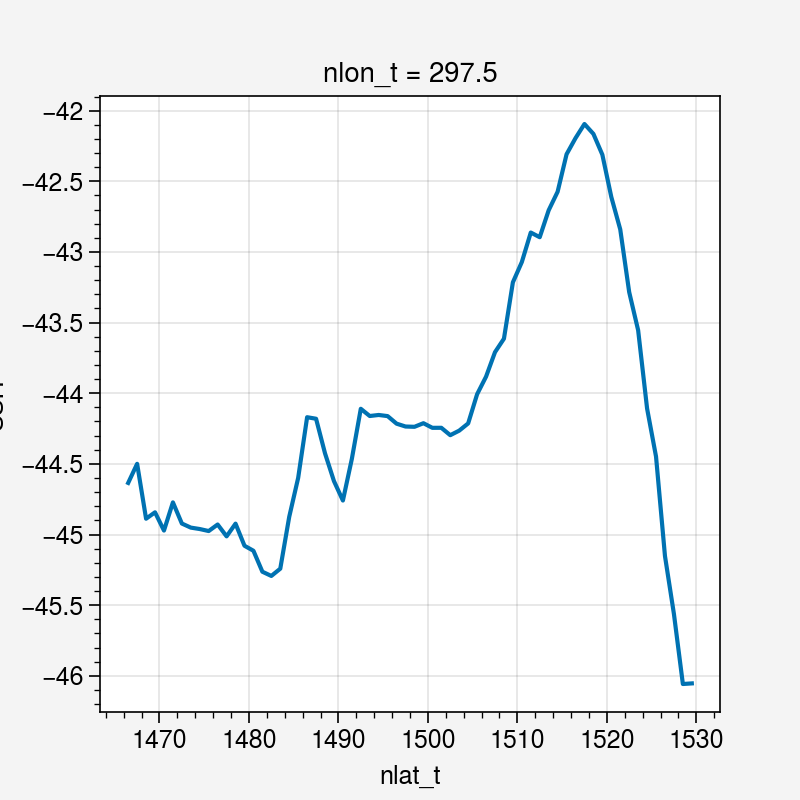

In [68]:
ssh_r2m_TH[:,:,-1].sel(time=slice('2001','2020')).mean('time').plot()

In [27]:
# function to compute gradient 
# copied by DL on 2022Jan07 from https://github.com/NCAR/pop-tools/blob/master/docs/source/examples/pop_div_curl_xr_xgcm_metrics_compare.ipynb

def x_gradh(F, grid):
    """
    gradient of scalar xgcm_metrics
    for pop
    """
    F_yi = grid.interp(F, axis="Y", boundary="extend")  # 0.5*(F[i,j+1]+F[i,j])
    F_xi = grid.interp(F, axis="X", boundary="extend")  # 0.5*(F[i+1,j]+F[i,j])
    dFdx = grid.derivative(F_yi, axis="X", boundary="extend")
    dFdy = grid.derivative(F_xi, axis="Y", boundary="extend")
    return dFdx, dFdy

[[6.38407207e-05            nan            nan ... 6.38407207e-05
  6.38407207e-05 6.38407207e-05]
 [6.40463227e-05            nan            nan ... 6.40463227e-05
  6.40463227e-05 6.40463227e-05]
 [6.42516099e-05            nan            nan ... 6.42516099e-05
  6.42516099e-05 6.42516099e-05]
 ...
 [           nan            nan            nan ... 8.32423700e-05
  8.32502606e-05 8.32581549e-05]
 [           nan            nan            nan ... 8.34041363e-05
  8.34121152e-05 8.34200977e-05]
 [           nan            nan            nan ... 8.35655896e-05
  8.35736564e-05 8.35817269e-05]]
CPU times: user 805 ms, sys: 17.1 ms, total: 822 ms
Wall time: 3.71 s


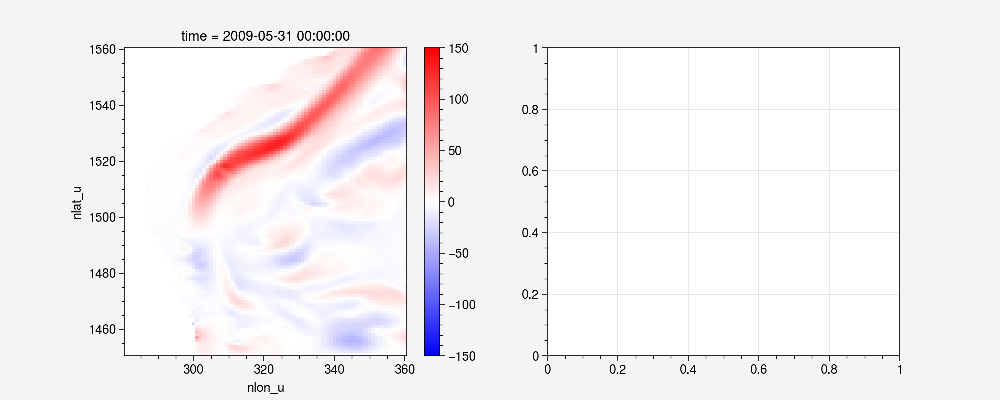

In [54]:
%%time
# compute gradient and geostrohpic vel
g = 9.8 # gravity acceleration
# rho0 = 1035 # reference density, see Fox-Kemper and Ferrari (2008) Table 1
omega = 7.29e-5 # Earths Angular Velocity, [rad/s], from POP model output

dsshdx_TH, dsshdy_TH = x_gradh(xds_ssh_TH.SSH, grid_ssh_TH)  # xgcm metrics version
dsshdx_TH

ulat_r_TH = xds_ssh_TH.ULAT.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))
ulatm_r_TH = ulat_r_TH.where(kmu_r_TH>0, np.nan) # mask land, ulat is -1 on land
f_r_TH = 2*omega*xr.ufuncs.sin(ulatm_r_TH/180*np.pi)
print(f_r_TH.values)

Vg_r_TH = dsshdx_TH.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))*g/f_r_TH*100 # cm/s
Vg_r_TH = Vg_r_TH.persist()
Ug_r_TH = -dsshdy_TH.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))*g/f_r_TH*100 # cm/s
Ug_r_TH = Ug_r_TH.persist()

dsshdx_CH, dsshdy_CH = x_gradh(xds_ssh_CH.SSH, grid_ssh_CH)  # xgcm metrics version
dsshdx_CH

# Vg_r_CH = dsshdx_CH.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))*g/f_r_TH*100 # cm/s
# Vg_r_CH = Vg_r_CH.persist()
Ug_r_CH = -dsshdy_CH.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))*g/f_r_TH*100 # cm/s
Ug_r_CH = Ug_r_CH.persist()

fig, axs = plt.subplots(1,2,figsize=(10,4))
Ug_r_TH.isel(time=100).plot(ax=axs[0],vmin=-150, vmax=150, cmap='bwr')
# Vg_r_TH.isel(time=100).plot(ax=axs[1],vmin=-150, vmax=150, cmap='bwr')
# Vg_r_TH

array([   0.,    0.,    0.,    0.,    0.,    0., 3000., 3000., 3000.,
       3000., 3000., 3000., 3000., 3000., 3000.])

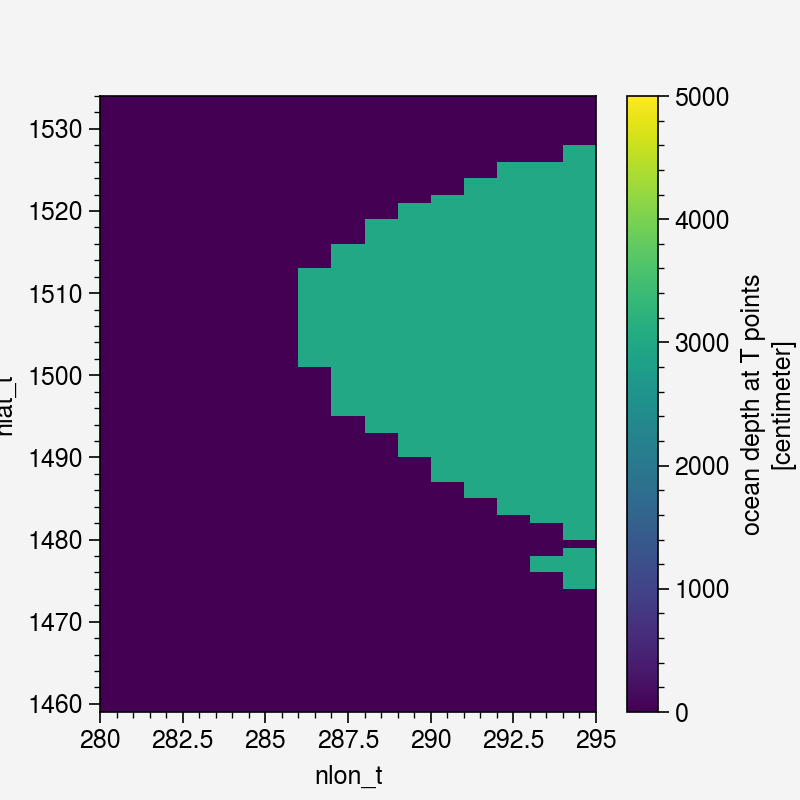

In [86]:
HT_r_TH = xds_uvel_TH.HT.isel(nlon_t=slice(nlon1_r_t12, nlon2_r_t12), nlat_t=slice(nlat1_r_t12, nlat2_r_t12))
HT_r2_TH = HT_r_TH[nlat1_r2_t12:nlat2_r2_t12, 0:nlon1_r2_t12-3]
HT_r2_TH.plot(vmin=0,vmax=50*100)
HT_r2_TH.isel(nlat_t=50).values

In [49]:
print(kmu_r_TH.dims)
kmu_cs_TH = kmu_r_TH[nlat1_r2_t12:nlat2_r2_t12, nlon1_r2_t12]
print(kmu_cs_TH.values)
kmt_cs_TH = kmt_r_TH[nlat1_r2_t12:nlat2_r2_t12, nlon1_r2_t12]
print(kmu_cs_TH.values)

('nlat_u', 'nlon_u')
[ 0.  0.  0.  0.  0.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.
  4.  4.  4.  4.  5.  5.  5.  8. 10.  9.  9. 10. 12. 16. 20. 22. 21. 18.
 17. 16. 16. 16. 17. 16. 14. 13. 12.  9.  7.  7.  6.  5.  4.  4.  4.  4.
  4.  4.  4.  4.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  0.
  0.  0.  0.]
[ 0.  0.  0.  0.  0.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.
  4.  4.  4.  4.  5.  5.  5.  8. 10. 10.  9. 10. 12. 16. 20. 22. 24. 21.
 18. 17. 16. 16. 17. 18. 16. 14. 13. 12.  9.  7.  7.  6.  5.  4.  4.  4.
  4.  4.  4.  4.  4.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.
  0.  0.  0.]


(62, 75)
(62, 75)
(75,)
(1200, 75)
('time', 'nlat_u')


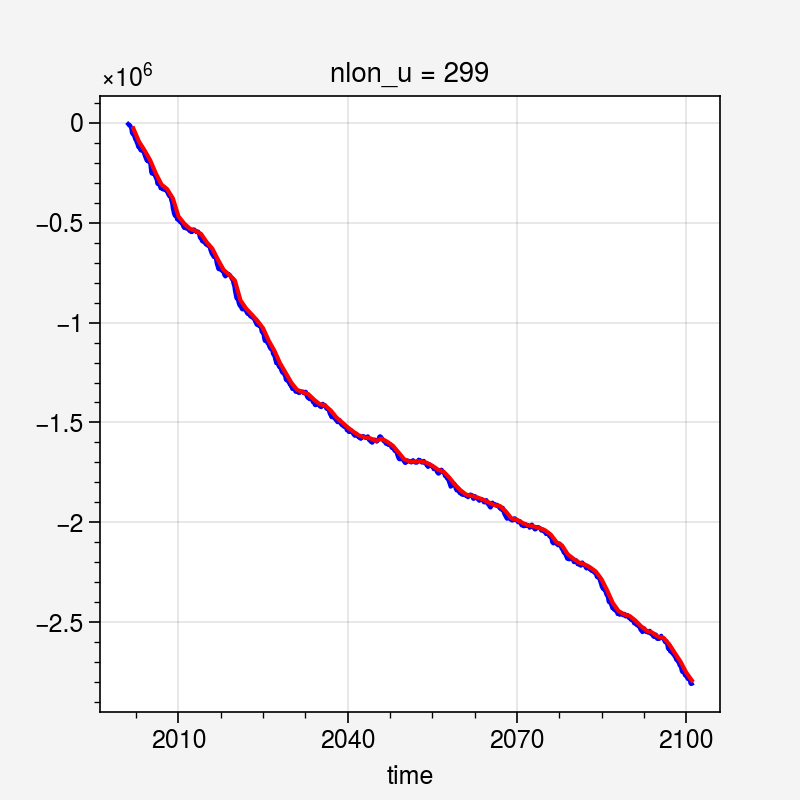

In [41]:
# compute ssh from velocity integration
dyu_r_TH = xds_uvel_TH.DYU.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))
dzu_r_TH = xds_uvel_TH.DZU.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))

# uvel_cs_TH = uvel_r_TH[:,:,nlat1_r2_t12:nlat2_r2_t12, nlon1_r2_t12]
# print('uvel_cs_TH.dims', uvel_cs_TH.dims)
dyu_cs_TH = dyu_r_TH[nlat1_r2_t12:nlat2_r2_t12, nlon1_r2_t12]
# print('dyu_cs_TH.dims', dyu_cs_TH.dims)
dzu_cs_TH = dzu_r_TH[:,nlat1_r2_t12:nlat2_r2_t12, nlon1_r2_t12]
# print('dzu_cs_TH.dims', dzu_cs_TH.dims)
# q_cs_TH = uvel_cs_TH*dyu_cs_TH.values*dzu_cs_TH.fillna(0).values
print(dzu_cs_TH.fillna(0).values.shape)
dzu_cs_zsum_TH_np = dzu_cs_TH.fillna(0).values.sum(axis=0)

# area_cs_zsum_TH_np =  dzu_cs_zsum_TH_np*dyu_cs_TH.values
# area_cs_zsum_TH_np

area_cs_TH_np = (dyu_cs_TH.values)*(dzu_cs_TH.fillna(0).values)
print(area_cs_TH_np.shape)
area_cs_zsum_TH_np =  area_cs_TH_np.sum(axis=0)
print(area_cs_zsum_TH_np.shape)
qg_cs_TH = ug_cs_TH*area_cs_zsum_TH_np
print(qg_cs_TH.shape)
print(qg_cs_TH.dims)
Qg_cs_TH = qg_cs_TH.sum('nlat_u')
Qg_cs_TH = Qg_cs_TH.compute()

sec_in_month = Qg_cs_TH.time.dt.days_in_month.values*86400
Tg_cs_TH = -Qg_cs_TH*sec_in_month
ssh_ug_csbox_TH = Tg_cs_TH.cumsum('time')/tarea_r2msum_TH

ssh_ug_csbox_TH.plot(color='b')
ssh_ug_csbox_TH.resample(time='A').mean('time').plot(color='r')

# ug_cs_TH = Ug_r_TH[:,nlat1_r2_t12:nlat2_r2_t12, nlon1_r2_t12]
# # dzu_cs_zsum_TH_np.shape



# fig, axs = plt.subplots(2,2,figsize=(10,6))
# ug_cs_TH.isel(time=0).plot(ax=axs[0,0],marker='*')
# dyu_cs_TH.plot(ax=axs[0,1],marker='*')
# (ug_cs_TH.isel(time=0)*dzu_cs_zsum_TH_np).plot(ax=axs[1,0],marker='*')
# (ug_cs_TH.isel(time=0)*dzu_cs_zsum_TH_np*dyu_cs_TH).plot(ax=axs[1,1],marker='*')
# ug_cs_TH
# print(dzu_cs_TH.dims, dzu_cs_TH.shape)


In [64]:
# ug_cs_TH.isel(time=0).plot(marker='*')
spd2_Vg_r_TH = (Ug_r_TH**2 + Vg_r_TH**2)
Uag_r_TH = uvel_r_TH - Ug_r_TH
Vag_r_TH = vvel_r_TH - Vg_r_TH
spd2_Vag_r_TH = (Uag_r_TH**2 + Vag_r_TH**2)

NameError: name 'vvel_r_TH' is not defined

In [48]:
kmt_cs_TH

NameError: name 'kmt_cs_TH' is not defined

<xarray.DataArray ()>
array(-2339.72870766)
Coordinates:
    nlon_u   int64 299

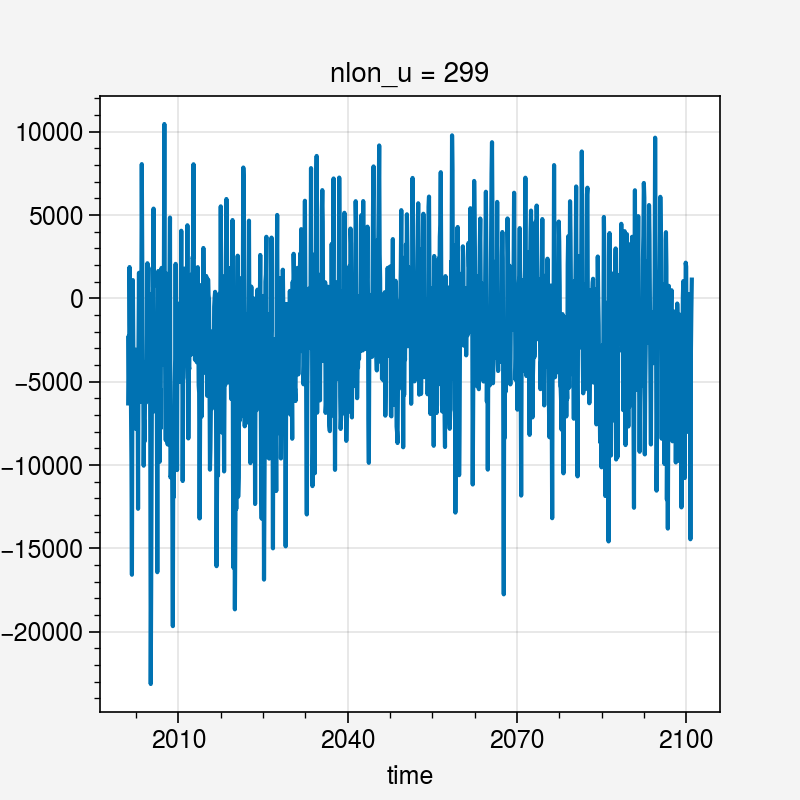

In [44]:
(Tg_cs_TH/tarea_r2msum_TH).plot()
(Tg_cs_TH/tarea_r2msum_TH).mean('time')

In [39]:
ug_cs_TH = Ug_r_TH[:,nlat1_r2_t12:nlat2_r2_t12, nlon1_r2_t12]
ug_cs_TH.isel(time=0).values
qg_cs_TH.isel(time=0).values

array([            nan,             nan,             nan,             nan,
                   nan, -1.71316627e+10,  1.44810375e+09, -6.46327832e+09,
       -3.92968865e+09, -2.62701435e+09,  3.54639221e+09,  9.98965326e+09,
        1.15734653e+10,  1.73293462e+10,  1.77310608e+10,  1.34525855e+10,
        5.59578789e+09,  6.31947935e+09, -1.23665701e+10,  3.75982220e+09,
        2.61314899e+10,  4.53136853e+10,  1.49612896e+10, -5.33984879e+10,
       -1.28530644e+11, -1.94638057e+11, -1.35086771e+11, -5.31898696e+10,
        2.32813022e+10,  6.38377767e+10, -5.30867286e+10, -5.79874817e+10,
        6.93893845e+10,  1.41651990e+11,  1.84725737e+11,  1.72586138e+11,
        1.48600948e+11,  1.20871613e+11,  1.01420340e+11,  1.08996884e+11,
        1.11246040e+11,  4.71943043e+10,  9.72002434e+09,  3.90601181e+10,
       -3.86056455e+10, -4.69170839e+10,  1.41076749e+10,  4.08746866e+10,
        2.69336507e+10,  5.09769087e+09,  2.36093579e+09,  9.52875009e+09,
        8.74479128e+09,  

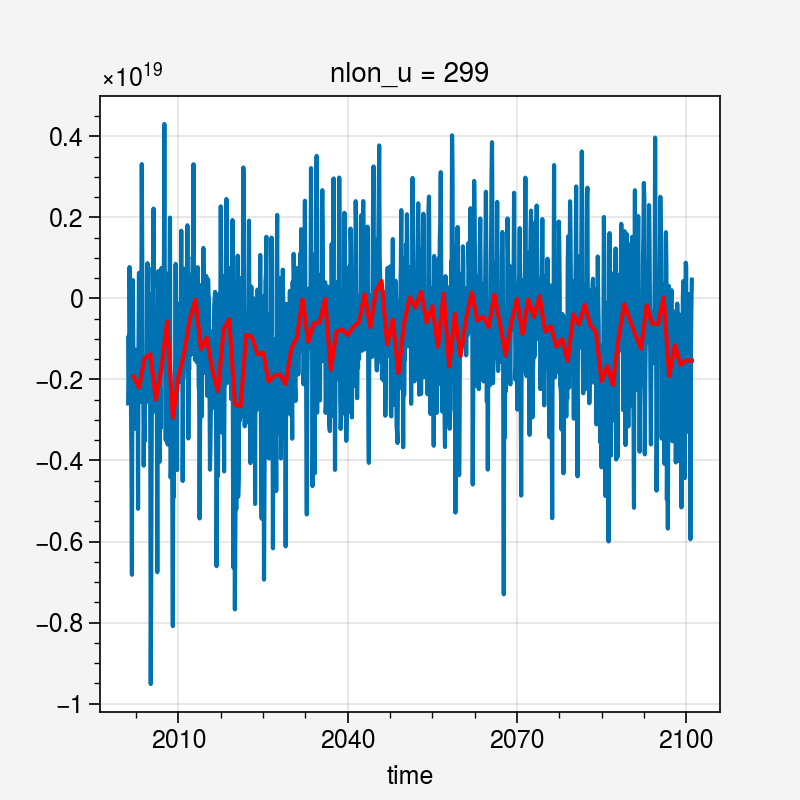

In [60]:
Tg_cs_TH.plot()
Tg_cs_TH.resample(time='A').mean().plot(color='r')

In [ ]:
qg_cs_TH = ug_cs_TH*dzu_cs_zsum_TH_np*dyu_cs_TH

('z_t', 'nlat_u') (62, 75)
(75,) (1200, 75)


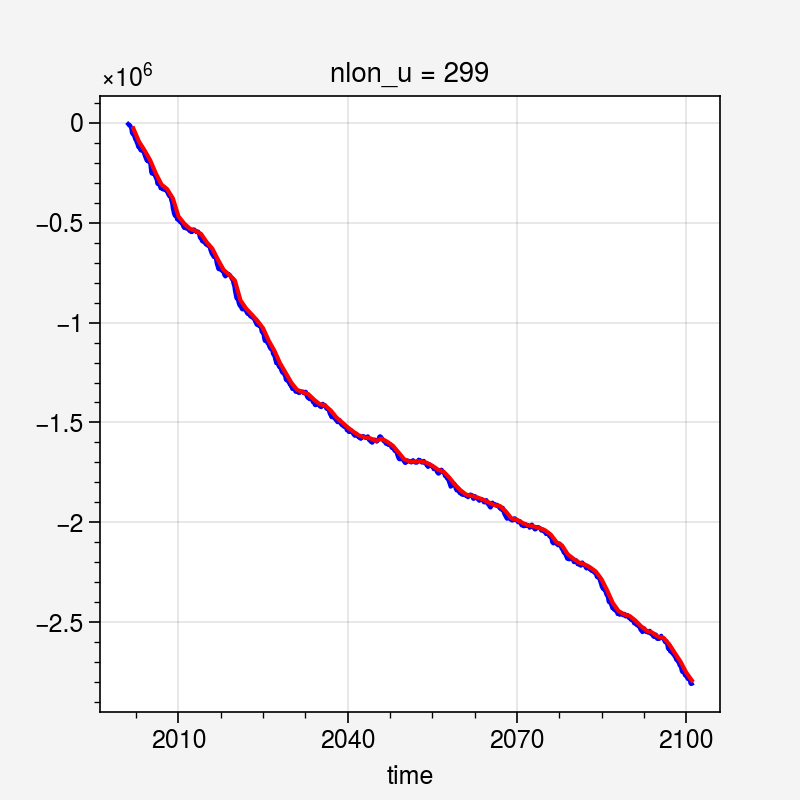

In [48]:




# dyu_cs_TH.dims
print(dzu_cs_TH.fillna(0).dims, dzu_cs_TH.fillna(0).shape)
dzu_cs_TH.fillna(0).values.sum(axis=1)
area_cs_TH_np = dyu_cs_TH.values*dzu_cs_TH.fillna(0).values
area_cs_zsum_TH_np =  area_cs_TH_np.sum(axis=0)
print(area_cs_zsum_TH_np.shape, ug_cs_TH.shape)
qg_cs_TH = ug_cs_TH*area_cs_zsum_TH_np
qg_cs_TH
Qg_cs_TH = qg_cs_TH.sum('nlat_u')
Qg_cs_TH = Qg_cs_TH.compute()

sec_in_month = Qg_cs_TH.time.dt.days_in_month.values*86400
Tg_cs_TH = -Qg_cs_TH*sec_in_month
ssh_ug_csbox_TH = Tg_cs_TH.cumsum('time')/tarea_r2msum_TH

ssh_ug_csbox_TH.plot(color='b')
ssh_ug_csbox_TH.resample(time='A').mean('time').plot(color='r')

In [32]:
print(Ug_r_TH.dims)
ug_cs_TH = Ug_r_TH[:,nlat1_r2_t12:nlat2_r2_t12, nlon1_r2_t12]
ug_cs_TH

qg_cs_TH = ug_cs_TH*dyu_cs_TH.values*dzu_cs_TH.fillna(0).values
# print('q_cs_TH.dims', q_cs_TH.dims)
# Q_cs_TH = q_cs_TH.sum(('nlat_u','z_t'))
# Q_cs_TH = Q_cs_TH.compute()
# Q_cs_TH

# sec_in_month = Q_cs_TH.time.dt.days_in_month.values*86400
# T_cs_TH = -Q_cs_TH*sec_in_month

('time', 'nlat_u', 'nlon_u')


ValueError: operands could not be broadcast together with shapes (1200, 75) (62, 75)

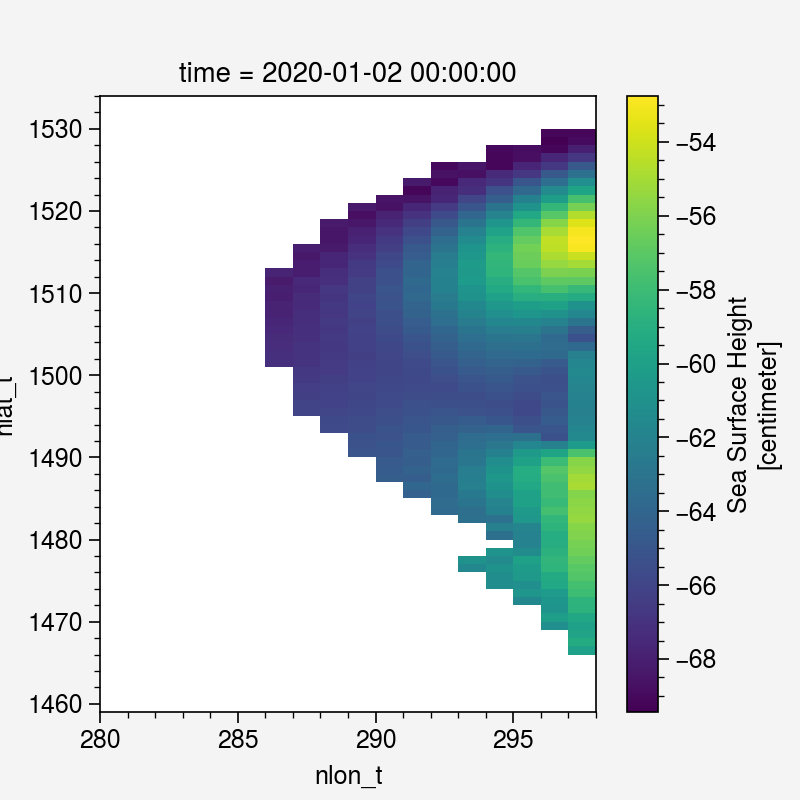

In [79]:
ssh_r_daily_TH = xds_ssh_daily_TH.SSH.isel(nlon_t=slice(nlon1_r_t12, nlon2_r_t12),
                                           nlat_t=slice(nlat1_r_t12, nlat2_r_t12))
# ssh_r_daily_TH
ssh_r2_daily_TH = ssh_r_daily_TH[:,nlat1_r2_t12:nlat2_r2_t12, 0:nlon1_r2_t12]
ssh_r2m_daily_TH = ssh_r2_daily_TH.where(kmt_r2_TH>0, np.nan)
ssh_r2m_daily_TH.isel(time=0).plot()

ssh_r2msum_daily_TH = (ssh_r2m_daily_TH*tarea_r2m_TH.values).sum(('nlon_t','nlat_t'))
# ssh_r2mav_TH = ssh_r2msum_TH/tarea_r2msum_TH
ssh_r2msum_daily_TH

# CESM-TNST HR Ens#1 has missing time: 2033-07, 2038-09, 2052-11
T_cs_203307_TH = ssh_r2msum_daily_TH.sel(time='2033-07-31').values - ssh_r2msum_daily_TH.sel(time='2033-07-01').values # cm^3
T_cs_203809_TH = ssh_r2msum_daily_TH.sel(time='2038-09-30').values - ssh_r2msum_daily_TH.sel(time='2038-09-01').values # cm^3
T_cs_205211_TH = ssh_r2msum_daily_TH.sel(time='2052-11-30').values - ssh_r2msum_daily_TH.sel(time='2052-11-01').values # cm^3

In [30]:
# compute ssh from velocity integration
dyu_r_TH = xds_uvel_TH.DYU.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))
dzu_r_TH = xds_uvel_TH.DZU.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))

uvel_cs_TH = uvel_r_TH[:,:,nlat1_r2_t12:nlat2_r2_t12, nlon1_r2_t12]
# print('uvel_cs_TH.dims', uvel_cs_TH.dims)
dyu_cs_TH = dyu_r_TH[nlat1_r2_t12:nlat2_r2_t12, nlon1_r2_t12]
# print('dyu_cs_TH.dims', dyu_cs_TH.dims)
dzu_cs_TH = dzu_r_TH[:,nlat1_r2_t12:nlat2_r2_t12, nlon1_r2_t12]
# print('dzu_cs_TH.dims', dzu_cs_TH.dims)
q_cs_TH = uvel_cs_TH*dyu_cs_TH.values*dzu_cs_TH.fillna(0).values
print('q_cs_TH.dims', q_cs_TH.dims)
Q_cs_TH = q_cs_TH.sum(('nlat_u','z_t'))
Q_cs_TH = Q_cs_TH.compute()
Q_cs_TH

sec_in_month = Q_cs_TH.time.dt.days_in_month.values*86400
T_cs_TH = -Q_cs_TH*sec_in_month
# # T_cs_TH[0]=0
# ssh_u_csbox_TH = T_cs_TH.cumsum('time')/tarea_r2msum_TH

# ssh_u_csbox_TH.plot(color='b')
# ssh_u_csbox_TH.resample(time='A').mean('time').plot(color='r')

# # correct for missing time
# # CESM-TNST HR Ens#1 has missing time: 2033-07, 2038-09, 2052-11
# print(T_cs_TH.sel(time='2033-07').values, T_cs_TH.sel(time='2038-09').values, T_cs_TH.sel(time='2052-11').values)
# # ssh_csbox_xysum_TH.sel(time='2033-07').values, ssh_csbox_xysum_TH.sel(time='2033-08').values

q_cs_TH.dims ('time', 'z_t', 'nlat_u')


[-5.7187774e+15] [1.00961052e+15] [-3.11291127e+15]
[5.7187774e+15] [5.7187774e+15] [5.7187774e+15]


(-60.0, -20.0)

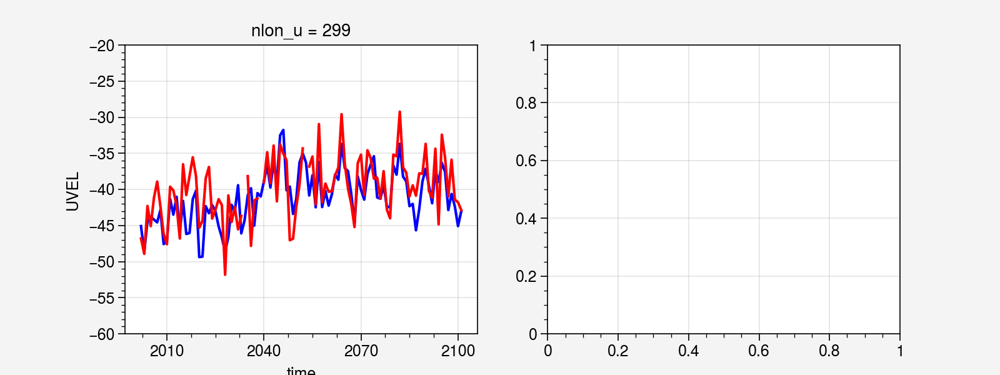

In [115]:
T_cs_TH.sel(time='2033-07')
T_cs_cr1_TH = xr.where(T_cs_TH.time == T_cs_TH.sel(time='2033-07').time.values, -T_cs_203307_TH, T_cs_TH)
T_cs_cr2_TH = xr.where(T_cs_TH.time == T_cs_TH.sel(time='2038-09').time.values, -T_cs_203809_TH, T_cs_cr1_TH)
T_cs_cr3_TH = xr.where(T_cs_TH.time == T_cs_TH.sel(time='2052-11').time.values, -T_cs_205211_TH, T_cs_cr2_TH)

print(T_cs_203307_TH, T_cs_203809_TH, T_cs_205211_TH)
print(T_cs_cr3_TH.sel(time='2033-07').values, T_cs_cr3_TH.sel(time='2033-07').values, T_cs_cr3_TH.sel(time='2033-07').values)

# ssh_u_csbox_TH = T_cs_cr3_TH.cumsum('time')/tarea_r2msum_TH
ssh_u_csbox_TH = T_cs_TH.cumsum('time')/tarea_r2msum_TH

# ssh_u_csbox_TH.resample(time='A').mean('time').plot(color='r')
fig, axs = plt.subplots(1,2,figsize=(8,3))
(ssh_r2mav_TH.resample(time='A').mean('time')).plot(ax=axs[0], color='b')
(ssh_u_csbox_TH.sel(time=slice('2001','2032')).resample(time='A').mean('time')-62).plot(ax=axs[0], color='r')
(ssh_u_csbox_TH.sel(time=slice('2034','2037')).resample(time='A').mean('time')-80).plot(ax=axs[0], color='r')
(ssh_u_csbox_TH.sel(time=slice('2039','2051')).resample(time='A').mean('time')-60).plot(ax=axs[0], color='r')
(ssh_u_csbox_TH.sel(time=slice('2053','2100')).resample(time='A').mean('time')-75).plot(ax=axs[0], color='r')
axs[0].set_ylim([-60,-20])

In [73]:
ssh_r2_daily_TH.sel(time='2033-07-01').values, ssh_r2_daily_TH.sel(time='2033-07-31').values

(array([[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]], dtype=float32),
 array([[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]], dtype=float32))

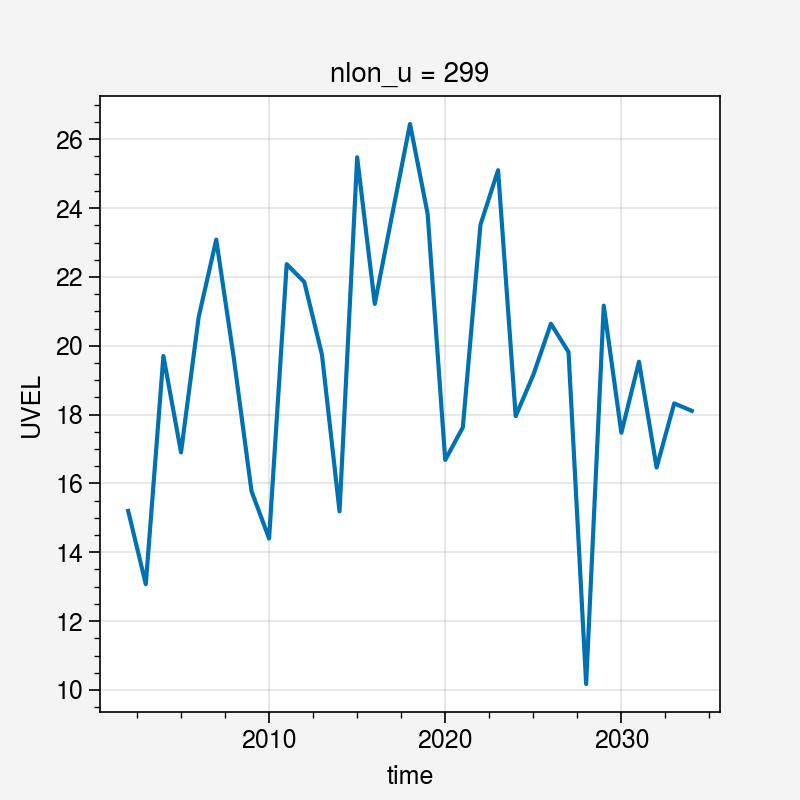

In [35]:
(T_cs_TH.sel(time=slice('2001-01','2033-06')).cumsum('time')/tarea_r2msum_TH).resample(time='A').mean().plot()

In [59]:
# T_cs_TH[0]=ssh_r2mav_TH.sel(time='2001-01').values
T_cs_TH[0], ssh_r2mav_TH.sel(time='2001-01').values
T_cs_TH[0] = -50.14
T_cs_TH

<xarray.DataArray 'UVEL' (time: 1200)>
array([-5.01400000e+01, -1.07561857e+15,  6.44249719e+15, ...,
        3.85938195e+15,  2.25043315e+15,  6.47319463e+15])
Coordinates:
  * time     (time) object 2001-01-31 00:00:00 ... 2100-12-31 00:00:00
    nlon_u   int64 299

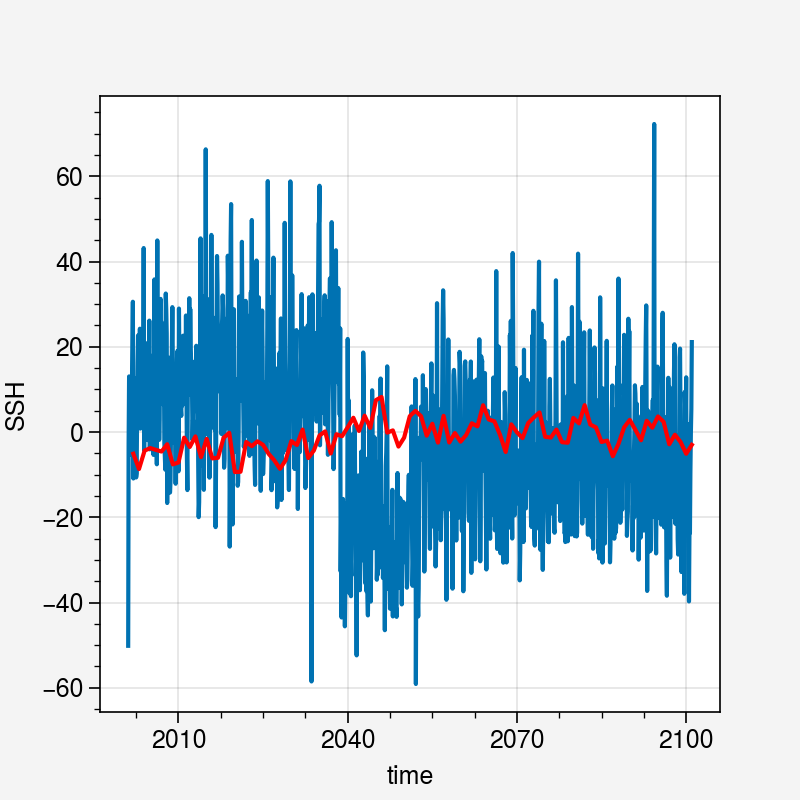

In [63]:
# T_cs_TH[0] = -50.14
T_cs_TH = -Q_cs_TH*sec_in_month
ssh_u_csbox_t1_TH = T_cs_TH.sel(time=slice('2001-02','2033-06')).cumsum('time')/tarea_r2msum_TH
ssh_r2mav_TH.sel(time='2033-07').values
ssh_u_csbox_t2_TH = T_cs_TH.sel(time=slice('2033-08','2038-08')).cumsum('time')/tarea_r2msum_TH
ssh_r2mav_TH.sel(time='2038-09').values
ssh_u_csbox_t3_TH = T_cs_TH.sel(time=slice('2038-10','2100-12')).cumsum('time')/tarea_r2msum_TH

ssh_u_csbox_TH_np = np.concatenate((ssh_r2mav_TH.sel(time='2001-01').values, ssh_u_csbox_t1_TH.values, ssh_r2mav_TH.sel(time='2033-07').values, ssh_u_csbox_t2_TH, 
                ssh_r2mav_TH.sel(time='2038-09').values, ssh_u_csbox_t3_TH), axis=0)
# ssh_u_csbox_t1_TH.values, ssh_r2mav_TH.sel(time='2033-07').values

ssh_u_csbox_TH = xr.DataArray(data=ssh_u_csbox_TH_np,
                      dims=["time"],
                      coords=dict(time=T_cs_TH.time),
                      name='Qt_cs_tre_TH',
                      attrs=dict(description="integrated temp flux, positive = outflow",
                                 units="m*cm*degC/s"))
ssh_u_csbox_TH.plot()
(40+ssh_r2mav_TH.resample(time='A').mean('time')).plot(color='r')

In [29]:
T_cs_TH.sel(time=slice('2001-01','2033-06'))
T_cs_TH.sel(time=slice('2033-08','2038-08'))
T_cs_TH.sel(time=slice('2038-10','2100-12'))

<xarray.DataArray 'UVEL' (time: 747)>
array([-8.29491933e+15, -9.59039595e+15,  1.03351675e+16, -2.91985027e+15,
        4.01937911e+15, -3.65448061e+15,  3.26729673e+15, -8.83513690e+13,
       -1.18133616e+16,  4.19913150e+15,  3.77105183e+14,  3.56402216e+15,
        3.14207427e+15, -2.99508151e+15,  1.94324074e+16, -1.09027195e+16,
        5.01093416e+15, -8.03107254e+15, -1.06230456e+16,  1.10469693e+15,
        1.94190430e+15, -3.31552603e+15,  7.21352588e+15,  3.55530993e+15,
        4.85289770e+15, -4.75214527e+14, -9.85759650e+15,  4.67616088e+14,
        2.10824818e+15,  8.60868259e+15, -7.16915651e+15, -7.34132506e+15,
        1.58645454e+15, -9.25645006e+15,  1.13397402e+16,  4.98475588e+15,
       -2.83022878e+15,  3.87142528e+15, -5.01102138e+15,  4.66866196e+14,
       -6.53747625e+15,  3.07991959e+15, -2.65068016e+14,  1.05626403e+16,
       -8.64573380e+15,  2.65277119e+15, -1.28416108e+15,  1.68300688e+16,
       -2.32497504e+15, -1.55412167e+16,  2.66625850e+15, -7.03198164e+15,
        1.20000200e+16, -1.16775267e+16, -1.12637778e+15,  9.04188440e+15,
       -9.64699369e+15, -1.71735436e+15,  4.81744328e+15,  6.85215085e+15,
        6.55580137e+15, -6.58698313e+15, -3.78558072e+15, -6.51675214e+15,
        5.12895218e+15,  1.21031615e+15,  1.40405366e+16, -4.92413846e+15,
       -8.67001722e+15, -1.63830346e+15,  2.97566971e+15,  7.72961900e+15,
       -4.56893684e+15,  1.31725603e+15, -5.40280949e+15,  6.28801759e+15,
       -1.13820829e+16,  2.07453550e+15, -1.60572037e+15,  4.20932675e+15,
...
       -1.04929712e+14, -2.68268159e+15, -3.13119659e+15,  5.21615397e+15,
        1.03616998e+16,  2.44270179e+15, -1.46095803e+16,  4.16141783e+15,
       -3.53081485e+15,  7.11959532e+15, -2.11448468e+15,  1.40719561e+15,
       -5.55906414e+15, -2.12192688e+15,  6.04892206e+15,  1.25937265e+16,
        1.79865196e+15, -8.56653618e+15, -9.37233163e+15, -2.75525823e+15,
        4.55403087e+15,  6.05805474e+15, -4.62689661e+15, -1.20889929e+15,
       -8.05120762e+15, -3.32547469e+15,  9.58208917e+15,  5.35874458e+15,
        6.08298388e+15, -2.90278352e+15,  2.00730124e+15, -6.45974718e+15,
       -9.99141345e+15,  1.06683065e+16,  5.63635489e+15, -1.20043901e+16,
       -3.90399636e+14,  2.33490246e+15,  9.55387771e+14,  5.52295414e+15,
        4.94033360e+15,  2.91801006e+15, -3.23631710e+15, -1.40764901e+16,
        8.58534274e+15, -4.66712350e+15, -1.66057714e+15,  3.46639031e+15,
       -7.21999446e+15, -1.47890826e+15,  2.56610408e+15,  3.47393421e+15,
        1.29889955e+16,  8.39432574e+14, -8.02116021e+15, -8.96061157e+15,
       -4.57099838e+15,  1.31481136e+16, -3.36175445e+15, -1.93273363e+15,
       -1.29045744e+15,  2.33076709e+15, -1.09930434e+16,  1.94783797e+16,
       -1.73356130e+15, -1.70444278e+15,  4.84081592e+15, -1.40443925e+16,
        3.71419281e+14,  5.29694058e+15,  3.85272694e+15, -5.25317979e+15,
       -1.18409662e+16,  6.63828849e+15, -3.51458939e+13,  5.82980093e+15,
        3.85938195e+15,  2.25043315e+15,  6.47319463e+15])
Coordinates:
  * time     (time) object 2038-10-31 00:00:00 ... 2100-12-31 00:00:00
    nlon_u   int64 299

In [93]:
# ssh_csbox_TH = xds_ssh_r_TH.SSH[:,ilat1_FSm_t12:ilat2_FSm_t12, 0:ilon1_FSm_t12]
# tarea_csboxm_xysum_TH = tarea_csboxm_TH.sum(('nlon_t','nlat_t')).values
# ssh_csbox_xysum_TH = (ssh_csbox_TH*tarea_csboxm_TH.values).sum(('nlon_t','nlat_t'))
# ssh_csbox_xyav_TH = ssh_csbox_xysum_TH/tarea_csboxm_xysum_TH
# ssh_csbox_xyav_TH = ssh_csbox_xyav_TH.compute()
# ssh_csbox_xyav_TH

<xarray.DataArray 'SSH' (time: 1200)>
array([-50.14326498, -42.12361613, -42.28372195, ..., -25.46710597,
       -22.57188467, -33.46857721])
Coordinates:
  * time     (time) object 2001-01-31 00:00:00 ... 2100-12-31 00:00:00

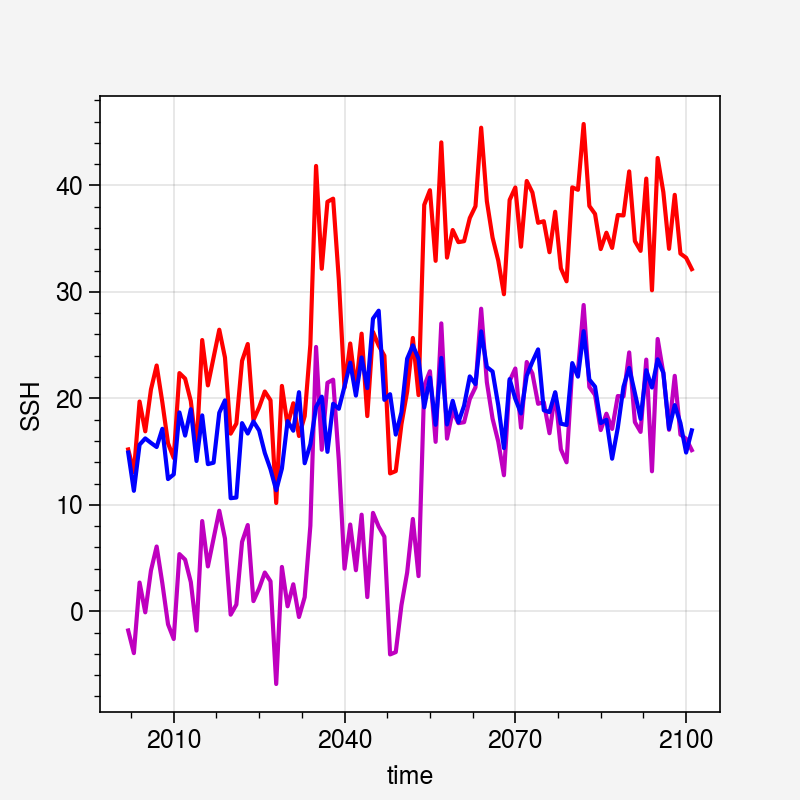

In [125]:
ssh_u_csbox_TH.resample(time='A').mean('time').plot(color='r')
(ssh_u_csbox_TH.resample(time='A').mean('time')-17).plot(color='m')
(60+ssh_csbox_xyav_TH.resample(time='A').mean('time')).plot(color='b')

2036-12-31 00:00:00 2036-12-31 00:00:00
2039-12-31 00:00:00 2039-12-31 00:00:00
2053-12-31 00:00:00 2053-12-31 00:00:00


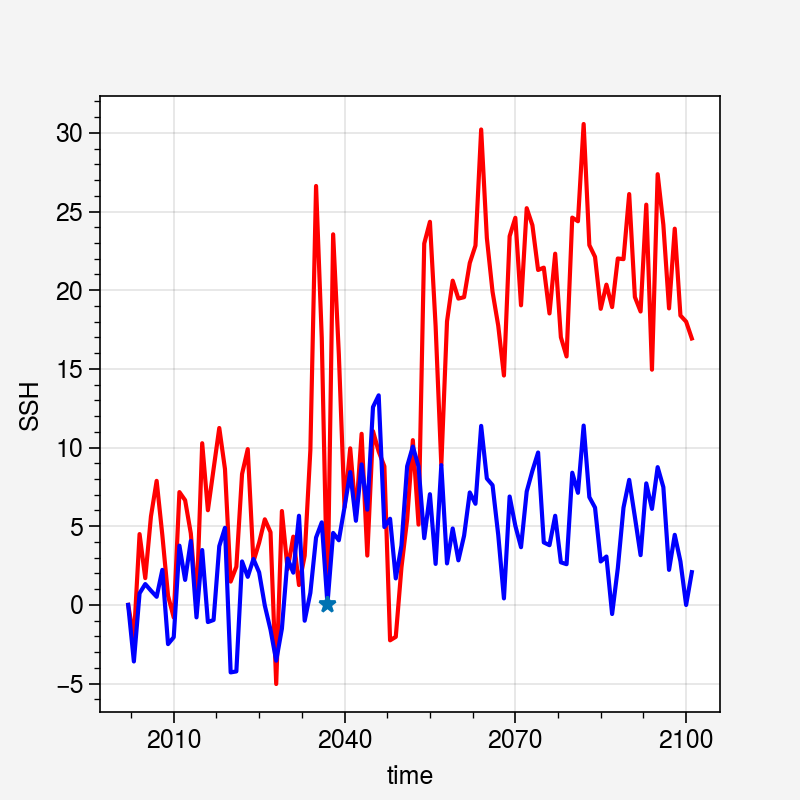

In [150]:
ssh_u_csbox_tre_TH = ssh_u_csbox_TH.resample(time='A').mean('time') 
ssha_u_csbox_tre_TH = ssh_u_csbox_tre_TH - ssh_u_csbox_tre_TH[0].values
ssh_csbox_xyav_tre_TH = ssh_csbox_xyav_TH.resample(time='A').mean('time') 
ssha_csbox_xyav_tre_TH = ssh_csbox_xyav_tre_TH - ssh_csbox_xyav_tre_TH[0].values 
# 2033-07, 2038-09, 2052-11
print(ssha_u_csbox_tre_TH[35].time.values, ssha_csbox_xyav_tre_TH[35].time.values)
print(ssha_u_csbox_tre_TH[38].time.values, ssha_csbox_xyav_tre_TH[38].time.values)
print(ssha_u_csbox_tre_TH[52].time.values, ssha_csbox_xyav_tre_TH[52].time.values)
ssha_u_csbox_tre_TH[35] = ssha_csbox_xyav_tre_TH[35]
ssha_u_csbox_tre_TH[38] = ssha_csbox_xyav_tre_TH[38]
ssha_u_csbox_tre_TH[55] = ssha_csbox_xyav_tre_TH[55]
fig, axs = plt.subplots(1,1)
ssha_u_csbox_tre_TH.plot(color='r')
ssha_csbox_xyav_tre_TH.plot(color='b')
axs.plot(ssha_u_csbox_tre_TH[35].time, ssha_u_csbox_tre_TH[35], marker='*')
# ssha_csbox_xyav_tre_TH[2038].plot(marker='*')

array(3.99172757e+14)

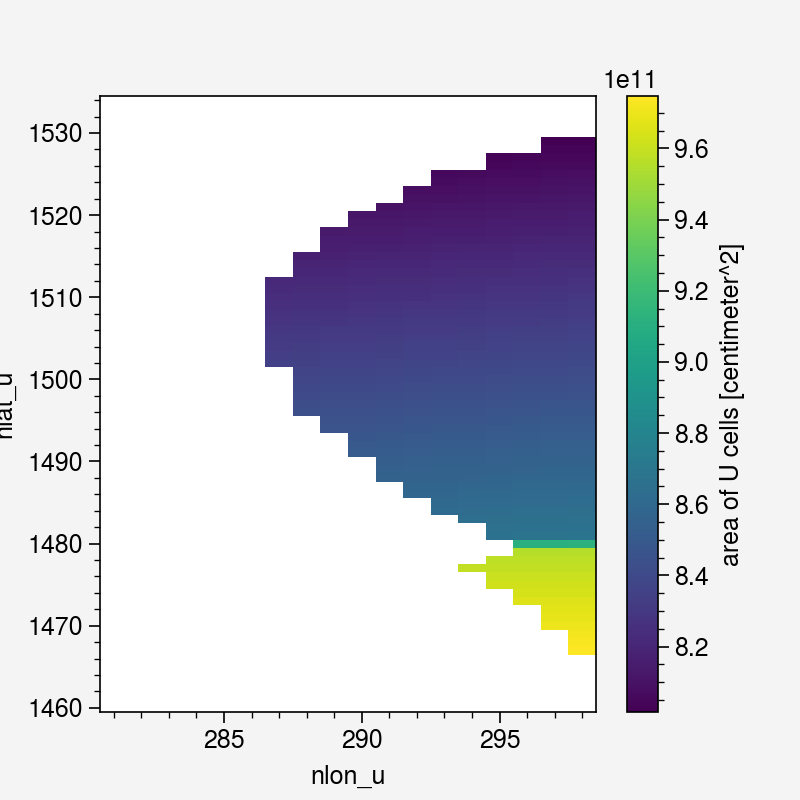

In [58]:
# kmu_csbox_TH = xds_r_TH.KMU[ilat1_FSm_t12:ilat2_FSm_t12, 0:ilon1_FSm_t12]
# uarea_csbox_TH = xds_r_TH.UAREA[ilat1_FSm_t12:ilat2_FSm_t12, 0:ilon1_FSm_t12]
# uarea_csboxm_TH = uarea_csbox_TH.where(kmu_csbox_TH>0, np.nan)
# uarea_csboxm_TH.plot()
# uarea_csboxm_xysum_TH = uarea_csboxm_TH.sum(('nlon_u','nlat_u')).values
# uarea_csboxm_xysum_TH

In [38]:
xds_r_TH = xds_uvel_TH.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12),nlat_u=slice(nlat1_r_t12, nlat2_r_t12),
                            )

# chose cross section 
ilat1_FSm_t12 = 9
ilat2_FSm_t12 = 84

ilon1_FSm_t12 = 18
# check KMU and KMT at cross section and cross section +1 
print('=== KMU ===')
print(xds_r_TH.KMU.dims)
print(xds_r_TH.KMU[ilat1_FSm_t12:ilat2_FSm_t12, ilon1_FSm_t12].values)
print(xds_r_TH.KMU[ilat1_FSm_t12-1:ilat2_FSm_t12-1, ilon1_FSm_t12].values)
# print(xds_r_TH.KMU[ilat1_FSm_t12:ilat2_FSm_t12, ilon1_FSm_t12+1].values)
# print('=== KMT ===')
# print(xds_r_TH.KMT.dims)
# print(xds_r_TH.KMT[ilat1_FSm_t12:ilat2_FSm_t12, ilon1_FSm_t12].values)
# print(xds_r_TH.KMT[ilat1_FSm_t12:ilat2_FSm_t12, ilon1_FSm_t12+1].values)
# print(uet_r_tre_TH.dims, uet_r_tre_TH.shape)

=== KMU ===
('nlat_u', 'nlon_u')
[ 0.  0.  0.  0.  0.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.
  4.  4.  4.  4.  5.  5.  5.  8. 10.  9.  9. 10. 12. 16. 20. 22. 21. 18.
 17. 16. 16. 16. 17. 16. 14. 13. 12.  9.  7.  7.  6.  5.  4.  4.  4.  4.
  4.  4.  4.  4.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  0.
  0.  0.  0.]
[ 0.  0.  0.  0.  0.  0.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.
  3.  4.  4.  4.  4.  5.  5.  5.  8. 10.  9.  9. 10. 12. 16. 20. 22. 21.
 18. 17. 16. 16. 16. 17. 16. 14. 13. 12.  9.  7.  7.  6.  5.  4.  4.  4.
  4.  4.  4.  4.  4.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.
  0.  0.  0.]


In [47]:
# uvel_cs_TH = uvel_r_TH[:,:,ilat1_FSm_t12:ilat2_FSm_t12, ilon1_FSm_t12]
# print('uvel_cs_TH.dims', uvel_cs_TH.dims)
# dyu_cs_TH = xds_r_TH.DYU[ilat1_FSm_t12:ilat2_FSm_t12, ilon1_FSm_t12]
# print('dyu_cs_TH.dims', dyu_cs_TH.dims)
# dzu_cs_TH = xds_r_TH.DZU[:,ilat1_FSm_t12:ilat2_FSm_t12, ilon1_FSm_t12]
# print('dzu_cs_TH.dims', dzu_cs_TH.dims)
# q_cs_TH = uvel_cs_TH*dyu_cs_TH.values*dzu_cs_TH.fillna(0).values
# print('q_cs_TH.dims', q_cs_TH.dims)
# Q_cs_TH = q_cs_TH.sum(('nlat_u','z_t'))
# Q_cs_TH = Q_cs_TH.compute()
# Q_cs_TH

uvel_cs_TH.dims ('time', 'z_t', 'nlat_u')
dyu_cs_TH.dims ('nlat_u',)
dzu_cs_TH.dims ('z_t', 'nlat_u')
q_cs_TH.dims ('time', 'z_t', 'nlat_u')


<xarray.DataArray 'UVEL' (time: 1200)>
array([-1.29714655e+09,  4.44617463e+08, -2.40535289e+09, ...,
       -1.44092815e+09, -8.68222666e+08, -2.41681401e+09])
Coordinates:
  * time     (time) object 2001-01-31 00:00:00 ... 2100-12-31 00:00:00
    nlon_u   int64 299

In [123]:
# T_cs_TH = -Q_cs_TH*sec_in_month
# # CESM-TNST HR Ens#1 has missing time: 2033-07, 2038-09, 2052-11
# print(T_cs_TH.sel(time='2033-07').values, T_cs_TH.sel(time='2038-09').values, T_cs_TH.sel(time='2052-11').values)
# ssh_csbox_xysum_TH.sel(time='2033-07').values, ssh_csbox_xysum_TH.sel(time='2033-08').values

[-0.] [-0.] [-0.]


(array([-2.40576627e+16]), array([-2.30278194e+16]))

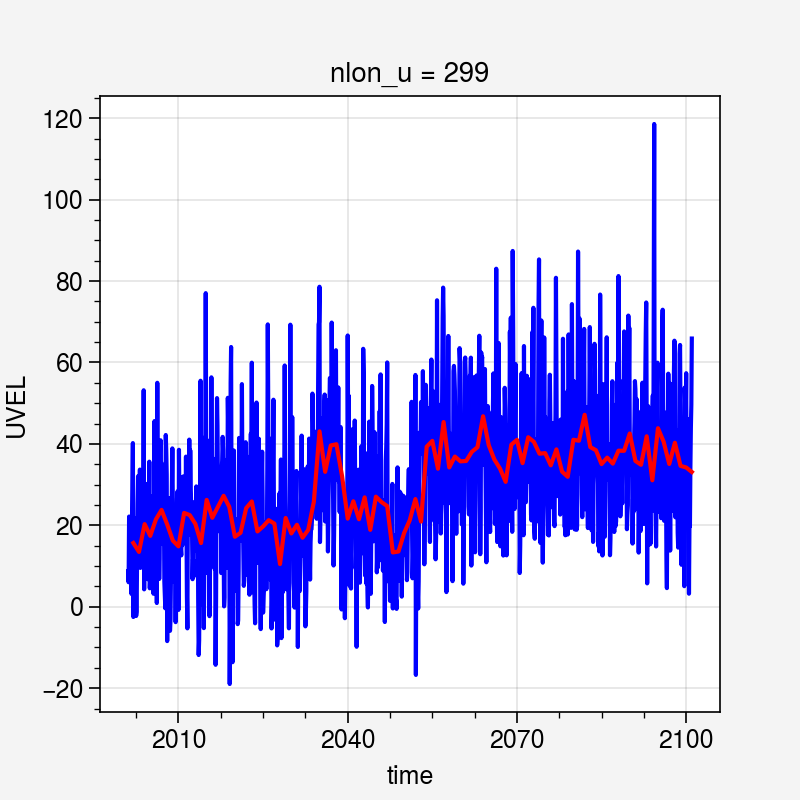

In [60]:
# sec_in_month = Q_cs_TH.time.dt.days_in_month.values*86400
# T_cs_TH = -Q_cs_TH*sec_in_month
# T_cs_TH[0]=0
# ssh_u_csbox_TH = T_cs_TH.cumsum('time')/tarea_csboxm_xysum_TH

# ssh_u_csbox_TH.plot(color='b')
# ssh_u_csbox_TH.resample(time='A').mean('time').plot(color='r')

In [63]:
from scipy import stats

In [64]:
#         slope, intercept, r_value, p_value, std_err = stats.linregress(x,y)
slope, intercept, r_value, p_value, std_err = stats.linregress(np.arange(2001,2100+1,1),ssh_u_csbox_TH.resample(time='A').mean('time'))
slope

0.24522576259550719

2001-01-31 00:00:00 2100-12-31 00:00:00 1200


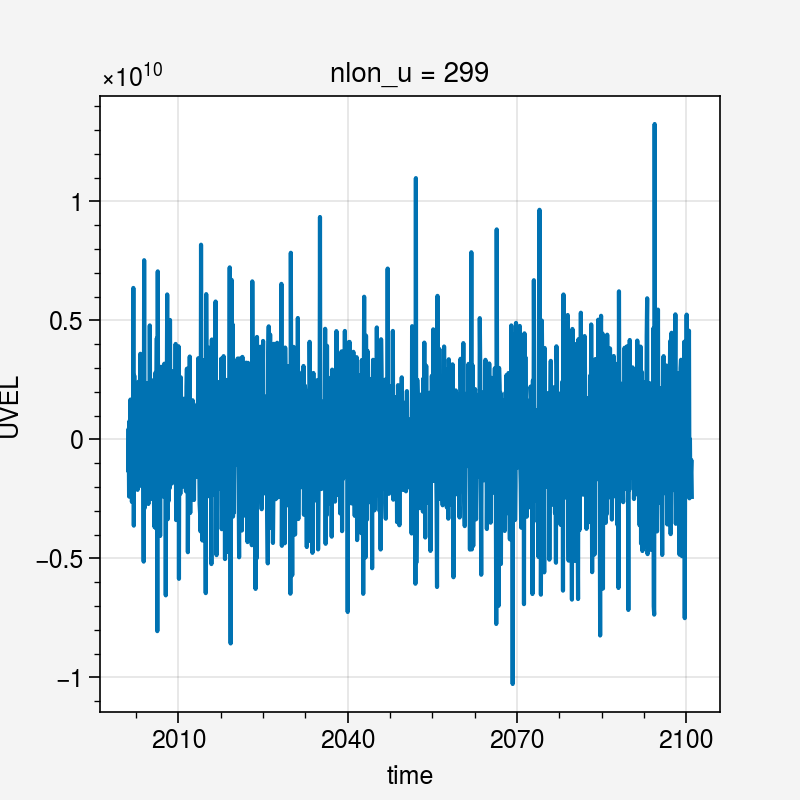

In [48]:
Q_cs_TH.plot()
print(Q_cs_TH.time[0].values, Q_cs_TH.time[-1].values, len(Q_cs_TH.time))


# Appendix

[[2.98563787e-05 2.98563787e-05 2.98563787e-05 ... 2.98563787e-05
  2.98563787e-05 2.98563787e-05]
 [3.01001332e-05 3.01001332e-05 3.01001332e-05 ... 3.01001332e-05
  3.01001332e-05 3.01001332e-05]
 [3.03437126e-05 3.03437126e-05 3.03437126e-05 ... 3.03437126e-05
  3.03437126e-05 3.03437126e-05]
 ...
 [           nan            nan            nan ...            nan
             nan            nan]
 [           nan            nan            nan ...            nan
             nan            nan]
 [           nan            nan            nan ...            nan
             nan            nan]]
CPU times: user 2.13 s, sys: 92.2 ms, total: 2.23 s
Wall time: 44 s


<xarray.DataArray (time: 1200, nlat_u: 700, nlon_u: 500)>
dask.array<mul, shape=(1200, 700, 500), dtype=float64, chunksize=(120, 399, 299), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 2001-01-31 00:00:00 ... 2100-12-31 00:00:00
  * nlat_u   (nlat_u) int64 1301 1302 1303 1304 1305 ... 1997 1998 1999 2000
  * nlon_u   (nlon_u) int64 201 202 203 204 205 206 ... 695 696 697 698 699 700
    ULAT     (nlat_u, nlon_u) float64 11.82 11.82 11.82 11.82 ... -1.0 -1.0 -1.0
    ULONG    (nlat_u, nlon_u) float64 -89.9 -89.8 -89.7 -89.6 ... -1.0 -1.0 -1.0

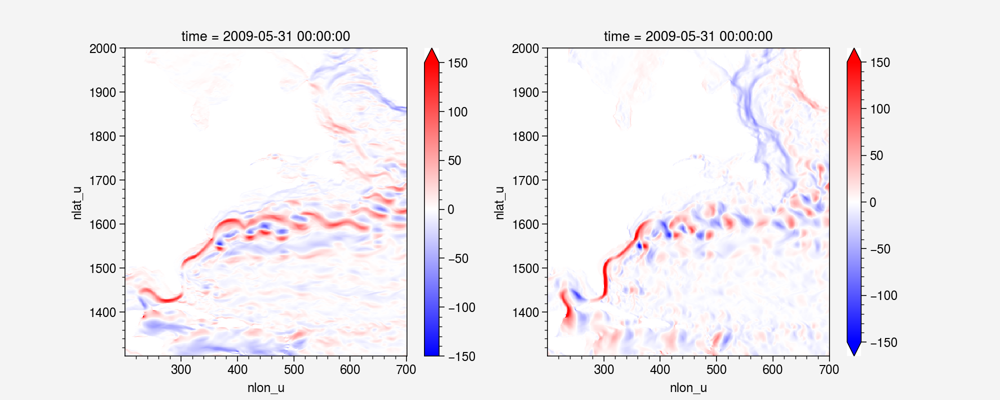

In [26]:
%%time
# compute gradient and geostrohpic vel
dsshdx_TH, dsshdy_TH = x_gradh(xds_ssh_TH.SSH, grid_ssh_TH)  # xgcm metrics version
dsshdx_TH

ulat_r_TH = xds_ssh_TH.ULAT.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))
ulatm_r_TH = ulat_r_TH.where(kmu_r_TH>0, np.nan) # mask land, ulat is -1 on land
f_r_TH = 2*omega*xr.ufuncs.sin(ulatm_r_TH/180*np.pi)
print(f_r_TH.values)

Vg_r_TH = dsshdx_TH.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))*g/f_r_TH*100 # cm/s
Vg_r_TH = Vg_r_TH.persist()
Ug_r_TH = -dsshdy_TH.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))*g/f_r_TH*100 # cm/s
Ug_r_TH = Ug_r_TH.persist()

dsshdx_CH, dsshdy_CH = x_gradh(xds_ssh_CH.SSH, grid_ssh_CH)  # xgcm metrics version
dsshdx_CH

Vg_r_CH = dsshdx_CH.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))*g/f_r_TH*100 # cm/s
Vg_r_CH = Vg_r_CH.persist()
Ug_r_CH = -dsshdy_CH.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))*g/f_r_TH*100 # cm/s
Ug_r_CH = Ug_r_CH.persist()

fig, axs = plt.subplots(1,2,figsize=(10,4))
Ug_r_TH.isel(time=100).plot(ax=axs[0],vmin=-150, vmax=150, cmap='bwr')
Vg_r_TH.isel(time=100).plot(ax=axs[1],vmin=-150, vmax=150, cmap='bwr')
Vg_r_TH

[[2.95358396e-05 2.95233782e-05 2.95110289e-05 ... 2.91192881e-05
  2.91188855e-05 2.91187513e-05]
 [3.02237773e-05 3.02107078e-05 3.01977558e-05 ... 2.97868848e-05
  2.97864625e-05 2.97863217e-05]
 [3.09175589e-05 3.09038605e-05 3.08902852e-05 ... 3.04596283e-05
  3.04591856e-05 3.04590381e-05]
 ...
 [           nan            nan            nan ... 1.23615875e-04
  1.23607560e-04 1.23604787e-04]
 [           nan            nan            nan ... 1.24126335e-04
  1.24118009e-04 1.24115233e-04]
 [           nan            nan            nan ... 1.24631396e-04
  1.24623064e-04 1.24620286e-04]]
CPU times: user 238 ms, sys: 6.41 ms, total: 244 ms
Wall time: 2.67 s


<xarray.DataArray (time: 1199, nlat_u: 120, nlon_u: 60)>
dask.array<mul, shape=(1199, 120, 60), dtype=float64, chunksize=(1199, 120, 59), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 2001-01-31 00:00:00 ... 2100-12-31 00:00:00
  * nlat_u   (nlat_u) int64 231 232 233 234 235 236 ... 345 346 347 348 349 350
  * nlon_u   (nlon_u) int64 261 262 263 264 265 266 ... 315 316 317 318 319 320
    ULONG    (nlat_u, nlon_u) float64 dask.array<chunksize=(120, 60), meta=np.ndarray>
    ULAT     (nlat_u, nlon_u) float64 dask.array<chunksize=(120, 60), meta=np.ndarray>

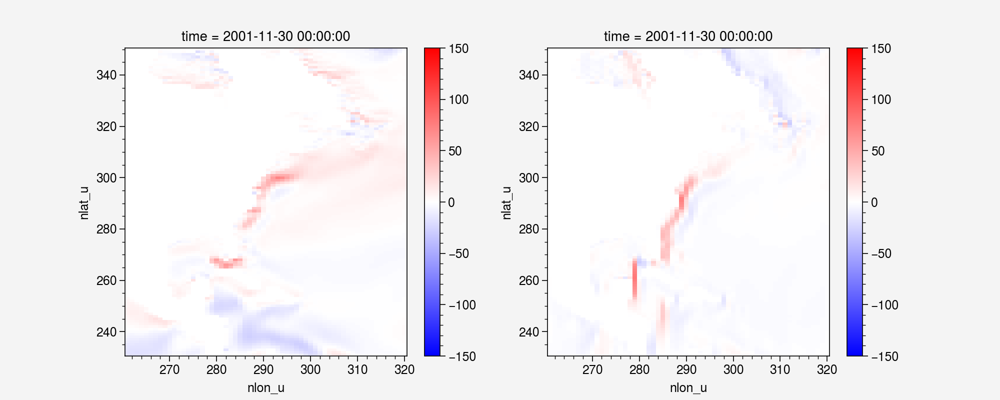

In [27]:
%%time
# compute gradient and geostrohpic vel 
dsshdx_TL, dsshdy_TL = x_gradh(xds_ssh_TL.SSH, grid_ssh_TL)  # xgcm metrics version
dsshdx_TL

ulat_r_TL = xds_ssh_TL.ULAT.isel(nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))
ulatm_r_TL = ulat_r_TL.where(kmu_r_TL>0, np.nan) # mask for land
f_r_TL = 2*omega*xr.ufuncs.sin(ulatm_r_TL/180*np.pi)
print(f_r_TL.values)

Vg_r_TL = dsshdx_TL.isel(nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))*g/f_r_TL*100 # cm/s
Vg_r_TL = Vg_r_TL.persist()
Ug_r_TL = -dsshdy_TL.isel(nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))*g/f_r_TL*100 # cm/s
Ug_r_TL = Ug_r_TL.persist()

# compute gradient and geostrohpic vel 
dsshdx_CL, dsshdy_CL = x_gradh(xds_ssh_CL.SSH, grid_ssh_CL)  # xgcm metrics version
dsshdx_CL

Vg_r_CL = dsshdx_CL.isel(nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))*g/f_r_TL*100 # cm/s
Vg_r_CL = Vg_r_CL.persist()
Ug_r_CL = -dsshdy_CL.isel(nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))*g/f_r_TL*100 # cm/s
Ug_r_CL = Ug_r_CL.persist()

fig, axs = plt.subplots(1,2,figsize=(10,4))
Ug_r_TL.isel(time=10).plot(ax=axs[0],vmin=-150, vmax=150, cmap='bwr')
Vg_r_TL.isel(time=10).plot(ax=axs[1],vmin=-150, vmax=150, cmap='bwr')
Vg_r_TL

,Array,Chunk
Bytes,3.13 GiB,10.92 MiB
Shape,"(1200, 700, 500)","(12, 399, 299)"
Count,10820 Tasks,2000 Chunks
Type,float64,numpy.ndarray


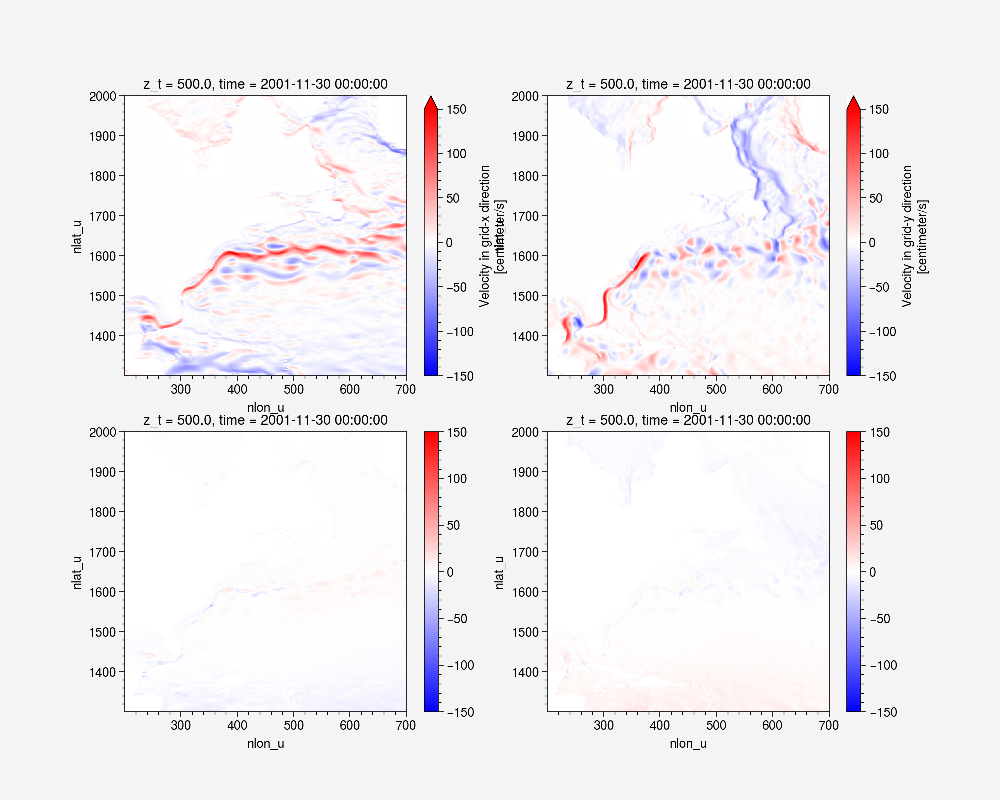

In [28]:
# compuate ageostrophic vel TH 
vvel_r_TH = xds_uvel_TH.VVEL.isel(z_t=0, nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12)) # cm/s
vvel_r_TH = vvel_r_TH.persist()
uvel_r_TH = xds_uvel_TH.UVEL.isel(z_t=0, nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12)) # cm/s
uvel_r_TH = uvel_r_TH.persist()

# uvel_r_TH = uvel_r_TH.assign_coords(time=time_vvel_s_TH)
# vvel_r_TH = vvel_r_TH.assign_coords(time=time_vvel_s_TH)
# uvel_r_TH.time.values, Ug_r_TH.time.values

Uag_r_TH = uvel_r_TH - Ug_r_TH
Vag_r_TH = vvel_r_TH - Vg_r_TH

# compuate ageostrophic vel CH 
vvel_r_CH = xds_uvel_CH.VVEL.isel(z_t=0, nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12)) # cm/s
vvel_r_CH = vvel_r_CH.persist()
uvel_r_CH = xds_uvel_CH.UVEL.isel(z_t=0, nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12)) # cm/s
uvel_r_CH = uvel_r_CH.persist()

Uag_r_CH = uvel_r_CH - Ug_r_CH
Vag_r_CH = vvel_r_CH - Vg_r_CH

fig, axs = plt.subplots(2,2,figsize=(10,8))
uvel_r_TH.isel(time=10).plot(ax=axs[0,0],vmin=-150, vmax=150, cmap='bwr')
vvel_r_TH.isel(time=10).plot(ax=axs[0,1],vmin=-150, vmax=150, cmap='bwr')
Uag_r_TH.isel(time=10).plot(ax=axs[1,0],vmin=-150, vmax=150, cmap='bwr')
Vag_r_TH.isel(time=10).plot(ax=axs[1,1],vmin=-150, vmax=150, cmap='bwr')
Uag_r_TH

<xarray.DataArray (time: 1199, nlat_u: 120, nlon_u: 60)>
dask.array<sub, shape=(1199, 120, 60), dtype=float64, chunksize=(1139, 120, 59), chunktype=numpy.ndarray>
Coordinates:
    z_t      float32 500.0
    ULONG    (nlat_u, nlon_u) float64 dask.array<chunksize=(120, 60), meta=np.ndarray>
    ULAT     (nlat_u, nlon_u) float64 dask.array<chunksize=(120, 60), meta=np.ndarray>
  * time     (time) object 2001-01-31 00:00:00 ... 2100-12-31 00:00:00
  * nlon_u   (nlon_u) int64 261 262 263 264 265 266 ... 315 316 317 318 319 320
  * nlat_u   (nlat_u) int64 231 232 233 234 235 236 ... 345 346 347 348 349 350

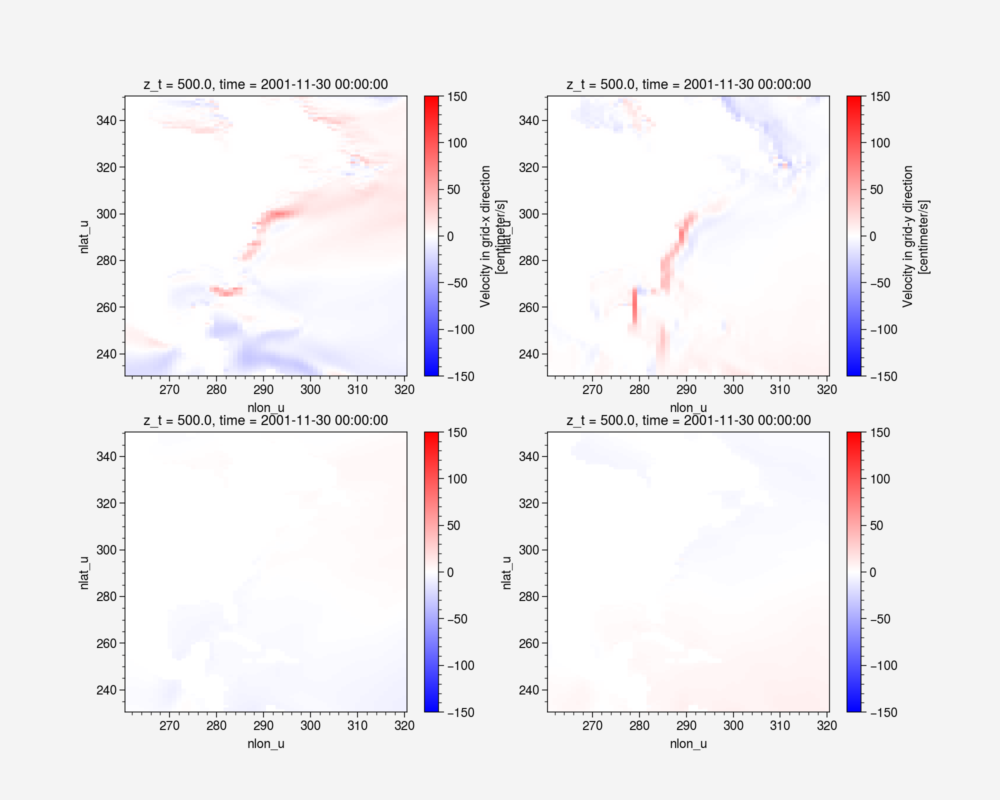

In [29]:
# compuate ageostrophic vel TL 
vvel_r_TL = xds_uvel_TL.VVEL.isel(z_t=0, nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16)) # cm/s
vvel_r_TL = vvel_r_TL.persist()
uvel_r_TL = xds_uvel_TL.UVEL.isel(z_t=0, nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16)) # cm/s
uvel_r_TL = uvel_r_TL.persist()

Uag_r_TL = uvel_r_TL - Ug_r_TL
Vag_r_TL = vvel_r_TL - Vg_r_TL

# compuate ageostrophic vel CL 
vvel_r_CL = xds_uvel_CL.VVEL.isel(z_t=0, nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16)) # cm/s
vvel_r_CL = vvel_r_CL.persist()
uvel_r_CL = xds_uvel_CL.UVEL.isel(z_t=0, nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16)) # cm/s
uvel_r_CL = uvel_r_CL.persist()

Uag_r_CL = uvel_r_CL - Ug_r_CL
Vag_r_CL = vvel_r_CL - Vg_r_CL

fig, axs = plt.subplots(2,2,figsize=(10,8))
uvel_r_TL.isel(time=10).plot(ax=axs[0,0],vmin=-150, vmax=150, cmap='bwr')
vvel_r_TL.isel(time=10).plot(ax=axs[0,1],vmin=-150, vmax=150, cmap='bwr')
Uag_r_TL.isel(time=10).plot(ax=axs[1,0],vmin=-150, vmax=150, cmap='bwr')
Vag_r_TL.isel(time=10).plot(ax=axs[1,1],vmin=-150, vmax=150, cmap='bwr')
Uag_r_TL

In [30]:
# interp temp from Tgrids to Ugrids TH
print(xds_uvel_TH.PD.isel(z_t=0).dims)
pd_u_z1_TH = grid_uvel_TH.interp(xds_uvel_TH.PD.isel(z_t=0),axis=['X','Y'], boundary='extend').rename('PD_u')
print(pd_u_z1_TH.dims)
pd_u_z1_r_TH = pd_u_z1_TH.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12)).persist()

# interp temp from Tgrids to Ugrids CH
pd_u_z1_CH = grid_uvel_CH.interp(xds_uvel_CH.PD.isel(z_t=0),axis=['X','Y'], boundary='extend').rename('PD_u')
pd_u_z1_r_CH = pd_u_z1_CH.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12)).persist()

pd_u_z1_r_TH

('time', 'nlat_t', 'nlon_t')
('time', 'nlat_u', 'nlon_u')


,Array,Chunk
Bytes,1.56 GiB,5.46 MiB
Shape,"(1200, 700, 500)","(12, 399, 299)"
Count,2000 Tasks,2000 Chunks
Type,float32,numpy.ndarray


In [31]:
# interp temp from Tgrids to Ugrids TL
print(xds_uvel_TL.PD.isel(z_t=0).dims)
pd_u_z1_TL = grid_uvel_TL.interp(xds_uvel_TL.PD.isel(z_t=0),axis=['X','Y'], boundary='extend').rename('PD_u')
print(pd_u_z1_TL.dims)
pd_u_z1_r_TL = pd_u_z1_TL.isel(nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16)).persist()

# interp temp from Tgrids to Ugrids CL
pd_u_z1_CL = grid_uvel_CL.interp(xds_uvel_CL.PD.isel(z_t=0),axis=['X','Y'], boundary='extend').rename('PD_u')
pd_u_z1_r_CL = pd_u_z1_CL.isel(nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16)).persist()
pd_u_z1_r_TL

('time', 'nlat_t', 'nlon_t')
('time', 'nlat_u', 'nlon_u')


<xarray.DataArray 'PD_u' (time: 1199, nlat_u: 120, nlon_u: 60)>
dask.array<getitem, shape=(1199, 120, 60), dtype=float32, chunksize=(1139, 120, 59), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 2001-01-31 00:00:00 ... 2100-12-31 00:00:00
  * nlat_u   (nlat_u) int64 231 232 233 234 235 236 ... 345 346 347 348 349 350
  * nlon_u   (nlon_u) int64 261 262 263 264 265 266 ... 315 316 317 318 319 320

In [32]:
# mass flux TH 
UPD_z1_r_TH = (pd_u_z1_r_TH * uvel_r_TH).persist() # pd: k/cm3
UgPD_z1_r_TH = (pd_u_z1_r_TH * Ug_r_TH).persist()
UagPD_z1_r_TH = (pd_u_z1_r_TH * Uag_r_TH).persist()

VPD_z1_r_TH = (pd_u_z1_r_TH * vvel_r_TH).persist()
VgPD_z1_r_TH = (pd_u_z1_r_TH * Vg_r_TH).persist()
VagPD_z1_r_TH = (pd_u_z1_r_TH * Vag_r_TH).persist()

# mass flux CH 
UPD_z1_r_CH = (pd_u_z1_r_CH * uvel_r_CH).persist() # pd: k/cm3
UgPD_z1_r_CH = (pd_u_z1_r_CH * Ug_r_CH).persist()
UagPD_z1_r_CH = (pd_u_z1_r_CH * Uag_r_CH).persist()

VPD_z1_r_CH = (pd_u_z1_r_CH * vvel_r_CH).persist()
VgPD_z1_r_CH = (pd_u_z1_r_CH * Vg_r_CH).persist()
VagPD_z1_r_CH = (pd_u_z1_r_CH * Vag_r_CH).persist()

UagPD_z1_r_TH

,Array,Chunk
Bytes,3.13 GiB,10.92 MiB
Shape,"(1200, 700, 500)","(12, 399, 299)"
Count,2000 Tasks,2000 Chunks
Type,float64,numpy.ndarray


In [33]:
# mass flux TL
UPD_z1_r_TL = (pd_u_z1_r_TL * uvel_r_TL).persist()
UgPD_z1_r_TL = (pd_u_z1_r_TL * Ug_r_TL).persist()
UagPD_z1_r_TL = (pd_u_z1_r_TL * Uag_r_TL).persist()

VPD_z1_r_TL = (pd_u_z1_r_TL * vvel_r_TL).persist()
VgPD_z1_r_TL = (pd_u_z1_r_TL * Vg_r_TL).persist()
VagPD_z1_r_TL = (pd_u_z1_r_TL * Vag_r_TL).persist()

# mass flux CL
UPD_z1_r_CL = (pd_u_z1_r_CL * uvel_r_CL).persist()
UgPD_z1_r_CL = (pd_u_z1_r_CL * Ug_r_CL).persist()
UagPD_z1_r_CL = (pd_u_z1_r_CL * Uag_r_CL).persist()

VPD_z1_r_CL = (pd_u_z1_r_CL * vvel_r_CL).persist()
VgPD_z1_r_CL = (pd_u_z1_r_CL * Vg_r_CL).persist()
VagPD_z1_r_CL = (pd_u_z1_r_CL * Vag_r_CL).persist()

UagPD_z1_r_TL

<xarray.DataArray (time: 1199, nlat_u: 120, nlon_u: 60)>
dask.array<mul, shape=(1199, 120, 60), dtype=float64, chunksize=(1139, 120, 59), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 2001-01-31 00:00:00 ... 2100-12-31 00:00:00
  * nlat_u   (nlat_u) int64 231 232 233 234 235 236 ... 345 346 347 348 349 350
  * nlon_u   (nlon_u) int64 261 262 263 264 265 266 ... 315 316 317 318 319 320
    z_t      float32 500.0
    ULONG    (nlat_u, nlon_u) float64 dask.array<chunksize=(120, 60), meta=np.ndarray>
    ULAT     (nlat_u, nlon_u) float64 dask.array<chunksize=(120, 60), meta=np.ndarray>

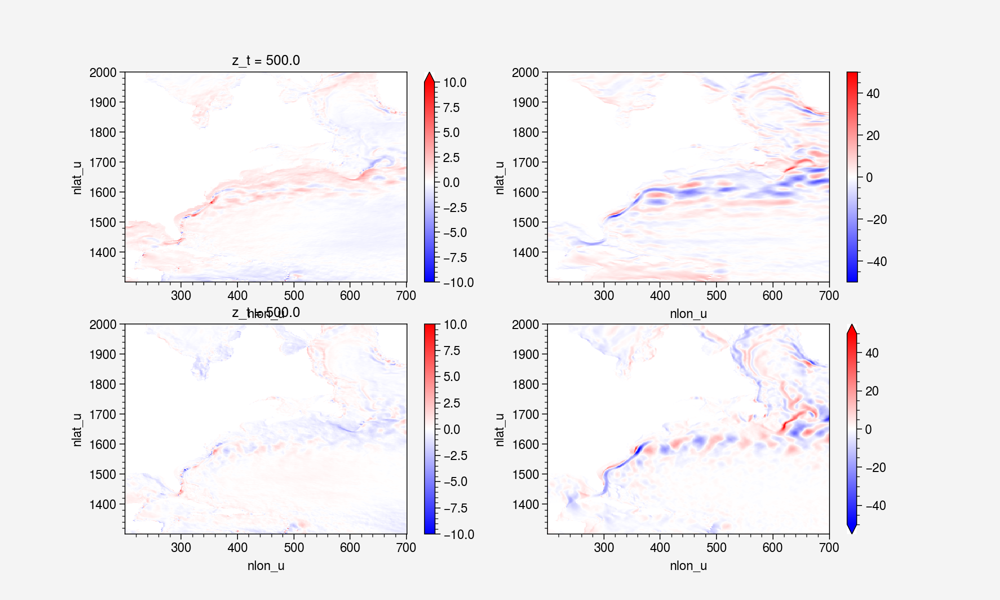

In [34]:
# mass flux t1 and t2 mean, and differece TH 
UagPD_z1_r_t1av_TH = UagPD_z1_r_TH.sel(time=slice('2001','2020')).mean('time').compute()
UgPD_z1_r_t1av_TH = UgPD_z1_r_TH.sel(time=slice('2001','2020')).mean('time').compute()
UPD_z1_r_t1av_TH = UPD_z1_r_TH.sel(time=slice('2001','2020')).mean('time').compute()

UagPD_z1_r_t2av_TH = UagPD_z1_r_TH.sel(time=slice('2081','2100')).mean('time').compute()
UgPD_z1_r_t2av_TH = UgPD_z1_r_TH.sel(time=slice('2081','2100')).mean('time').compute()
UPD_z1_r_t2av_TH = UPD_z1_r_TH.sel(time=slice('2081','2100')).mean('time').compute()

VagPD_z1_r_t1av_TH = VagPD_z1_r_TH.sel(time=slice('2001','2020')).mean('time').compute()
VgPD_z1_r_t1av_TH = VgPD_z1_r_TH.sel(time=slice('2001','2020')).mean('time').compute()
VPD_z1_r_t1av_TH = VPD_z1_r_TH.sel(time=slice('2001','2020')).mean('time').compute()

VagPD_z1_r_t2av_TH = VagPD_z1_r_TH.sel(time=slice('2081','2100')).mean('time').compute()
VgPD_z1_r_t2av_TH = VgPD_z1_r_TH.sel(time=slice('2081','2100')).mean('time').compute()
VPD_z1_r_t2av_TH = VPD_z1_r_TH.sel(time=slice('2081','2100')).mean('time').compute()

UagPD_z1_r_dt_TH = (UagPD_z1_r_t2av_TH-UagPD_z1_r_t1av_TH)
UgPD_z1_r_dt_TH = (UgPD_z1_r_t2av_TH-UgPD_z1_r_t1av_TH)
VagPD_z1_r_dt_TH = (VagPD_z1_r_t2av_TH-VagPD_z1_r_t1av_TH)
VgPD_z1_r_dt_TH = (VgPD_z1_r_t2av_TH-VgPD_z1_r_t1av_TH)

# mass flux t1 and t2 mean, and differece CH 
UagPD_z1_r_t1av_CH = UagPD_z1_r_CH.sel(time=slice('0401','0420')).mean('time').compute()
UgPD_z1_r_t1av_CH = UgPD_z1_r_CH.sel(time=slice('0401','0420')).mean('time').compute()
UPD_z1_r_t1av_CH = UPD_z1_r_CH.sel(time=slice('0401','0420')).mean('time').compute()

UagPD_z1_r_t2av_CH = UagPD_z1_r_CH.sel(time=slice('0481','0500')).mean('time').compute()
UgPD_z1_r_t2av_CH = UgPD_z1_r_CH.sel(time=slice('0481','0500')).mean('time').compute()
UPD_z1_r_t2av_CH = UPD_z1_r_CH.sel(time=slice('0481','0500')).mean('time').compute()

VagPD_z1_r_t1av_CH = VagPD_z1_r_CH.sel(time=slice('0401','0420')).mean('time').compute()
VgPD_z1_r_t1av_CH = VgPD_z1_r_CH.sel(time=slice('0401','0420')).mean('time').compute()
VPD_z1_r_t1av_CH = VPD_z1_r_CH.sel(time=slice('0401','0420')).mean('time').compute()

VagPD_z1_r_t2av_CH = VagPD_z1_r_CH.sel(time=slice('0481','0500')).mean('time').compute()
VgPD_z1_r_t2av_CH = VgPD_z1_r_CH.sel(time=slice('0481','0500')).mean('time').compute()
VPD_z1_r_t2av_CH = VPD_z1_r_CH.sel(time=slice('0481','0500')).mean('time').compute()

UagPD_z1_r_dt_CH = (UagPD_z1_r_t2av_CH-UagPD_z1_r_t1av_CH)
UgPD_z1_r_dt_CH = (UgPD_z1_r_t2av_CH-UgPD_z1_r_t1av_CH)
VagPD_z1_r_dt_CH = (VagPD_z1_r_t2av_CH-VagPD_z1_r_t1av_CH)
VgPD_z1_r_dt_CH = (VgPD_z1_r_t2av_CH-VgPD_z1_r_t1av_CH)

UgPD_z1_r_dt_THmCH = UgPD_z1_r_dt_TH - UgPD_z1_r_dt_CH
VgPD_z1_r_dt_THmCH = VgPD_z1_r_dt_TH - VgPD_z1_r_dt_CH

UagPD_z1_r_dt_THmCH = UagPD_z1_r_dt_TH - UagPD_z1_r_dt_CH
VagPD_z1_r_dt_THmCH = VagPD_z1_r_dt_TH - VagPD_z1_r_dt_CH

fig, axs = plt.subplots(2,2,figsize=(10,6))
UagPD_z1_r_dt_THmCH.where(kmu_r_TH>0, np.nan).plot(ax=axs[0,0],vmin=-10, vmax=10, cmap='bwr')
UgPD_z1_r_dt_THmCH.where(kmu_r_TH>0, np.nan).plot(ax=axs[0,1],vmin=-50, vmax=50, cmap='bwr')

VagPD_z1_r_dt_THmCH.where(kmu_r_TH>0, np.nan).plot(ax=axs[1,0],vmin=-10, vmax=10, cmap='bwr')
VgPD_z1_r_dt_THmCH.where(kmu_r_TH>0, np.nan).plot(ax=axs[1,1],vmin=-50, vmax=50, cmap='bwr')
# (UPD_z1_r_t2av_TH-UPD_z1_r_t1av_TH).where(kmu_r_TH>0, np.nan).plot(ax=axs[2],vmin=-0.8, vmax=0.8, cmap='bwr')

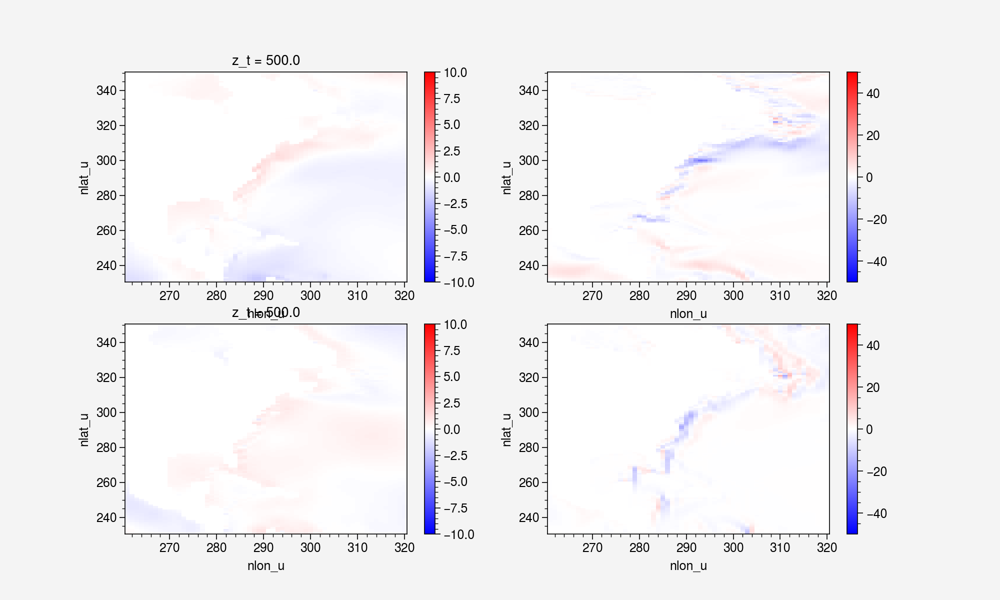

In [35]:
# mass flux t1 and t2 mean, and differece TL
UagPD_z1_r_t1av_TL = UagPD_z1_r_TL.sel(time=slice('2001','2020')).mean('time').compute()
UgPD_z1_r_t1av_TL = UgPD_z1_r_TL.sel(time=slice('2001','2020')).mean('time').compute()
UPD_z1_r_t1av_TL = UPD_z1_r_TL.sel(time=slice('2001','2020')).mean('time').compute()

UagPD_z1_r_t2av_TL = UagPD_z1_r_TL.sel(time=slice('2081','2100')).mean('time').compute()
UgPD_z1_r_t2av_TL = UgPD_z1_r_TL.sel(time=slice('2081','2100')).mean('time').compute()
UPD_z1_r_t2av_TL = UPD_z1_r_TL.sel(time=slice('2081','2100')).mean('time').compute()

VagPD_z1_r_t1av_TL = VagPD_z1_r_TL.sel(time=slice('2001','2020')).mean('time').compute()
VgPD_z1_r_t1av_TL = VgPD_z1_r_TL.sel(time=slice('2001','2020')).mean('time').compute()
VPD_z1_r_t1av_TL = VPD_z1_r_TL.sel(time=slice('2001','2020')).mean('time').compute()

VagPD_z1_r_t2av_TL = VagPD_z1_r_TL.sel(time=slice('2081','2100')).mean('time').compute()
VgPD_z1_r_t2av_TL = VgPD_z1_r_TL.sel(time=slice('2081','2100')).mean('time').compute()
VPD_z1_r_t2av_TL = VPD_z1_r_TL.sel(time=slice('2081','2100')).mean('time').compute()

UagPD_z1_r_dt_TL = (UagPD_z1_r_t2av_TL-UagPD_z1_r_t1av_TL)
UgPD_z1_r_dt_TL = (UgPD_z1_r_t2av_TL-UgPD_z1_r_t1av_TL)
VagPD_z1_r_dt_TL = (VagPD_z1_r_t2av_TL-VagPD_z1_r_t1av_TL)
VgPD_z1_r_dt_TL = (VgPD_z1_r_t2av_TL-VgPD_z1_r_t1av_TL)

# mass flux t1 and t2 mean, and differece CL
UagPD_z1_r_t1av_CL = UagPD_z1_r_CL.sel(time=slice('0401','0420')).mean('time').compute()
UgPD_z1_r_t1av_CL = UgPD_z1_r_CL.sel(time=slice('0401','0420')).mean('time').compute()
UPD_z1_r_t1av_CL = UPD_z1_r_CL.sel(time=slice('0401','0420')).mean('time').compute()

UagPD_z1_r_t2av_CL = UagPD_z1_r_CL.sel(time=slice('0481','0500')).mean('time').compute()
UgPD_z1_r_t2av_CL = UgPD_z1_r_CL.sel(time=slice('0481','0500')).mean('time').compute()
UPD_z1_r_t2av_CL = UPD_z1_r_CL.sel(time=slice('0481','0500')).mean('time').compute()

VagPD_z1_r_t1av_CL = VagPD_z1_r_CL.sel(time=slice('0401','0420')).mean('time').compute()
VgPD_z1_r_t1av_CL = VgPD_z1_r_CL.sel(time=slice('0401','0420')).mean('time').compute()
VPD_z1_r_t1av_CL = VPD_z1_r_CL.sel(time=slice('0401','0420')).mean('time').compute()

VagPD_z1_r_t2av_CL = VagPD_z1_r_CL.sel(time=slice('0481','0500')).mean('time').compute()
VgPD_z1_r_t2av_CL = VgPD_z1_r_CL.sel(time=slice('0481','0500')).mean('time').compute()
VPD_z1_r_t2av_CL = VPD_z1_r_CL.sel(time=slice('0481','0500')).mean('time').compute()

UagPD_z1_r_dt_CL = (UagPD_z1_r_t2av_CL-UagPD_z1_r_t1av_CL)
UgPD_z1_r_dt_CL = (UgPD_z1_r_t2av_CL-UgPD_z1_r_t1av_CL)
VagPD_z1_r_dt_CL = (VagPD_z1_r_t2av_CL-VagPD_z1_r_t1av_CL)
VgPD_z1_r_dt_CL = (VgPD_z1_r_t2av_CL-VgPD_z1_r_t1av_CL)


UgPD_z1_r_dt_TLmCL = UgPD_z1_r_dt_TL - UgPD_z1_r_dt_CL
VgPD_z1_r_dt_TLmCL = VgPD_z1_r_dt_TL - VgPD_z1_r_dt_CL

UagPD_z1_r_dt_TLmCL = UagPD_z1_r_dt_TL - UagPD_z1_r_dt_CL
VagPD_z1_r_dt_TLmCL = VagPD_z1_r_dt_TL - VagPD_z1_r_dt_CL


fig, axs = plt.subplots(2,2,figsize=(10,6))
UagPD_z1_r_dt_TLmCL.where(kmu_r_TL>0, np.nan).plot(ax=axs[0,0],vmin=-10, vmax=10, cmap='bwr')
UgPD_z1_r_dt_TLmCL.where(kmu_r_TL>0, np.nan).plot(ax=axs[0,1],vmin=-50, vmax=50, cmap='bwr')

VagPD_z1_r_dt_TLmCL.where(kmu_r_TL>0, np.nan).plot(ax=axs[1,0],vmin=-10, vmax=10, cmap='bwr')
VgPD_z1_r_dt_TLmCL.where(kmu_r_TL>0, np.nan).plot(ax=axs[1,1],vmin=-50, vmax=50, cmap='bwr')
# (UPD_z1_r_t2av_TH-UPD_z1_r_t1av_TH).where(kmu_r_TH>0, np.nan).plot(ax=axs[2],vmin=-0.8, vmax=0.8, cmap='bwr')

In [36]:
# compute Vg spd HR
spd_Vg_r_TH = xr.ufuncs.sqrt(Ug_r_TH**2 + Vg_r_TH**2)
spd_Vg_r_CH = xr.ufuncs.sqrt(Ug_r_CH**2 + Vg_r_CH**2)

spd_Vg_r_t1av_TH = spd_Vg_r_TH.sel(time=slice('2001','2020')).mean('time')
spd_Vg_r_t2av_TH = spd_Vg_r_TH.sel(time=slice('2081','2100')).mean('time')

spd_Vg_r_t1av_CH = spd_Vg_r_CH.sel(time=slice('0401','0420')).mean('time')
spd_Vg_r_t2av_CH = spd_Vg_r_CH.sel(time=slice('0481','0500')).mean('time')

spd_Vg_r_dt_TH = (spd_Vg_r_t2av_TH - spd_Vg_r_t1av_TH).compute()
spd_Vg_r_dt_CH = (spd_Vg_r_t2av_CH - spd_Vg_r_t1av_CH).compute()

spd_Vg_r_dt_THmCH = spd_Vg_r_dt_TH - spd_Vg_r_dt_CH

# compute Vag spd var TH
spd_Vag_r_TH = xr.ufuncs.sqrt(Uag_r_TH**2 + Vag_r_TH**2)
spd_Vag_r_t1var_TH = spd_Vag_r_TH.sel(time=slice('2001','2020')).var('time').compute()
spd_Vag_r_t1var_TH

<xarray.DataArray (nlat_u: 700, nlon_u: 500)>
array([[9.04668673, 8.90767492, 9.02560349, ..., 5.37750721, 5.42279561,
        5.48995162],
       [8.60401281, 8.4497919 , 8.42183711, ..., 5.20132965, 5.22972961,
        5.26348865],
       [8.65476285, 8.42901201, 8.3146225 , ..., 4.89909161, 4.94193977,
        4.99563277],
       ...,
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan]])
Coordinates:
    z_t      float32 500.0
    ULONG    (nlat_u, nlon_u) float64 -89.9 -89.8 -89.7 -89.6 ... -1.0 -1.0 -1.0
    ULAT     (nlat_u, nlon_u) float64 11.82 11.82 11.82 11.82 ... -1.0 -1.0 -1.0
  * nlon_u   (nlon_u) int64 201 202 203 204 205 206 ... 695 696 697 698 699 700
  * nlat_u   (nlat_u) int64 1301 1302 1303 1304 1305 ... 1997 1998 1999 2000

In [37]:
# compute Vg spd LR
spd_Vg_r_TL = xr.ufuncs.sqrt(Ug_r_TL**2 + Vg_r_TL**2)
spd_Vg_r_CL = xr.ufuncs.sqrt(Ug_r_CL**2 + Vg_r_CL**2)

spd_Vg_r_t1av_TL = spd_Vg_r_TL.sel(time=slice('2001','2020')).mean('time')
spd_Vg_r_t2av_TL = spd_Vg_r_TL.sel(time=slice('2081','2100')).mean('time')

spd_Vg_r_t1av_CL = spd_Vg_r_CL.sel(time=slice('0401','0420')).mean('time')
spd_Vg_r_t2av_CL = spd_Vg_r_CL.sel(time=slice('0481','0500')).mean('time')

spd_Vg_r_dt_TL = (spd_Vg_r_t2av_TL - spd_Vg_r_t1av_TL).compute()
spd_Vg_r_dt_CL = (spd_Vg_r_t2av_CL - spd_Vg_r_t1av_CL).compute()

spd_Vg_r_dt_TLmCL = spd_Vg_r_dt_TL - spd_Vg_r_dt_CL

# compute Vag spd var TL
spd_Vag_r_TL = xr.ufuncs.sqrt(Uag_r_TL**2 + Vag_r_TL**2)
spd_Vag_r_t1var_TL = spd_Vag_r_TL.sel(time=slice('2001','2020')).var('time').compute()
spd_Vag_r_t1var_TL

<xarray.DataArray (nlat_u: 120, nlon_u: 60)>
array([[7.94195858, 8.40063453, 9.24085106, ..., 5.37429307, 5.71851921,
        6.14565247],
       [7.11481278, 7.51446685, 8.22398791, ..., 4.41953493, 4.70435312,
        5.04241312],
       [6.23284636, 6.5038597 , 7.06293922, ..., 3.64069746, 3.88494598,
        4.16525373],
       ...,
       [       nan,        nan,        nan, ..., 3.81484873, 3.77998892,
        3.76491568],
       [       nan,        nan,        nan, ..., 3.93775772, 3.86672952,
        3.84086851],
       [       nan,        nan,        nan, ..., 3.85011594, 3.84478495,
        3.79669239]])
Coordinates:
    z_t      float32 500.0
    ULONG    (nlat_u, nlon_u) float64 253.6 254.8 255.9 ... 318.1 319.0 320.0
    ULAT     (nlat_u, nlon_u) float64 11.69 11.68 11.68 ... 58.74 58.73 58.73
  * nlon_u   (nlon_u) int64 261 262 263 264 265 266 ... 315 316 317 318 319 320
  * nlat_u   (nlat_u) int64 231 232 233 234 235 236 ... 345 346 347 348 349 350

# make pics

In [38]:
# need lat and lon (no masks over lands)
grid_t12, xds_t12 = pop_tools.to_xgcm_grid_dataset(ds_t12)
xds_t12
xds_r_t12 = xds_t12.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))

grid_g16, xds_g16 = pop_tools.to_xgcm_grid_dataset(ds_g16)
xds_g16
xds_r_g16 = xds_g16.isel(nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))

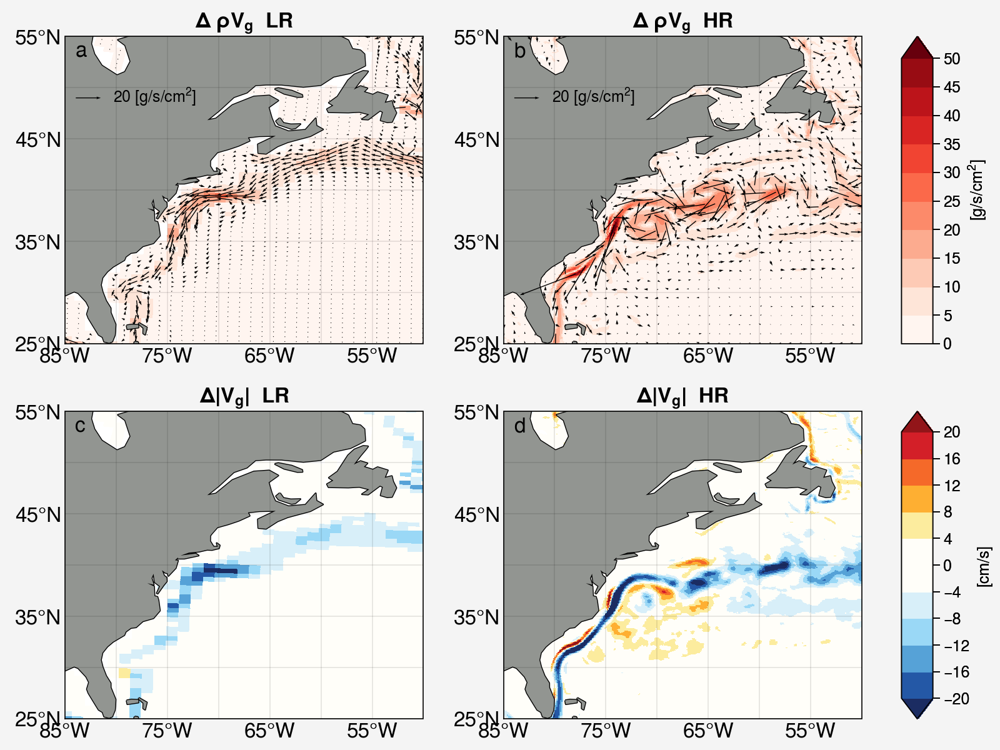

In [39]:
pc = cartopy.crs.PlateCarree()
lon_formatter = LongitudeFormatter(zero_direction_label=True)
lat_formatter = LatitudeFormatter()

# Fig 1 Vg*PD
fig1, axs = plot.subplots(nrows=2,ncols=2,proj='cyl',width='8in',height='6in')

spd_UgPD_z1_r_dt_TLmCL = xr.ufuncs.sqrt(UgPD_z1_r_dt_TLmCL**2+VgPD_z1_r_dt_TLmCL**2)
m00=axs[0,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, spd_UgPD_z1_r_dt_TLmCL, 
                        levels=np.arange(0, 50.01, 5), transform=pc, cmap="Reds", extend='max')
q00 = axs[0,0].quiver(xds_r_g16.ULONG, xds_r_g16.ULAT, UgPD_z1_r_dt_TLmCL, VgPD_z1_r_dt_TLmCL,
                      transform=pc, scale=100, scale_units='inches')
axs[0,0].quiverkey(q00, X=0.1, Y=0.8, U=20, label=r'20 [g/s/$cm^2$]', labelpos='E')
# axs[0,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[0,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,0].format(land=True, landcolor='grey')
axs[0,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,0].xaxis.set_major_formatter(lon_formatter)
axs[0,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,0].yaxis.set_major_formatter(lat_formatter)
axs[0,0].set_title(r'$\Delta$ $\rho V_{g}$  LR', fontsize=12, fontweight='bold')
axs[0,0].text(-84, 53, 'a', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')

spd_UgPD_z1_r_dt_THmCH = xr.ufuncs.sqrt(UgPD_z1_r_dt_THmCH**2+VgPD_z1_r_dt_THmCH**2)
m01=axs[0,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, spd_UgPD_z1_r_dt_THmCH, 
                        levels=np.arange(0, 50.01, 5), transform=pc, cmap="Reds", extend='max')
q01 = axs[0,1].quiver(xds_r_t12.ULONG[::10,::10], xds_r_t12.ULAT[::10,::10], 
                UgPD_z1_r_dt_THmCH[::10,::10], VgPD_z1_r_dt_THmCH[::10, ::10], transform=pc, scale=100, scale_units='inches')
q01.set_zorder(2)
axs[0,1].quiverkey(q01, X=0.1, Y=0.8, U=20, label=r'20 [g/s/$cm^2$]', labelpos='E')
axs[0,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,1].format(land=True, landcolor='grey')
axs[0,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,1].xaxis.set_major_formatter(lon_formatter)
axs[0,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,1].yaxis.set_major_formatter(lat_formatter)
axs[0,1].set_title(r'$\Delta$ $\rho V_{g}$  HR', fontsize=12, fontweight='bold')
axs[0,1].text(-84, 53, 'b', transform=pc, fontsize=12)
# add colorbar
cb = axs[0,1].colorbar(m01,loc='r', label=r'[g/s/$cm^2$]',width='2em')

cut=-0.1
m10=axs[1,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, spd_Vg_r_dt_TLmCL, 
                        levels=np.arange(-20,20+0.1,4), transform=pc, cmap="ColdHot", cmap_kw={'cut': cut}, extend='both')
# axs[1,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[1,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,0].format(land=True, landcolor='grey')
axs[1,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,0].xaxis.set_major_formatter(lon_formatter)
axs[1,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,0].yaxis.set_major_formatter(lat_formatter)
axs[1,0].set_title(r'$\Delta |V_{g}|$  LR', fontsize=12, fontweight='bold')
axs[1,0].text(-84, 53, 'c', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')


m11=axs[1,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, spd_Vg_r_dt_THmCH, 
                        levels=np.arange(-20,20+0.1,4), transform=pc, cmap="ColdHot", cmap_kw={'cut': cut}, extend='both')
axs[1,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,1].format(land=True, landcolor='grey')
axs[1,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,1].xaxis.set_major_formatter(lon_formatter)
axs[1,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,1].yaxis.set_major_formatter(lat_formatter)
axs[1,1].set_title(r'$\Delta |V_{g}|$  HR', fontsize=12, fontweight='bold')
axs[1,1].text(-84, 53, 'd', transform=pc, fontsize=12)
# add colorbar
cb = axs[1,1].colorbar(m11,loc='r', label='[cm/s]',width='2em')

# fig1.savefig(pic1,bbox_inches='tight')

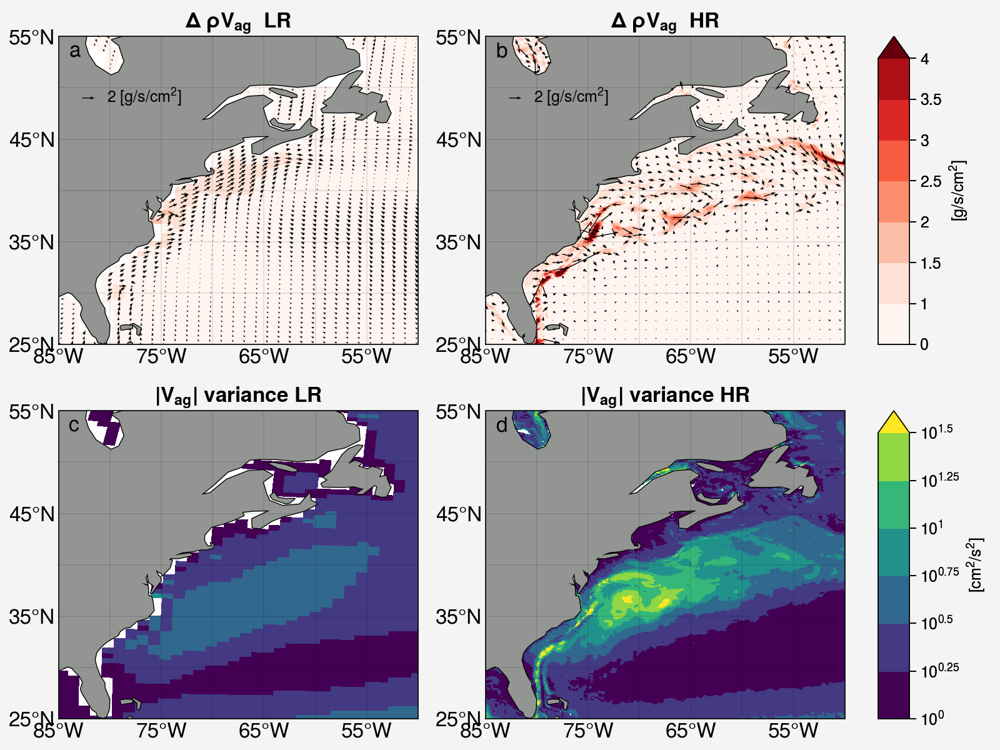

In [40]:
# Fig 2 Vag*PD
fig2, axs = plot.subplots(nrows=2,ncols=2,proj='cyl',width='8in',height='6in')
# np.arange(0, 4.01, 0.5)
spd_UagPD_z1_r_dt_TLmCL = xr.ufuncs.sqrt(UagPD_z1_r_dt_TLmCL**2+VagPD_z1_r_dt_TLmCL**2)
m00=axs[0,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, spd_UagPD_z1_r_dt_TLmCL, 
                        levels=[0,1,1.5,2,2.5,3,3.5,4], transform=pc, cmap="Reds", extend='max')
q00 = axs[0,0].quiver(xds_r_g16.ULONG, xds_r_g16.ULAT, UagPD_z1_r_dt_TLmCL, VagPD_z1_r_dt_TLmCL, 
                      transform=pc, scale=20, scale_units='inches',headwidth=3.5)
axs[0,0].quiverkey(q00, X=0.1, Y=0.8, U=2, label=r'2 [g/s/$cm^2$]', labelpos='E')
# axs[0,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[0,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,0].format(land=True, landcolor='grey')
axs[0,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,0].xaxis.set_major_formatter(lon_formatter)
axs[0,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,0].yaxis.set_major_formatter(lat_formatter)
axs[0,0].set_title(r'$\Delta$ $\rho V_{ag}$  LR', fontsize=12, fontweight='bold')
axs[0,0].text(-84, 53, 'a', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')


spd_UagPD_z1_r_dt_THmCH = xr.ufuncs.sqrt(UagPD_z1_r_dt_THmCH**2+VagPD_z1_r_dt_THmCH**2)
# spd_UagPD_z1_r_dt_TH = xr.ufuncs.sqrt(UagPD_z1_r_dt_TH**2+VagPD_z1_r_dt_TH**2)
m01=axs[0,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, spd_UagPD_z1_r_dt_THmCH, 
                        levels=[0,1,1.5,2,2.5,3,3.5,4], transform=pc, cmap="Reds", extend='max')
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG[::5,::5], xds_r_t12.ULAT[::5,::5], 
#                 UagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG, xds_r_t12.ULAT, 
#                 UagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
q01 = axs[0,1].quiver(xds_r_t12.ULONG[5::10,5::10], xds_r_t12.ULAT[5::10,5::10], 
                      UagPD_z1_r_dt_THmCH[5::10,5::10], VagPD_z1_r_dt_THmCH[5::10,5::10], 
                      transform=pc, scale=20, scale_units='inches',headwidth=3.5)
q01.set_zorder(2)
axs[0,1].quiverkey(q01, X=0.1, Y=0.8, U=2, label=r'2 [g/s/$cm^2$]', labelpos='E')
axs[0,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,1].format(land=True, landcolor='grey')
axs[0,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,1].xaxis.set_major_formatter(lon_formatter)
axs[0,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,1].yaxis.set_major_formatter(lat_formatter)
axs[0,1].set_title(r'$\Delta$ $\rho V_{ag}$  HR', fontsize=12, fontweight='bold')
axs[0,1].text(-84, 53, 'b', transform=pc, fontsize=12)
# add colorbar
cb = axs[0,1].colorbar(m01,loc='r', label=r'[g/s/$cm^2$]',width='2em')

m10=axs[1,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, np.log10(spd_Vag_r_t1var_TL), 
                        levels=np.arange(0, 1.5+0.1, 0.25), transform=pc, cmap="viridis", extend='max')
# axs[1,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[1,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,0].format(land=True, landcolor='grey')
axs[1,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,0].xaxis.set_major_formatter(lon_formatter)
axs[1,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,0].yaxis.set_major_formatter(lat_formatter)
axs[1,0].set_title(r'$|V_{ag}|$ variance LR', fontsize=12, fontweight='bold')
axs[1,0].text(-84, 53, 'c', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')

m11=axs[1,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, np.log10(spd_Vag_r_t1var_TH), 
                        levels=np.arange(0, 1.5+0.1, 0.25), transform=pc, cmap="viridis", extend='max')
axs[1,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,1].format(land=True, landcolor='grey')
axs[1,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,1].xaxis.set_major_formatter(lon_formatter)
axs[1,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,1].yaxis.set_major_formatter(lat_formatter)
axs[1,1].set_title(r'$|V_{ag}|$ variance HR', fontsize=12, fontweight='bold')
axs[1,1].text(-84, 53, 'd', transform=pc, fontsize=12)
# add colorbar
cb = axs[1,1].colorbar(m11,loc='r', label=r'[$cm^2$/$s^2$]',width='2em', ticks=np.arange(0,1.51,0.25), 
                       ticklabels=[r'$10^0$',r'$10^{0.25}$',r'$10^{0.5}$',r'$10^{0.75}$',r'$10^{1}$',r'$10^{1.25}$',r'$10^{1.5}$'])
# fig2.savefig(pic2,bbox_inches='tight')

In [54]:
# angle_r_TL = ds0_TL.ANGLE.isel(nlon=slice(nlon1_r_g16, nlon2_r_g16), nlat=slice(nlat1_r_g16, nlat2_r_g16)) # [rad]
# angle_r_TH = ds0_TH.ANGLE.isel(nlon=slice(nlon1_r_t12, nlon2_r_t12), nlat=slice(nlat1_r_t12, nlat2_r_t12)) # [rad]

# u1r_r_TL = np.cos(angle_r_TL)*u1_r_TL - np.sin(angle_r_TL)*v1_r_TL 
# v1r_r_TL = np.sin(angle_r_TL)*u1_r_TL + np.cos(angle_r_TL)*v1_r_TL 

# u1r_r_TH = np.cos(angle_r_TH)*u1_r_TH - np.sin(angle_r_TH)*v1_r_TH 
# v1r_r_TH = np.sin(angle_r_TH)*u1_r_TH + np.cos(angle_r_TH)*v1_r_TH 

angle_r_TH = xds_uvel_TH.ANGLE.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12)) # [rad]
angle_r_TL = xds_uvel_TL.ANGLE.isel(nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16)) # [rad]
# np.sin(np.pi/2)

UgPDr_z1_r_dt_THmCH = np.cos(angle_r_TH)*UgPD_z1_r_dt_THmCH - np.sin(angle_r_TH)*VgPD_z1_r_dt_THmCH
VgPDr_z1_r_dt_THmCH = np.sin(angle_r_TH)*UgPD_z1_r_dt_THmCH + np.cos(angle_r_TH)*VgPD_z1_r_dt_THmCH

UagPDr_z1_r_dt_THmCH = np.cos(angle_r_TH)*UagPD_z1_r_dt_THmCH - np.sin(angle_r_TH)*VagPD_z1_r_dt_THmCH
VagPDr_z1_r_dt_THmCH = np.sin(angle_r_TH)*UagPD_z1_r_dt_THmCH + np.cos(angle_r_TH)*VagPD_z1_r_dt_THmCH

UgPDr_z1_r_dt_TLmCL = np.cos(angle_r_TL)*UgPD_z1_r_dt_TLmCL - np.sin(angle_r_TL)*VgPD_z1_r_dt_TLmCL
VgPDr_z1_r_dt_TLmCL = np.sin(angle_r_TL)*UgPD_z1_r_dt_TLmCL + np.cos(angle_r_TL)*VgPD_z1_r_dt_TLmCL

UagPDr_z1_r_dt_TLmCL = np.cos(angle_r_TL)*UagPD_z1_r_dt_TLmCL - np.sin(angle_r_TL)*VagPD_z1_r_dt_TLmCL
VagPDr_z1_r_dt_TLmCL = np.sin(angle_r_TL)*UagPD_z1_r_dt_TLmCL + np.cos(angle_r_TL)*VagPD_z1_r_dt_TLmCL

/ihesp/software/conda/envs/xroms_unstable_daskpr/lib/python3.7/site-packages/dask/array/core.py:1527: FutureWarning: The `numpy.column_stack` function is not implemented by Dask array. You may want to use the da.map_blocks function or something similar to silence this warning. Your code may stop working in a future release.
  FutureWarning,
/ihesp/software/conda/envs/xroms_unstable_daskpr/lib/python3.7/site-packages/dask/array/core.py:1527: FutureWarning: The `numpy.column_stack` function is not implemented by Dask array. You may want to use the da.map_blocks function or something similar to silence this warning. Your code may stop working in a future release.
  FutureWarning,


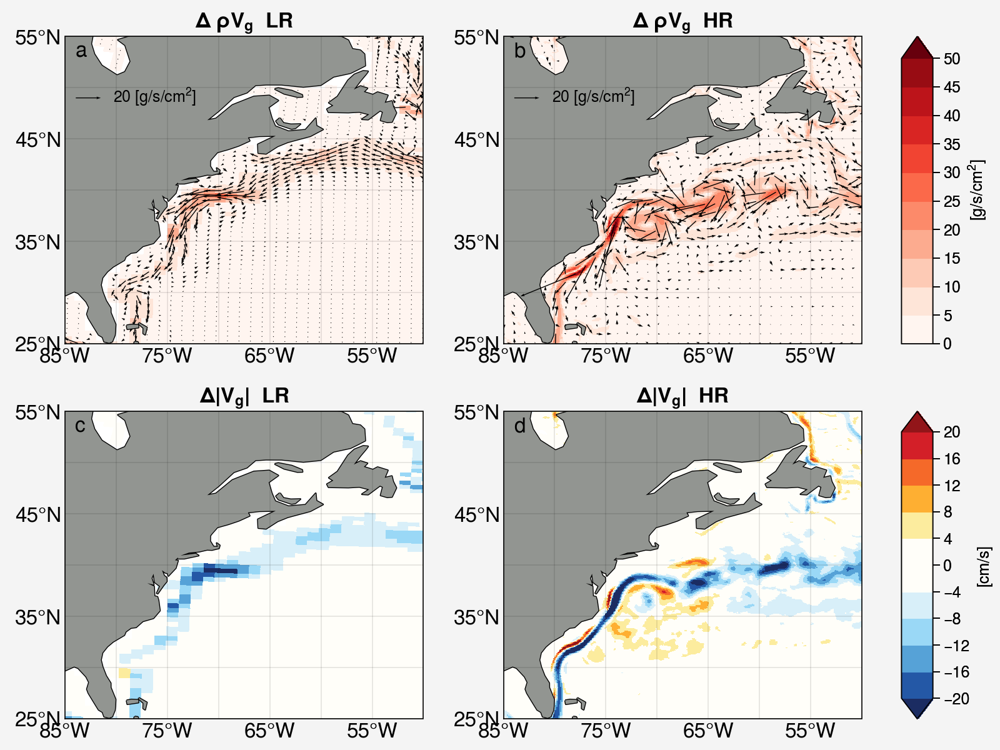

In [58]:
pc = cartopy.crs.PlateCarree()
lon_formatter = LongitudeFormatter(zero_direction_label=True)
lat_formatter = LatitudeFormatter()

# Fig 1 Vg*PD
fig1, axs = plot.subplots(nrows=2,ncols=2,proj='cyl',width='8in',height='6in')

spd_UgPD_z1_r_dt_TLmCL = xr.ufuncs.sqrt(UgPD_z1_r_dt_TLmCL**2+VgPD_z1_r_dt_TLmCL**2)
m00=axs[0,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, spd_UgPD_z1_r_dt_TLmCL, 
                        levels=np.arange(0, 50.01, 5), transform=pc, cmap="Reds", extend='max')
q00 = axs[0,0].quiver(xds_r_g16.ULONG, xds_r_g16.ULAT, UgPDr_z1_r_dt_TLmCL, VgPDr_z1_r_dt_TLmCL,
                      transform=pc, scale=100, scale_units='inches')
axs[0,0].quiverkey(q00, X=0.1, Y=0.8, U=20, label=r'20 [g/s/$cm^2$]', labelpos='E')
# axs[0,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[0,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,0].format(land=True, landcolor='grey')
axs[0,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,0].xaxis.set_major_formatter(lon_formatter)
axs[0,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,0].yaxis.set_major_formatter(lat_formatter)
axs[0,0].set_title(r'$\Delta$ $\rho V_{g}$  LR', fontsize=12, fontweight='bold')
axs[0,0].text(-84, 53, 'a', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')

spd_UgPD_z1_r_dt_THmCH = xr.ufuncs.sqrt(UgPD_z1_r_dt_THmCH**2+VgPD_z1_r_dt_THmCH**2)
m01=axs[0,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, spd_UgPD_z1_r_dt_THmCH, 
                        levels=np.arange(0, 50.01, 5), transform=pc, cmap="Reds", extend='max')
q01 = axs[0,1].quiver(xds_r_t12.ULONG[::10,::10], xds_r_t12.ULAT[::10,::10], 
                UgPDr_z1_r_dt_THmCH[::10,::10], VgPDr_z1_r_dt_THmCH[::10, ::10], transform=pc, scale=100, scale_units='inches')
q01.set_zorder(2)
axs[0,1].quiverkey(q01, X=0.1, Y=0.8, U=20, label=r'20 [g/s/$cm^2$]', labelpos='E')
axs[0,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,1].format(land=True, landcolor='grey')
axs[0,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,1].xaxis.set_major_formatter(lon_formatter)
axs[0,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,1].yaxis.set_major_formatter(lat_formatter)
axs[0,1].set_title(r'$\Delta$ $\rho V_{g}$  HR', fontsize=12, fontweight='bold')
axs[0,1].text(-84, 53, 'b', transform=pc, fontsize=12)
# add colorbar
cb = axs[0,1].colorbar(m01,loc='r', label=r'[g/s/$cm^2$]',width='2em')

cut=-0.1
m10=axs[1,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, spd_Vg_r_dt_TLmCL, 
                        levels=np.arange(-20,20+0.1,4), transform=pc, cmap="ColdHot", cmap_kw={'cut': cut}, extend='both')
# axs[1,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[1,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,0].format(land=True, landcolor='grey')
axs[1,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,0].xaxis.set_major_formatter(lon_formatter)
axs[1,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,0].yaxis.set_major_formatter(lat_formatter)
axs[1,0].set_title(r'$\Delta |V_{g}|$  LR', fontsize=12, fontweight='bold')
axs[1,0].text(-84, 53, 'c', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')


m11=axs[1,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, spd_Vg_r_dt_THmCH, 
                        levels=np.arange(-20,20+0.1,4), transform=pc, cmap="ColdHot", cmap_kw={'cut': cut}, extend='both')
axs[1,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,1].format(land=True, landcolor='grey')
axs[1,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,1].xaxis.set_major_formatter(lon_formatter)
axs[1,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,1].yaxis.set_major_formatter(lat_formatter)
axs[1,1].set_title(r'$\Delta |V_{g}|$  HR', fontsize=12, fontweight='bold')
axs[1,1].text(-84, 53, 'd', transform=pc, fontsize=12)
# add colorbar
cb = axs[1,1].colorbar(m11,loc='r', label='[cm/s]',width='2em')

# fig1.savefig(pic1,bbox_inches='tight')

/ihesp/software/conda/envs/xroms_unstable_daskpr/lib/python3.7/site-packages/dask/array/core.py:1527: FutureWarning: The `numpy.column_stack` function is not implemented by Dask array. You may want to use the da.map_blocks function or something similar to silence this warning. Your code may stop working in a future release.
  FutureWarning,
/ihesp/software/conda/envs/xroms_unstable_daskpr/lib/python3.7/site-packages/dask/array/core.py:1527: FutureWarning: The `numpy.column_stack` function is not implemented by Dask array. You may want to use the da.map_blocks function or something similar to silence this warning. Your code may stop working in a future release.
  FutureWarning,


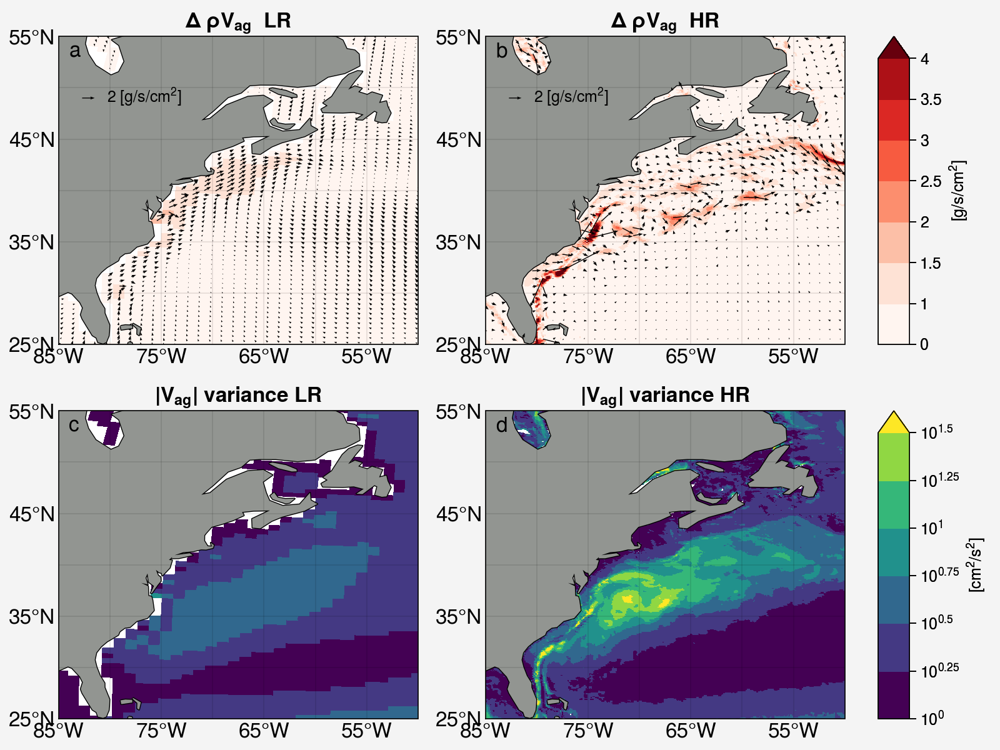

In [55]:
# Fig 2 Vag*PD
fig2, axs = plot.subplots(nrows=2,ncols=2,proj='cyl',width='8in',height='6in')
# np.arange(0, 4.01, 0.5)
spd_UagPD_z1_r_dt_TLmCL = xr.ufuncs.sqrt(UagPD_z1_r_dt_TLmCL**2+VagPD_z1_r_dt_TLmCL**2)
m00=axs[0,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, spd_UagPD_z1_r_dt_TLmCL, 
                        levels=[0,1,1.5,2,2.5,3,3.5,4], transform=pc, cmap="Reds", extend='max')
q00 = axs[0,0].quiver(xds_r_g16.ULONG, xds_r_g16.ULAT, UagPDr_z1_r_dt_TLmCL, VagPDr_z1_r_dt_TLmCL, 
                      transform=pc, scale=20, scale_units='inches',headwidth=3.5)
axs[0,0].quiverkey(q00, X=0.1, Y=0.8, U=2, label=r'2 [g/s/$cm^2$]', labelpos='E')
# axs[0,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[0,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,0].format(land=True, landcolor='grey')
axs[0,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,0].xaxis.set_major_formatter(lon_formatter)
axs[0,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,0].yaxis.set_major_formatter(lat_formatter)
axs[0,0].set_title(r'$\Delta$ $\rho V_{ag}$  LR', fontsize=12, fontweight='bold')
axs[0,0].text(-84, 53, 'a', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')


spd_UagPD_z1_r_dt_THmCH = xr.ufuncs.sqrt(UagPD_z1_r_dt_THmCH**2+VagPD_z1_r_dt_THmCH**2)
# spd_UagPD_z1_r_dt_TH = xr.ufuncs.sqrt(UagPD_z1_r_dt_TH**2+VagPD_z1_r_dt_TH**2)
m01=axs[0,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, spd_UagPD_z1_r_dt_THmCH, 
                        levels=[0,1,1.5,2,2.5,3,3.5,4], transform=pc, cmap="Reds", extend='max')
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG[::5,::5], xds_r_t12.ULAT[::5,::5], 
#                 UagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG, xds_r_t12.ULAT, 
#                 UagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
q01 = axs[0,1].quiver(xds_r_t12.ULONG[5::10,5::10], xds_r_t12.ULAT[5::10,5::10], 
                      UagPDr_z1_r_dt_THmCH[5::10,5::10], VagPDr_z1_r_dt_THmCH[5::10,5::10], 
                      transform=pc, scale=20, scale_units='inches',headwidth=3.5)
q01.set_zorder(2)
axs[0,1].quiverkey(q01, X=0.1, Y=0.8, U=2, label=r'2 [g/s/$cm^2$]', labelpos='E')
axs[0,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,1].format(land=True, landcolor='grey')
axs[0,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,1].xaxis.set_major_formatter(lon_formatter)
axs[0,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,1].yaxis.set_major_formatter(lat_formatter)
axs[0,1].set_title(r'$\Delta$ $\rho V_{ag}$  HR', fontsize=12, fontweight='bold')
axs[0,1].text(-84, 53, 'b', transform=pc, fontsize=12)
# add colorbar
cb = axs[0,1].colorbar(m01,loc='r', label=r'[g/s/$cm^2$]',width='2em')

m10=axs[1,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, np.log10(spd_Vag_r_t1var_TL), 
                        levels=np.arange(0, 1.5+0.1, 0.25), transform=pc, cmap="viridis", extend='max')
# axs[1,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[1,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,0].format(land=True, landcolor='grey')
axs[1,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,0].xaxis.set_major_formatter(lon_formatter)
axs[1,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,0].yaxis.set_major_formatter(lat_formatter)
axs[1,0].set_title(r'$|V_{ag}|$ variance LR', fontsize=12, fontweight='bold')
axs[1,0].text(-84, 53, 'c', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')

m11=axs[1,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, np.log10(spd_Vag_r_t1var_TH), 
                        levels=np.arange(0, 1.5+0.1, 0.25), transform=pc, cmap="viridis", extend='max')
axs[1,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,1].format(land=True, landcolor='grey')
axs[1,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,1].xaxis.set_major_formatter(lon_formatter)
axs[1,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,1].yaxis.set_major_formatter(lat_formatter)
axs[1,1].set_title(r'$|V_{ag}|$ variance HR', fontsize=12, fontweight='bold')
axs[1,1].text(-84, 53, 'd', transform=pc, fontsize=12)
# add colorbar
cb = axs[1,1].colorbar(m11,loc='r', label=r'[$cm^2$/$s^2$]',width='2em', ticks=np.arange(0,1.51,0.25), 
                       ticklabels=[r'$10^0$',r'$10^{0.25}$',r'$10^{0.5}$',r'$10^{0.75}$',r'$10^{1}$',r'$10^{1.25}$',r'$10^{1.5}$'])
# fig2.savefig(pic2,bbox_inches='tight')

In [67]:
xds_r_g16

<xarray.Dataset>
Dimensions:      (nlat_t: 384, nlat_u: 120, nlon_t: 320, nlon_u: 60, z_t: 60, z_w: 60, z_w_bot: 60)
Coordinates:
    TLAT         (nlat_t, nlon_t) float64 -79.22 -79.22 -79.22 ... 72.19 72.19
    TLONG        (nlat_t, nlon_t) float64 320.6 321.7 322.8 ... 319.4 319.8
  * z_t          (z_t) float64 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
  * z_w          (z_w) float64 0.0 1e+03 2e+03 3e+03 ... 4.75e+05 5e+05 5.25e+05
  * z_w_bot      (z_w_bot) float64 1e+03 2e+03 3e+03 ... 5e+05 5.25e+05 5.5e+05
  * nlon_u       (nlon_u) int64 261 262 263 264 265 266 ... 316 317 318 319 320
  * nlat_u       (nlat_u) int64 231 232 233 234 235 236 ... 346 347 348 349 350
  * nlon_t       (nlon_t) float64 0.5 1.5 2.5 3.5 ... 316.5 317.5 318.5 319.5
  * nlat_t       (nlat_t) float64 0.5 1.5 2.5 3.5 ... 380.5 381.5 382.5 383.5
Data variables:
    ULAT         (nlat_u, nlon_u) float64 11.69 11.68 11.68 ... 58.73 58.73
    ULONG        (nlat_u, nlon_u) float64 253.6 254.8 255.9 ... 319.0 320.0
    DXT          (nlat_t, nlon_t) float64 2.339e+06 2.339e+06 ... 1.473e+06
    DYT          (nlat_t, nlon_t) float64 5.94e+06 5.94e+06 ... 5.046e+06
    TAREA        (nlat_t, nlon_t) float64 1.39e+13 1.39e+13 ... 7.432e+12
    KMT          (nlat_t, nlon_t) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    REGION_MASK  (nlat_t, nlon_t) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    dz           (z_t) float64 1e+03 1e+03 1e+03 ... 2.499e+04 2.5e+04 2.5e+04
Attributes:
    lateral_dims:         [384 320]
    vertical_dims:        60
    vert_grid_file:       gx1v7_vert_grid
    horiz_grid_fname:     inputdata/ocn/pop/gx1v6/grid/horiz_grid_20010402.ie...
    topography_fname:     inputdata/ocn/pop/gx1v6/grid/topography_20090204.ie...
    region_mask_fname:    inputdata/ocn/pop/gx1v6/grid/region_mask_20090205.i...
    type:                 dipole
    region_mask_regions:  {'Caspian Sea': -14, 'Black Sea': -13, 'Baltic Sea'...
    title:                POP_gx1v6 grid

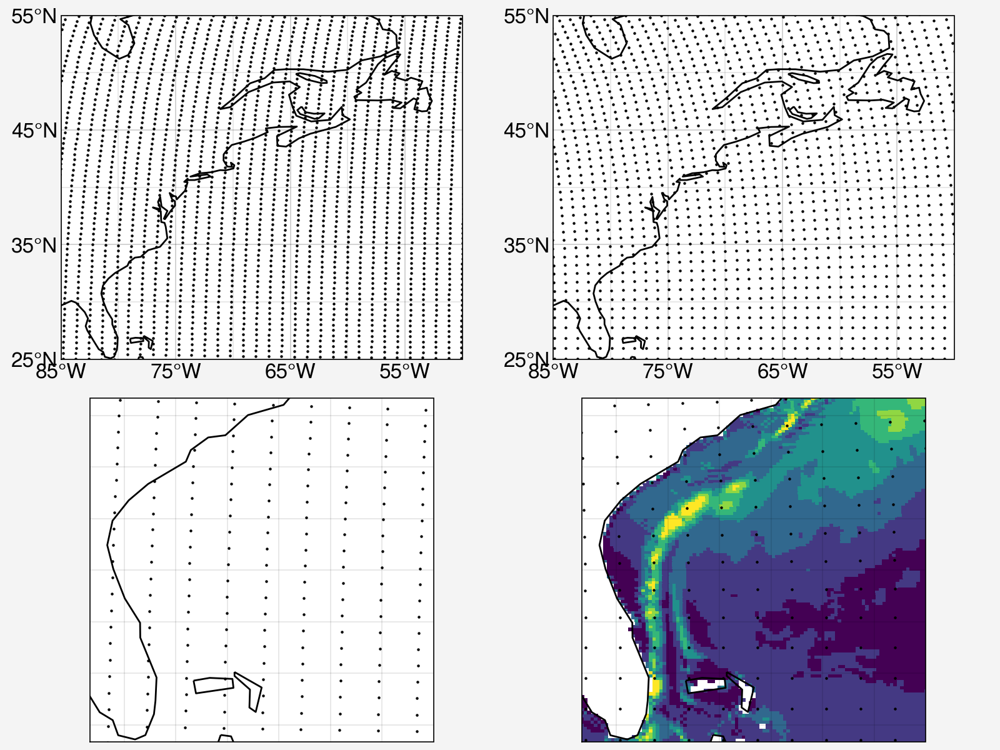

In [74]:
fig3, axs = plot.subplots(nrows=2,ncols=2,proj='cyl',width='8in',height='6in')
# np.arange(0, 4.01, 0.5)
# spd_UagPD_z1_r_dt_TLmCL = xr.ufuncs.sqrt(UagPD_z1_r_dt_TLmCL**2+VagPD_z1_r_dt_TLmCL**2)
# m00=axs[0,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, spd_UagPD_z1_r_dt_TLmCL, 
#                         levels=[0,1,1.5,2,2.5,3,3.5,4], transform=pc, cmap="Reds", extend='max')
axs[0,0].scatter(xds_r_g16.ULONG, xds_r_g16.ULAT, s=1,c='k')
# axs[0,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, s=3,c='k')
axs[0,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,0].xaxis.set_major_formatter(lon_formatter)
axs[0,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,0].yaxis.set_major_formatter(lat_formatter)

axs[0,1].scatter(xds_r_t12.ULONG[::10,::10], xds_r_t12.ULAT[::10,::10], s=1,c='k')
# axs[0,1].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, s=3,c='k')
axs[0,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,1].xaxis.set_major_formatter(lon_formatter)
axs[0,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,1].yaxis.set_major_formatter(lat_formatter)

axs[1,0].scatter(xds_r_g16.ULONG, xds_r_g16.ULAT, s=1,c='k')
# axs[0,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, s=3,c='k')
axs[1,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,0].set_extent([-82, -72, 25, 35], crs=pc)
# axs[0,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
# axs[0,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
# axs[0,0].xaxis.set_major_formatter(lon_formatter)
# axs[0,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
# axs[0,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
# axs[0,0].yaxis.set_major_formatter(lat_formatter)

m11=axs[1,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, np.log10(spd_Vag_r_t1var_TH), 
                        levels=np.arange(0, 1.5+0.1, 0.25), transform=pc, cmap="viridis", extend='max')
axs[1,1].scatter(xds_r_t12.ULONG[::10,::10], xds_r_t12.ULAT[::10,::10], s=1,c='k')
axs[1,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,1].set_extent([-82, -72, 25, 35], crs=pc)
# axs[0,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
# axs[0,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
# axs[0,1].xaxis.set_major_formatter(lon_formatter)
# axs[0,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
# axs[0,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
# axs[0,1].yaxis.set_major_formatter(lat_formatter)

# Appendix

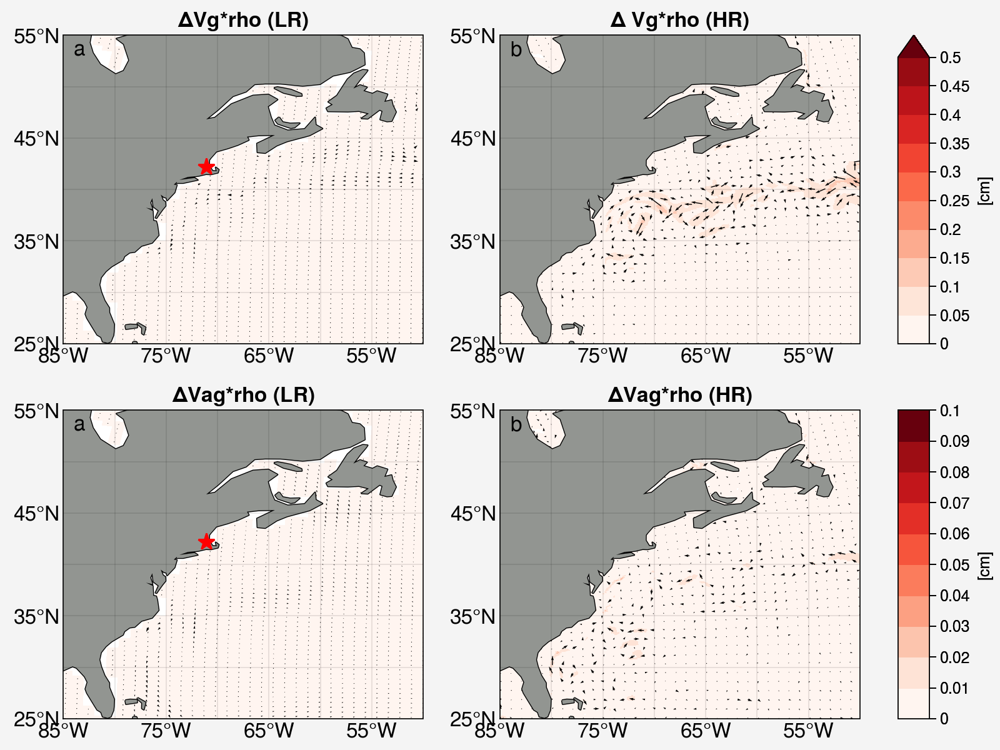

In [43]:
pc = cartopy.crs.PlateCarree()
lon_formatter = LongitudeFormatter(zero_direction_label=True)
lat_formatter = LatitudeFormatter()

fig1, axs = plot.subplots(nrows=2,ncols=2,proj='cyl',width='8in',height='6in')

grid_t12, xds_t12 = pop_tools.to_xgcm_grid_dataset(ds_t12)
xds_t12
xds_r_t12 = xds_t12.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))

grid_g16, xds_g16 = pop_tools.to_xgcm_grid_dataset(ds_g16)
xds_g16
xds_r_g16 = xds_g16.isel(nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))

m00=axs[0,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, 
               xr.ufuncs.sqrt(UgPD_z1_r_dt_CL**2+VgPD_z1_r_dt_CL**2), levels=np.arange(0,0.5+0.01,0.05),
               transform=pc, cmap="Reds", extend='max')
q00 = axs[0,0].quiver(xds_r_g16.ULONG, xds_r_g16.ULAT, 
                UgPD_z1_r_dt_CL, VgPD_z1_r_dt_CL, transform=pc, scale=1, scale_units='inches')
# axs[0,0].quiverkey(q00, X=0.1, Y=0.8, U=50, label='50 [cm/s]', labelpos='E')
axs[0,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[0,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,0].format(land=True, landcolor='grey')
axs[0,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,0].set_xticklabels(np.arangdollar signe(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,0].xaxis.set_major_formatter(lon_formatter)
axs[0,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,0].yaxis.set_major_formatter(lat_formatter)
axs[0,0].set_title(r'$\Delta$Vg*rho (LR)', fontsize=12, fontweight='bold')
axs[0,0].text(-84, 53, 'a', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')

m01=axs[0,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, 
               xr.ufuncs.sqrt(UgPD_z1_r_dt_CH**2+VgPD_z1_r_dt_CH**2), levels=np.arange(0,0.5+0.01,0.05),
               transform=pc, cmap="Reds", extend='max')
q01 = axs[0,1].quiver(xds_r_t12.ULONG[::10,::10], xds_r_t12.ULAT[::10,::10], 
                UgPD_z1_r_dt_CH[::10,::10], VgPD_z1_r_dt_CH[::10, ::10], transform=pc, scale=1, scale_units='inches')
axs[0,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,1].format(land=True, landcolor='grey')
axs[0,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fdollar signontsize=12)
axs[0,1].xaxis.set_major_formatter(lon_formatter)
axs[0,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,1].yaxis.set_major_formatter(lat_formatter)
axs[0,1].set_title(r'$\Delta$ Vg*rho (HR)', fontsize=12, fontweight='bold')
axs[0,1].text(-84, 53, 'b', transform=pc, fontsize=12)
# add colorbar
cb = axs[0,1].colorbar(m01,loc='r', label='[cm]',width='2em')

spd_UagPD_z1_r_dt_CL = xr.ufuncs.sqrt(UagPD_z1_r_dt_CL**2+VagPD_z1_r_dt_CL**2)
m10=axs[1,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, 
               spd_UagPD_z1_r_dt_CL, levels=np.arange(0,0.1+0.01,0.01),
        transform=pc, cmap="Reds")
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG[::5,::5], xds_r_t12.ULAT[::5,::5], 
#                 UagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG, xds_r_t12.ULAT, 
#                 UagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
q10 = axs[1,0].quiver(xds_r_g16.ULONG, xds_r_g16.ULAT, 
                UagPD_z1_r_dt_CL, 
                VagPD_z1_r_dt_CL, transform=pc, scale=0.2, scale_units='inches')
axs[1,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[1,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,0].format(land=True, landcolor='grey')
axs[1,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,0].xaxis.set_major_formatter(lon_formatter)
axs[1,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,0].yaxis.set_major_formatter(lat_formatter)
axs[1,0].set_title(r'$\Delta$Vag*rho (LR)', fontsize=12, fontweight='bold')
axs[1,0].text(-84, 53, 'a', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')

spd_UagPD_z1_r_dt_CH = xr.ufuncs.sqrt(UagPD_z1_r_dt_CH**2+VagPD_z1_r_dt_CH**2)
m11=axs[1,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, 
               spd_UagPD_z1_r_dt_CH, levels=np.arange(0,0.1+0.01,0.01),
        transform=pc, cmap="Reds")
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG[::5,::5], xds_r_t12.ULAT[::5,::5], 
#                 UagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG, xds_r_t12.ULAT, 
#                 UagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
q11 = axs[1,1].quiver(xds_r_t12.ULONG[::10,::10], xds_r_t12.ULAT[::10,::10], 
                UagPD_z1_r_dt_CH[::10,::10], 
                VagPD_z1_r_dt_CH[::10,::10], transform=pc, scale=0.2, scale_units='inches')
axs[1,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,1].format(land=True, landcolor='grey')
axs[1,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,1].xaxis.set_major_formatter(lon_formatter)
axs[1,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,1].yaxis.set_major_formatter(lat_formatter)
axs[1,1].set_title(r'$\Delta$Vag*rho (HR)', fontsize=12, fontweight='bold')
axs[1,1].text(-84, 53, 'b', transform=pc, fontsize=12)
# add colorbar
cb = axs[1,1].colorbar(m11,loc='r', label='[cm]',width='2em')

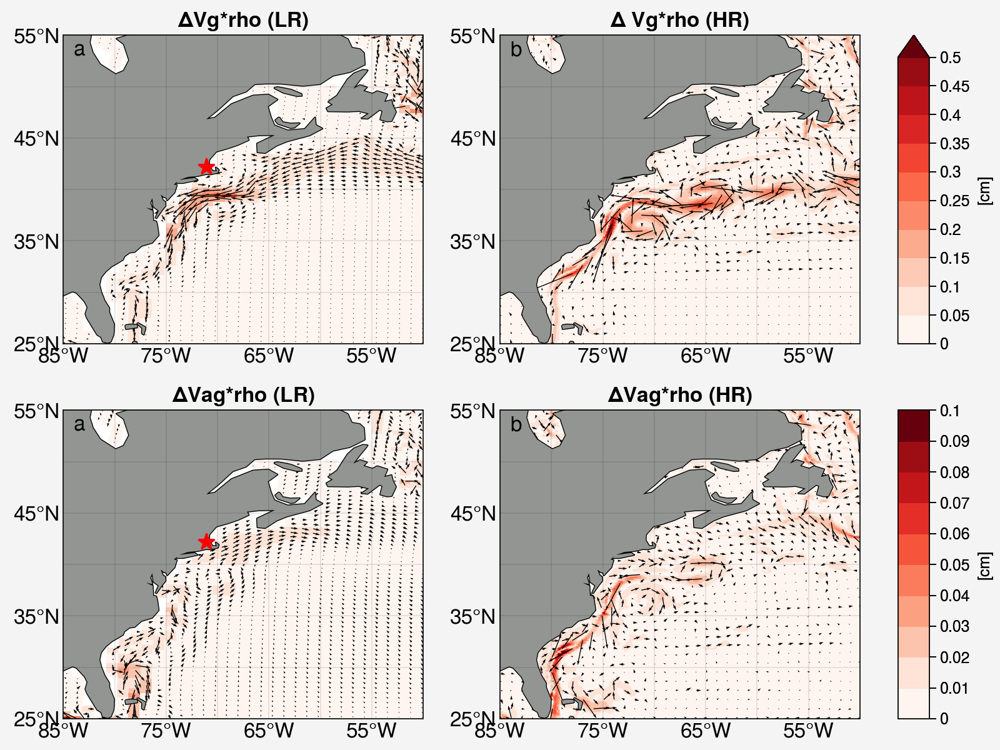

In [37]:
pc = cartopy.crs.PlateCarree()
lon_formatter = LongitudeFormatter(zero_direction_label=True)
lat_formatter = LatitudeFormatter()

fig1, axs = plot.subplots(nrows=2,ncols=2,proj='cyl',width='8in',height='6in')

grid_t12, xds_t12 = pop_tools.to_xgcm_grid_dataset(ds_t12)
xds_t12
xds_r_t12 = xds_t12.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))

grid_g16, xds_g16 = pop_tools.to_xgcm_grid_dataset(ds_g16)
xds_g16
xds_r_g16 = xds_g16.isel(nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))

m00=axs[0,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, 
               xr.ufuncs.sqrt(UgPD_z1_r_dt_TL**2+VgPD_z1_r_dt_TL**2), levels=np.arange(0,0.5+0.01,0.05),
               transform=pc, cmap="Reds", extend='max')
q00 = axs[0,0].quiver(xds_r_g16.ULONG, xds_r_g16.ULAT, 
                UgPD_z1_r_dt_TL, VgPD_z1_r_dt_TL, transform=pc, scale=1, scale_units='inches')
# axs[0,0].quiverkey(q00, X=0.1, Y=0.8, U=50, label='50 [cm/s]', labelpos='E')
axs[0,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[0,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,0].format(land=True, landcolor='grey')
axs[0,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,0].xaxis.set_major_formatter(lon_formatter)
axs[0,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,0].yaxis.set_major_formatter(lat_formatter)
axs[0,0].set_title(r'$\Delta$Vg*rho (LR)', fontsize=12, fontweight='bold')
axs[0,0].text(-84, 53, 'a', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')

m01=axs[0,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, 
               xr.ufuncs.sqrt(UgPD_z1_r_dt_TH**2+VgPD_z1_r_dt_TH**2), levels=np.arange(0,0.5+0.01,0.05),
               transform=pc, cmap="Reds", extend='max')
q01 = axs[0,1].quiver(xds_r_t12.ULONG[::10,::10], xds_r_t12.ULAT[::10,::10], 
                UgPD_z1_r_dt_TH[::10,::10], VgPD_z1_r_dt_TH[::10, ::10], transform=pc, scale=1, scale_units='inches')
axs[0,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,1].format(land=True, landcolor='grey')
axs[0,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,1].xaxis.set_major_formatter(lon_formatter)
axs[0,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,1].yaxis.set_major_formatter(lat_formatter)
axs[0,1].set_title(r'$\Delta$ Vg*rho (HR)', fontsize=12, fontweight='bold')
axs[0,1].text(-84, 53, 'b', transform=pc, fontsize=12)
# add colorbar
cb = axs[0,1].colorbar(m01,loc='r', label='[cm]',width='2em')

spd_UagPD_z1_r_dt_TL = xr.ufuncs.sqrt(UagPD_z1_r_dt_TL**2+VagPD_z1_r_dt_TL**2)
m10=axs[1,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, 
               spd_UagPD_z1_r_dt_TL, levels=np.arange(0,0.1+0.01,0.01),
        transform=pc, cmap="Reds")
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG[::5,::5], xds_r_t12.ULAT[::5,::5], 
#                 UagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG, xds_r_t12.ULAT, 
#                 UagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
q10 = axs[1,0].quiver(xds_r_g16.ULONG, xds_r_g16.ULAT, 
                UagPD_z1_r_dt_TL, 
                VagPD_z1_r_dt_TL, transform=pc, scale=0.2, scale_units='inches')
axs[1,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[1,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,0].format(land=True, landcolor='grey')
axs[1,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,0].xaxis.set_major_formatter(lon_formatter)
axs[1,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,0].yaxis.set_major_formatter(lat_formatter)
axs[1,0].set_title(r'$\Delta$Vag*rho (LR)', fontsize=12, fontweight='bold')
axs[1,0].text(-84, 53, 'a', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')

spd_UagPD_z1_r_dt_TH = xr.ufuncs.sqrt(UagPD_z1_r_dt_TH**2+VagPD_z1_r_dt_TH**2)
m11=axs[1,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, 
               spd_UagPD_z1_r_dt_TH, levels=np.arange(0,0.1+0.01,0.01),
        transform=pc, cmap="Reds")
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG[::5,::5], xds_r_t12.ULAT[::5,::5], 
#                 UagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG, xds_r_t12.ULAT, 
#                 UagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
q11 = axs[1,1].quiver(xds_r_t12.ULONG[::10,::10], xds_r_t12.ULAT[::10,::10], 
                UagPD_z1_r_dt_TH[::10,::10], 
                VagPD_z1_r_dt_TH[::10,::10], transform=pc, scale=0.2, scale_units='inches')
axs[1,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,1].format(land=True, landcolor='grey')
axs[1,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,1].xaxis.set_major_formatter(lon_formatter)
axs[1,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,1].yaxis.set_major_formatter(lat_formatter)
axs[1,1].set_title(r'$\Delta$Vag*rho (HR)', fontsize=12, fontweight='bold')
axs[1,1].text(-84, 53, 'b', transform=pc, fontsize=12)
# add colorbar
cb = axs[1,1].colorbar(m11,loc='r', label='[cm]',width='2em')

In [ ]:
pc = cartopy.crs.PlateCarree()
lon_formatter = LongitudeFormatter(zero_direction_label=True)
lat_formatter = LatitudeFormatter()

fig1, axs = plot.subplots(nrows=2,ncols=2,proj='cyl',width='8in',height='6in')

grid_t12, xds_t12 = pop_tools.to_xgcm_grid_dataset(ds_t12)
xds_t12
xds_r_t12 = xds_t12.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))

grid_g16, xds_g16 = pop_tools.to_xgcm_grid_dataset(ds_g16)
xds_g16
xds_r_g16 = xds_g16.isel(nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))

m00=axs[0,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, 
               xr.ufuncs.sqrt(UgPD_z1_r_t1av_TL**2+VgPD_z1_r_1tav_TL**2), levels=np.arange(0,0.5+0.01,0.05),
               transform=pc, cmap="Reds", extend='max')
q00 = axs[0,0].quiver(xds_r_g16.ULONG, xds_r_g16.ULAT, 
                UgPD_z1_r_t1av_TL, VgPD_z1_r_t1av_TL, transform=pc, scale=1, scale_units='inches')
# axs[0,0].quiverkey(q00, X=0.1, Y=0.8, U=50, label='50 [cm/s]', labelpos='E')
axs[0,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[0,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,0].format(land=True, landcolor='grey')
axs[0,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,0].xaxis.set_major_formatter(lon_formatter)
axs[0,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,0].yaxis.set_major_formatter(lat_formatter)
axs[0,0].set_title(r'Vg*rho (LR)', fontsize=12, fontweight='bold')
axs[0,0].text(-84, 53, 'a', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')

m01=axs[0,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, 
               xr.ufuncs.sqrt(UgPD_z1_r_t1_TH**2+VgPD_z1_r_t1_TH**2), levels=np.arange(0,0.5+0.01,0.05),
               transform=pc, cmap="Reds", extend='max')
q01 = axs[0,1].quiver(xds_r_t12.ULONG[::10,::10], xds_r_t12.ULAT[::10,::10], 
                UgPD_z1_r_t1_TH[::10,::10], VgPD_z1_r_t1_TH[::10, ::10], transform=pc, scale=1, scale_units='inches')
axs[0,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,1].format(land=True, landcolor='grey')
axs[0,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,1].xaxis.set_major_formatter(lon_formatter)
axs[0,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,1].yaxis.set_major_formatter(lat_formatter)
axs[0,1].set_title(r'$\Delta$ Vg*rho (HR)', fontsize=12, fontweight='bold')
axs[0,1].text(-84, 53, 'b', transform=pc, fontsize=12)
# add colorbar
cb = axs[0,1].colorbar(m01,loc='r', label='[cm]',width='2em')

spd_UagPD_z1_r_dt_TL = xr.ufuncs.sqrt(UagPD_z1_r_dt_TL**2+VagPD_z1_r_dt_TL**2)
m10=axs[1,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, 
               spd_UagPD_z1_r_dt_TL, levels=np.arange(0,0.1+0.01,0.01),
        transform=pc, cmap="Reds")
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG[::5,::5], xds_r_t12.ULAT[::5,::5], 
#                 UagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG, xds_r_t12.ULAT, 
#                 UagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
q10 = axs[1,0].quiver(xds_r_g16.ULONG, xds_r_g16.ULAT, 
                UagPD_z1_r_dt_TL, 
                VagPD_z1_r_dt_TL, transform=pc, scale=0.2, scale_units='inches')
axs[1,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[1,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,0].format(land=True, landcolor='grey')
axs[1,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,0].xaxis.set_major_formatter(lon_formatter)
axs[1,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,0].yaxis.set_major_formatter(lat_formatter)
axs[1,0].set_title(r'$\Delta$Vag*rho (LR)', fontsize=12, fontweight='bold')
axs[1,0].text(-84, 53, 'a', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')

spd_UagPD_z1_r_dt_TH = xr.ufuncs.sqrt(UagPD_z1_r_dt_TH**2+VagPD_z1_r_dt_TH**2)
m11=axs[1,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, 
               spd_UagPD_z1_r_dt_TH, levels=np.arange(0,0.1+0.01,0.01),
        transform=pc, cmap="Reds")
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG[::5,::5], xds_r_t12.ULAT[::5,::5], 
#                 UagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH[::5,::5].where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
# --- too many quivers, hard to read color ---
# q11 = axs[1,1].quiver(xds_r_t12.ULONG, xds_r_t12.ULAT, 
#                 UagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), 
#                 VagPD_z1_r_dt_TH.where(spd_UagPD_z1_r_dt_TH>0.02), transform=pc, scale=0.2, scale_units='inches')
# --------------------------------------------
q11 = axs[1,1].quiver(xds_r_t12.ULONG[::10,::10], xds_r_t12.ULAT[::10,::10], 
                UagPD_z1_r_dt_TH[::10,::10], 
                VagPD_z1_r_dt_TH[::10,::10], transform=pc, scale=0.2, scale_units='inches')
axs[1,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,1].format(land=True, landcolor='grey')
axs[1,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,1].xaxis.set_major_formatter(lon_formatter)
axs[1,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,1].yaxis.set_major_formatter(lat_formatter)
axs[1,1].set_title(r'$\Delta$Vag*rho (HR)', fontsize=12, fontweight='bold')
axs[1,1].text(-84, 53, 'b', transform=pc, fontsize=12)
# add colorbar
cb = axs[1,1].colorbar(m11,loc='r', label='[cm]',width='2em')

In [ ]:
pc = cartopy.crs.PlateCarree()
lon_formatter = LongitudeFormatter(zero_direction_label=True)
lat_formatter = LatitudeFormatter()

fig1, axs = plot.subplots(nrows=2,ncols=2,proj='cyl',width='7.5in',height='7in')

m00=axs[0,0].pcolormesh(ds_r_obs.Lon, ds_r_obs.Lat, 
        xr.ufuncs.sqrt(ds_r_obs.U.T**2+ ds_r_obs.V.T**2)*100, levels=np.arange(0,140+1,20), transform=pc, 
        cmap="Reds", extend='max')
axs[0,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,0].format(land=True, landcolor='grey')
q00 = axs[0,0].quiver(ds_r_obs.Lon[::4], ds_r_obs.Lat[::4], 
                      ds_r_obs.U.T[::4,::4]*100, ds_r_obs.V.T[::4,::4]*100, transform=pc, 
                      scale=200, scale_units='inches')
axs[0,0].quiverkey(q00, X=0.1, Y=0.8, U=50,
             label='50 [cm/s]', labelpos='E')
axs[0,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,0].set_xticks(np.arange(lon1_r,lon2_r+1, 10), crs=pc)
axs[0,0].set_xticklabels(np.arange(lon1_r,lon2_r+1, 10), dollar signfontsize=12)
axs[0,0].xaxis.set_major_formatter(lon_formatter)
axs[0,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,0].yaxis.set_major_formatter(lat_formatter)
axs[0,0].set_title('$V_{15m}$(1979-2020) mean drifter', fontsize=12, fontweight='bold')
axs[0,0].text(-84, 53, 'a', transform=pc, fontsize=10)

m10=axs[1,0].pcolormesh(ds_r_t12.TLONG, ds_r_t12.TLAT, 
        spd1_r_TH, levels=np.arange(0,140+1,20), transform=pc, 
        cmap="Reds", extend='max')
axs[1,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,0].format(land=True, landcolor='grey')
q10 = axs[1,0].quiver(ds_r_t12.TLONG[::10,::10], ds_r_t12.TLAT[::10,::10], 
                u1_r_TH[::10,::10], v1_r_TH[::10, ::10], transform=pc, scale=200,scale_units='inches')
axs[1,0].quiverkey(q10, X=0.1, Y=0.8, U=50, label='50 [cm/s]', labelpos='E')
axs[1,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,0].xaxis.set_major_formatter(lon_formatter)
axs[1,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,0].yaxis.set_major_formatter(lat_formatter)
axs[1,0].set_title('$V_{15m}$(1979-2020) mean HR', fontsize=12, fontweight='bold')
axs[1,0].text(-84, 53, 'b', transform=pc, fontsize=10)


m20=axs[2,0].pcolormesh(ds_r_g16.TLONG, ds_r_g16.TLAT, 
        spd1_r_TL, levels=np.arange(0,140+1,20), transform=pc, 
        cmap="Reds", extend='max')
axs[2,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[2,0].format(land=True, landcolor='grey')
q20 = axs[2,0].quiver(ds_r_g16.TLONG, ds_r_g16.TLAT, 
                      u1_r_TL, v1_r_TL,
                      transform=pc, scale=200, scale_units='inches')
axs[2,0].quiverkey(q20, X=0.1, Y=0.8, U=50,
             label='50 [cm/s]', labelpos='E')
axs[2,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[2,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[2,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[2,0].xaxis.set_major_formatter(lon_formatter)
axs[2,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[2,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[2,0].yaxis.set_major_formatter(lat_formatter)
axs[2,0].set_title('$V_{15m}$(1979-2020) mean LR', fontsize=12, fontweight='bold')
axs[2,0].text(-84, 53, 'c', transform=pc, fontsize=10)
cb = axs[2,0].colorbar(m20,loc='b',label='[cm/s]',width='1em',shrink=0.9)


m01=axs[0,1].pcolormesh(ds_r_obs.Lon, ds_r_obs.Lat, 
        xr.ufuncs.sqrt(ds_r_obs.U.T**2+ ds_r_obs.V.T**2)*100, levels=np.arange(0,50+1,10), transform=pc, 
        cmap="Reds", extend='max')
axs[0,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,1].format(land=True, landcolor='grey')
q01 = axs[0,1].quiver(ds_r_obs.Lon[::2], ds_r_obs.Lat[::2], 
                      ds_r_obs.U.T[::2,::2]*100, ds_r_obs.V.T[::2,::2]*100, transform=pc, 
                      scale=200, scale_units='inches')
axs[0,1].quiverkey(q01, X=0.1, Y=0.8, U=50,
             label='50 [cm/s]', labelpos='E')
axs[0,1].set_extent([lon1_GMa, lon2_GMa, lat1_GMa, lat2_GMa], crs=pc)
axs[0,1].set_xticks(np.arange(lon1_GMa,lon2_GMa+1,5), crs=pc)
axs[0,1].set_xticklabels(np.arange(lon1_GMa,lon2_GMa+1,5), fontsize=12)
axs[0,1].xaxis.set_major_formatter(lon_formatter)
axs[0,1].set_yticks(np.arange(lat1_GMa,lat2_GMa+1, 5), crs=pc)
axs[0,1].set_yticklabels(np.arange(lat1_GMa,lat2_GMa+1, 5), fontsize=12)
axs[0,1].yaxis.set_major_formatter(lat_formatter)
axs[0,1].set_title('$V_{15m}$(1979-2020) mean drifter', fontsize=12, fontweight='bold')
axs[0,1].text(-74, 53.5, 'd', transform=pc, fontsize=10)
# axs[0,1].text(-65, 50.5, "Gulf of \nSt. Lawrence", transform=pc, fontsize=8)
axs[0,1].text(-70, 45.5, "Gulf of Maine", transform=pc, fontsize=8)
axs[0,1].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10) # Boston (71.1W, 42.4N)
axs[0,1].annotate('shelf currents', xy=(-72.5, 40),  xycoords='data',
            xytext=(-68, 53.5),textcoords='data', color='k', fontsize=10,
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3",color='green',linewidth=1.5))


m11=axs[1,1].pcolormesh(ds_r_t12.TLONG, ds_r_t12.TLAT, 
        spd1_r_TH, levels=np.arange(0,50+1,10), transform=pc, 
        cmap="Reds", extend='max')
axs[1,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,1].format(land=True, landcolor='grey')
q11 = axs[1,1].quiver(ds_r_t12.TLONG[::5,::5], ds_r_t12.TLAT[::5,::5], 
                u1_r_TH[::5,::5], v1_r_TH[::5, ::5], transform=pc, scale=200,scale_units='inches')
axs[1,1].quiverkey(q11, X=0.1, Y=0.8, U=50, label='50 [cm/s]', labelpos='E')
axs[1,1].set_extent([lon1_GMa, lon2_GMa, lat1_GMa, lat2_GMa], crs=pc)
axs[1,1].set_xticks(np.arange(lon1_GMa,lon2_GMa+1,5), crs=pc)
axs[1,1].set_xticklabels(np.arange(lon1_GMa,lon2_GMa+1,5), fontsize=12)
axs[1,1].xaxis.set_major_formatter(lon_formatter)
axs[1,1].set_yticks(np.arange(lat1_GMa,lat2_GMa+1, 5), crs=pc)
axs[1,1].set_yticklabels(np.arange(lat1_GMa,lat2_GMa+1, 5), fontsize=12)
axs[1,1].yaxis.set_major_formatter(lat_formatter)
axs[1,1].set_title('$V_{15m}$(1979-2020) mean HR', fontsize=12, fontweight='bold')
axs[1,1].text(-74, 53.5, 'e', transform=pc, fontsize=10)
axs[1,1].annotate('shelf currents', xy=(-71.5, 40),  xycoords='data',
            xytext=(-68, 53.5),textcoords='data', color='k', fontsize=10,
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3",color='green',linewidth=1.5))
# axs[1,1].text(-65, 50.5, "Gulf of \nSt. Lawrence", transform=pc, fontsize=8)
# axs[1,1].text(-73, 45, "Gulf of Maine", transform=pc, fontsize=8)
# axs[1,1].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10) # Boston (71.1W, 42.4N)

m21=axs[2,1].pcolormesh(ds_r_g16.TLONG, ds_r_g16.TLAT, 
        spd1_r_TL, levels=np.arange(0,50+1,10), transform=pc, 
        cmap="Reds", extend='max')
axs[2,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[2,1].format(land=True, landcolor='grey')
q21 = axs[2,1].quiver(ds_r_g16.TLONG, ds_r_g16.TLAT, 
                      u1_r_TL, v1_r_TL,
                      transform=pc, scale=200, scale_units='inches')
axs[2,1].quiverkey(q21, X=0.1, Y=0.8, U=50,
             label='50 [cm/s]', labelpos='E')
axs[2,1].set_extent([lon1_GMa, lon2_GMa, lat1_GMa, lat2_GMa], crs=pc)
axs[2,1].set_xticks(np.arange(lon1_GMa,lon2_GMa+1,5), crs=pc)
axs[2,1].set_xticklabels(np.arange(lon1_GMa,lon2_GMa+1,5), fontsize=12)
axs[2,1].xaxis.set_major_formatter(lon_formatter)
axs[2,1].set_yticks(np.arange(lat1_GMa,lat2_GMa+1, 5), crs=pc)
axs[2,1].set_yticklabels(np.arange(lat1_GMa,lat2_GMa+1, 5), fontsize=12)
axs[2,1].yaxis.set_major_formatter(lat_formatter)
axs[2,1].set_title('$V_{15m}$(1979-2020) mean LR', fontsize=12, fontweight='bold')
axs[2,1].text(-74, 53.5, 'f', transform=pc, fontsize=10)
# axs[2,1].text(-65, 50.5, "Gulf of \nSt. Lawrence", transform=pc, fontsize=8)
# axs[2,1].text(-73, 45, "Gulf of Maine", transform=pc, fontsize=8)
# axs[2,1].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10) # Boston (71.1W, 42.4N)
cb = axs[2,1].colorbar(m21,loc='b',label='[cm/s]',width='1em',shrink=0.9)

fig1.savefig(pic1, bbox_inches='tight')

In [36]:
# fig, axs = plt.subplots(1,2,figsize=(10,4))
# UagT_z1_r_TH.isel(time=10).plot(ax=axs[0])
# UgT_z1_r_TH.isel(time=10).plot(ax=axs[1])

UT_z1_r_t1av_TH = UT_z1_r_TH.sel(time=slice('2001','2020')).mean('time').compute()
UgT_z1_r_t1av_TH = UgT_z1_r_TH.sel(time=slice('2001','2020')).mean('time').compute()
UagT_z1_r_t1av_TH = UagT_z1_r_TH.sel(time=slice('2001','2020')).mean('time').compute()

fig, axs = plt.subplots(1,2,figsize=(10,4))
UagT_z1_r_t1av_TH.plot(ax=axs[0])
UgT_z1_r_t1av_TH.plot(ax=axs[1])

KeyboardInterrupt: 

In [ ]:
%%time
UT_z1_r_t2av_TH = UT_z1_r_TH.sel(time=slice('2081','2100')).mean('time').compute()
UgT_z1_r_t2av_TH = UgT_z1_r_TH.sel(time=slice('2081','2100')).mean('time').compute()
UagT_z1_r_t2av_TH = UagT_z1_r_TH.sel(time=slice('2081','2100')).mean('time').compute()

fig, axs = plt.subplots(1,2,figsize=(10,4))
UagT_z1_r_t2av_TH.plot(ax=axs[0])
UgT_z1_r_t2av_TH.plot(ax=axs[1])

In [24]:
# Vag_var_r_TH = Uag_r_TH**2 + Vag_r_TH**2
# Vg_var_r_TH = Ug_r_TH**2 + Vg_r_TH**2
# V_var_r_TH = uvel_r_TH**2 + vvel_r_TH**2
spd_Vag_r_TH = xr.ufuncs.sqrt(Uag_r_TH**2 + Vag_r_TH**2)
spd_Vg_r_TH = xr.ufuncs.sqrt(Ug_r_TH**2 + Vg_r_TH**2)
spd_r_TH = xr.ufuncs.sqrt(uvel_r_TH**2 + vvel_r_TH**2)
# spd_Vag_r_trs_TH = spd_Vag_r_TH.resample(time='A').mean('time')
# spd_Vg_r_trs_TH = spd_Vg_r_TH.resample(time='A').mean('time')
# spd_r_trs_TH = spd_r_TH.resample(time='A').mean('time')

# Vag_var_r_TL = Uag_r_TL**2 + Vag_r_TL**2
# Vg_var_r_TL = Ug_r_TL**2 + Vg_r_TL**2
# V_var_r_TL = uvel_r_TL**2 + vvel_r_TL**2
spd_Vag_r_TL = xr.ufuncs.sqrt(Uag_r_TL**2 + Vag_r_TL**2)
spd_Vg_r_TL = xr.ufuncs.sqrt(Ug_r_TL**2 + Vg_r_TL**2)
spd_r_TL = xr.ufuncs.sqrt(uvel_r_TL**2 + vvel_r_TL**2)
# spd_Vag_r_trs_TL = spd_Vag_r_TL.resample(time='A').mean('time')
# spd_Vg_r_trs_TL = spd_Vg_r_TL.resample(time='A').mean('time')
# spd_r_trs_TL = spd_r_TL.resample(time='A').mean('time')
# spd_ag_r_TH

In [27]:
print(spd_Vg_r_TH.time.values[0], spd_Vg_r_TH.time.values[-1], len(spd_Vg_r_TH.time))
print(spd_Vg_r_TL.time.values[0], spd_Vg_r_TL.time.values[-1], len(spd_Vg_r_TL.time))

print(spd_Vag_r_TH.time.values[0], spd_Vag_r_TH.time.values[-1], len(spd_Vag_r_TH.time))
print(spd_Vag_r_TL.time.values[0], spd_Vag_r_TL.time.values[-1], len(spd_Vag_r_TL.time))

2001-02-01 00:00:00 2101-01-01 00:00:00 1200
2001-01-17 00:00:00 2100-12-17 00:00:00 1200
2001-02-01 00:00:00 2101-01-01 00:00:00 1200
2021-01-31 00:00:00 2040-12-31 00:00:00 240


In [54]:
# time_vvel_s = ds_vvel_TL_raw.time.to_pandas().index.shift(-1,'D') # shift it one month back 
# print(time_vvel_s)
# time_vvel_s_TH = Vag_var_r_TH.time.to_pandas().index.shift(-1,'D') # shift it one month back 
# print(time_vvel_s_TH)

CFTimeIndex([1850-01-31 00:00:00, 1850-02-28 00:00:00, 1850-03-31 00:00:00,
             1850-04-30 00:00:00, 1850-05-31 00:00:00, 1850-06-30 00:00:00,
             1850-07-31 00:00:00, 1850-08-31 00:00:00, 1850-09-30 00:00:00,
             1850-10-31 00:00:00,
             ...
             2105-02-28 00:00:00, 2105-03-31 00:00:00, 2105-04-30 00:00:00,
             2105-05-31 00:00:00, 2105-06-30 00:00:00, 2105-07-31 00:00:00,
             2105-08-31 00:00:00, 2105-09-30 00:00:00, 2105-10-31 00:00:00,
             2105-11-30 00:00:00],
            dtype='object', length=3070, calendar='noleap', freq='None')
CFTimeIndex([2001-01-30 00:00:00, 2001-02-27 00:00:00, 2001-03-30 00:00:00,
             2001-04-29 00:00:00, 2001-05-30 00:00:00, 2001-06-29 00:00:00,
             2001-07-30 00:00:00, 2001-08-30 00:00:00, 2001-09-29 00:00:00,
             2001-10-30 00:00:00,
             ...
             2100-03-30 00:00:00, 2100-04-29 00:00:00, 2100-05-30 00:00:00,
             2100-06-29 00:00:

In [119]:
# Vag_var_r_TL1 = Vg_var_r_TL.assign_coords(time=time_vvel_s)
# Vag_var_r_TH1 = Vg_var_r_TH.assign_coords(time=time_vvel_s_TH)
# Vg_var_r_TL
# Ug_r_TL

<xarray.DataArray (nlat_u: 120, nlon_u: 60)>
array([[-0.04497826, -0.0416835 , -0.03963802, ...,  0.00584723,
         0.00740421,  0.00824642],
       [-0.05075729, -0.0490984 , -0.0483872 , ...,  0.00542199,
         0.00707982,  0.00814986],
       [-0.05397333, -0.05377483, -0.05369741, ...,  0.00486387,
         0.00675775,  0.00793571],
       ...,
       [        nan,         nan,         nan, ..., -0.02871831,
        -0.00307047,  0.00124708],
       [        nan,         nan,         nan, ..., -0.04189161,
        -0.00677772,  0.00129266],
       [        nan,         nan,         nan, ..., -0.07180565,
        -0.0337012 , -0.01259414]])
Coordinates:
    time     object 2084-05-17 00:00:00
  * nlat_u   (nlat_u) int64 231 232 233 234 235 236 ... 345 346 347 348 349 350
  * nlon_u   (nlon_u) int64 261 262 263 264 265 266 ... 315 316 317 318 319 320

In [55]:
# Vag_var_r_TL1 = Vag_var_r_TL.assign_coords(time=time_vvel_s)
# Vag_var_r_TH1 = Vag_var_r_TH.assign_coords(time=time_vvel_s_TH)
# Vag_var_r_TL1, Vag_var_r_TH1

(<xarray.DataArray (time: 3070, nlat_u: 120, nlon_u: 60)>
 array([[[9.24077129e-02, 9.55968097e-02, 9.69940162e-02, ...,
          5.58866151e-03, 4.71877995e-03, 2.59853402e-03],
         [9.11448661e-02, 9.48357831e-02, 9.49209220e-02, ...,
          5.80873034e-03, 5.06351855e-03, 3.03127787e-03],
         [8.45838580e-02, 8.87373113e-02, 8.82922107e-02, ...,
          6.03317598e-03, 5.39337701e-03, 3.45333394e-03],
         ...,
         [           nan,            nan,            nan, ...,
          3.11993228e-03, 1.74458527e-03, 3.52560685e-03],
         [           nan,            nan,            nan, ...,
          3.70316299e-03, 2.56437608e-04, 3.00723531e-03],
         [           nan,            nan,            nan, ...,
          2.74302988e-03, 3.08003998e-03, 4.60923298e-03]],
 
        [[6.08434115e-02, 6.84062863e-02, 7.11288911e-02, ...,
          4.98567247e-03, 2.79457056e-03, 1.80652419e-03],
         [6.57875584e-02, 7.18040557e-02, 7.13237190e-02, ...,
        

In [23]:
# Vag_var_r_TH
# print(Vag_var_r_TH.time[0].values)
# print(Vag_var_r_TH.time[-1].values)

# print(Vg_var_r_TH.time[0].values)
# print(Vg_var_r_TH.time[-1].values)

# time2 = xr.cftime_range(start="2001-01", end="2101-01", freq='M')
# time2
# print(time2[0])
# print(time2[-1])
# Vag_var_r_TH = Vag_var_r_TH.assign_coords(time=time2)
# Vg_var_r_TH = Vg_var_r_TH.assign_coords(time=time2)
# V_var_r_TH = V_var_r_TH.assign_coords(time=time2)

# Vag_var_r_TL = Vag_var_r_TL.assign_coords(time=time2)
# Vg_var_r_TL = Vg_var_r_TL.assign_coords(time=time2)
# V_var_r_TL = V_var_r_TL.assign_coords(time=time2)

2001-02-01 00:00:00
2101-01-01 00:00:00
2001-02-01 00:00:00
2101-01-01 00:00:00
2001-01-31 00:00:00
2100-12-31 00:00:00


ValueError: conflicting sizes for dimension 'time': length 3070 on <this-array> and length 1200 on {'nlat_u': 'ULONG', 'nlon_u': 'ULONG', 'time': 'time'}

In [ ]:
# Vag_var_tre_r_TH = Vag_var_r_TH.resample(time='A').mean('time')
# Vg_var_tre_r_TH = Vg_var_r_TH.resample(time='A').mean('time')
# V_var_tre_r_TH = V_var_r_TH.resample(time='A').mean('time')

# Vag_var_tre_rm_TH = Vag_var_tre_r_TH.where(kmu_r_TH>0, np.nan)
# Vg_var_tre_rm_TH = Vg_var_tre_r_TH.where(kmu_r_TH>0, np.nan)
# V_var_tre_rm_TH = V_var_tre_r_TH.where(kmu_r_TH>0, np.nan)

# make pics

In [28]:
# === 2022Jan10 codes below return merge errors on {'ULAT', 'ULONG'} ===
# ds_t12["DXT"] = ds_uvel_TH.DXT # cm
# ds_t12["DXU"] = ds_uvel_TH.DXU # cm
# ds_t12["DYT"] = ds_uvel_TH.DYT # cm
# ds_t12["DYU"] = ds_uvel_TH.DYU # cm
# ds_t12["DZT"] = ds_3dDZT_t12.DZT*100 # cm
# ds_t12["DZU"] = ds_3dDZT_t12.DZU*100 # cm
# ds_t12["TAREA"] = ds_uvel_TH.TAREA # cm
# ds_t12["UAREA"] = ds_uvel_TH.UAREA # cm
# grid_t12, xds_t12 = pop_tools.to_xgcm_grid_dataset(ds_t12, metrics=metrics)
# xds_t12
# ======================================================================

grid_t12, xds_t12 = pop_tools.to_xgcm_grid_dataset(ds_t12)
xds_t12
xds_r_t12 = xds_t12.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))
# xds_r_t12.ULONG[0,0],

In [29]:
grid_g16, xds_g16 = pop_tools.to_xgcm_grid_dataset(ds_g16)
xds_g16
xds_r_g16 = xds_g16.isel(nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))

2001-02-01 00:00:00 2101-01-01 00:00:00
2021-01-31 00:00:00 2040-12-31 00:00:00


In [30]:
time_vvel_s_TH = spd_Vag_r_TH.time.to_pandas().index.shift(-1,'D') # shift it one month back 
print(time_vvel_s_TH)
spd_Vag_r_TH = spd_Vag_r_TH.assign_coords(time=time_vvel_s_TH)
spd_Vg_r_TH = spd_Vg_r_TH.assign_coords(time=time_vvel_s_TH)
# Vag_var_r_TH = Vag_var_r_TH.assign_coords(time=time_vvel_s_TH)
spd_Vag_t1_r_TH = spd_Vag_r_TH.sel(time=slice('2021','2040'))
spd_Vag_t1_r_TL = spd_Vag_r_TL.sel(time=slice('2021','2040'))

spd_Vg_t1_r_TH = spd_Vg_r_TH.sel(time=slice('2021','2040'))
spd_Vg_t1_r_TL = spd_Vg_r_TL.sel(time=slice('2021','2040'))

print(spd_Vag_t1_r_TH.time[0].values, spd_Vag_t1_r_TH.time[-1].values)
print(spd_Vag_t1_r_TL.time[0].values, spd_Vag_t1_r_TL.time[-1].values)

print(spd_Vg_t1_r_TH.time[0].values, spd_Vg_t1_r_TH.time[-1].values)
print(spd_Vg_t1_r_TL.time[0].values, spd_Vg_t1_r_TL.time[-1].values)

# Vag_var_t1av_r_TH = Vag_var_t1_r_TH.mean('time')
# Vag_var_t1av_r_TL = Vag_var_t1_r_TL.mean('time')
spd_Vag_t1var_r_TH = spd_Vag_t1_r_TH.var('time')
spd_Vag_t1var_r_TL = spd_Vag_t1_r_TL.var('time')
spd_Vg_t1var_r_TH = spd_Vg_t1_r_TH.var('time')
spd_Vg_t1var_r_TL = spd_Vg_t1_r_TL.var('time')

CFTimeIndex([2001-01-31 00:00:00, 2001-02-28 00:00:00, 2001-03-31 00:00:00,
             2001-04-30 00:00:00, 2001-05-31 00:00:00, 2001-06-30 00:00:00,
             2001-07-31 00:00:00, 2001-08-31 00:00:00, 2001-09-30 00:00:00,
             2001-10-31 00:00:00,
             ...
             2100-03-31 00:00:00, 2100-04-30 00:00:00, 2100-05-31 00:00:00,
             2100-06-30 00:00:00, 2100-07-31 00:00:00, 2100-08-31 00:00:00,
             2100-09-30 00:00:00, 2100-10-31 00:00:00, 2100-11-30 00:00:00,
             2100-12-31 00:00:00],
            dtype='object', length=1200, calendar='noleap', freq='M')
2021-01-31 00:00:00 2040-12-31 00:00:00
2021-01-31 00:00:00 2040-12-31 00:00:00
2021-01-31 00:00:00 2040-12-31 00:00:00
2021-01-17 00:00:00 2040-12-17 00:00:00


/ihesp/software/conda/envs/xroms_unstable_daskpr/lib/python3.7/site-packages/xarray/core/nputils.py:152: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/ihesp/software/conda/envs/xroms_unstable_daskpr/lib/python3.7/site-packages/xarray/core/nputils.py:152: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/ihesp/software/conda/envs/xroms_unstable_daskpr/lib/python3.7/site-packages/xarray/core/nputils.py:152: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/ihesp/software/conda/envs/xroms_unstable_daskpr/lib/python3.7/site-packages/xarray/core/nputils.py:152: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)


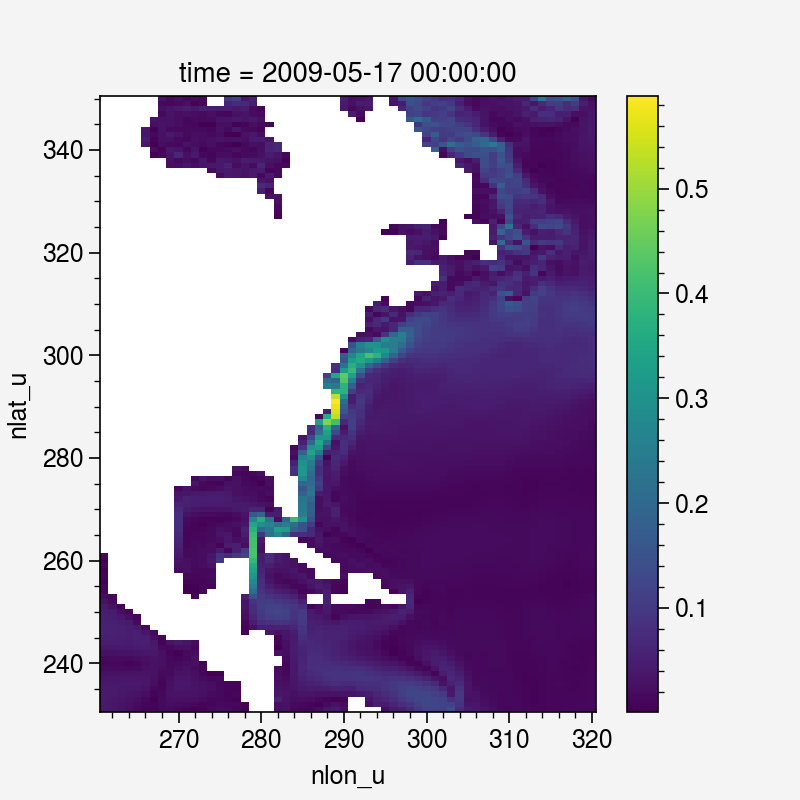

In [31]:
spd_Vg_r_TL.isel(time=100).plot()

/ihesp/software/conda/envs/xroms_unstable_daskpr/lib/python3.7/site-packages/xarray/core/computation.py:739: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


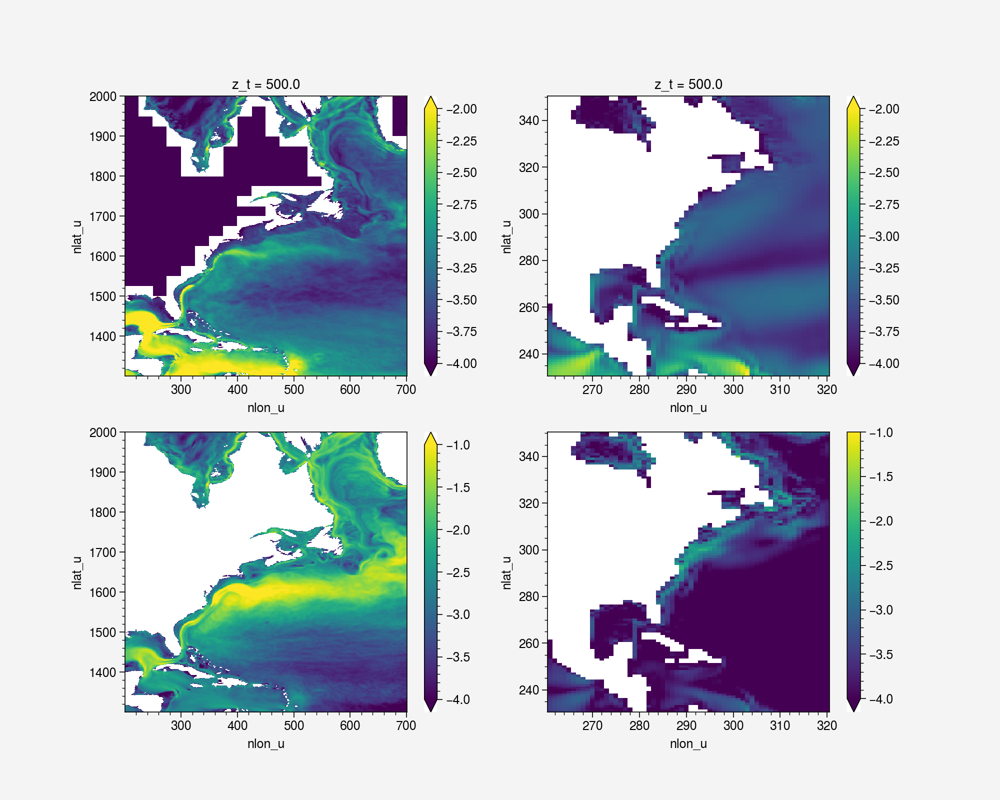

In [32]:
# spd_Vag_t1_r_TH.isel(time=0)
spd_Vag_t1_r_TH, 
# spd_Vag_t1var_r_TH = spd_Vag_t1_r_TH.var('time')
fig, axs = plt.subplots(2,2,figsize=(10,8))
np.log10(spd_Vag_t1var_r_TH).plot(ax=axs[0,0], vmin=-4, vmax=-2)
np.log10(spd_Vag_t1var_r_TL).plot(ax=axs[0,1], vmin=-4, vmax=-2)
np.log10(spd_Vg_t1var_r_TH).plot(ax=axs[1,0], vmin=-4, vmax=-1)
np.log10(spd_Vg_t1var_r_TL).plot(ax=axs[1,1], vmin=-4, vmax=-1)

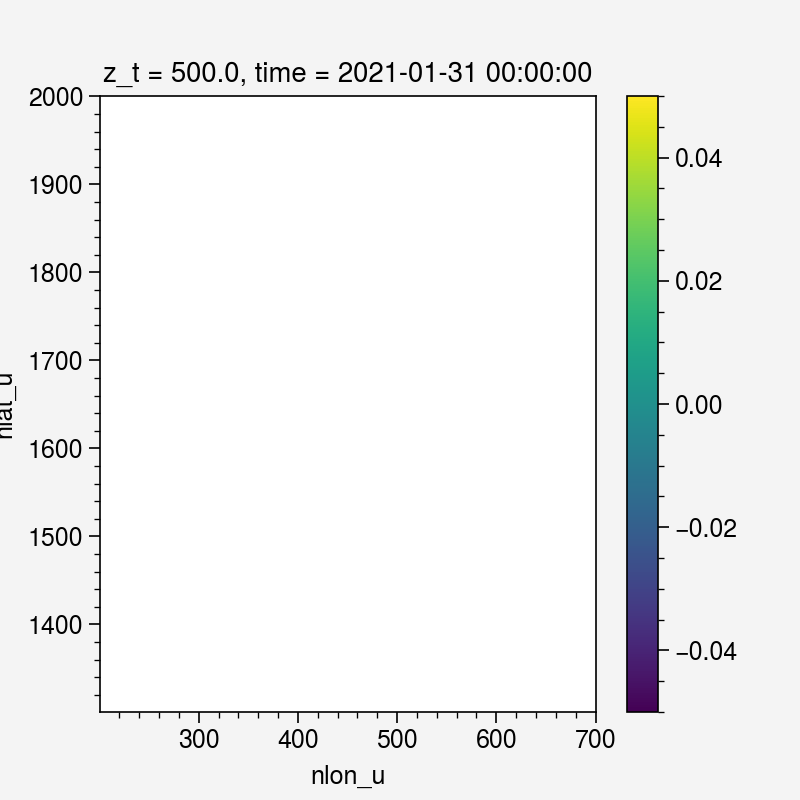

In [46]:
# spd_Vag_t1_r_TH.values.shape
# a = spd_Vag_t1_r_TH.isel(time=0) - spd_Vag_t1_r_TH.isel(time=0) + np.var(spd_Vag_t1_r_TH.values, axis=0)
# np.log10(a).plot()

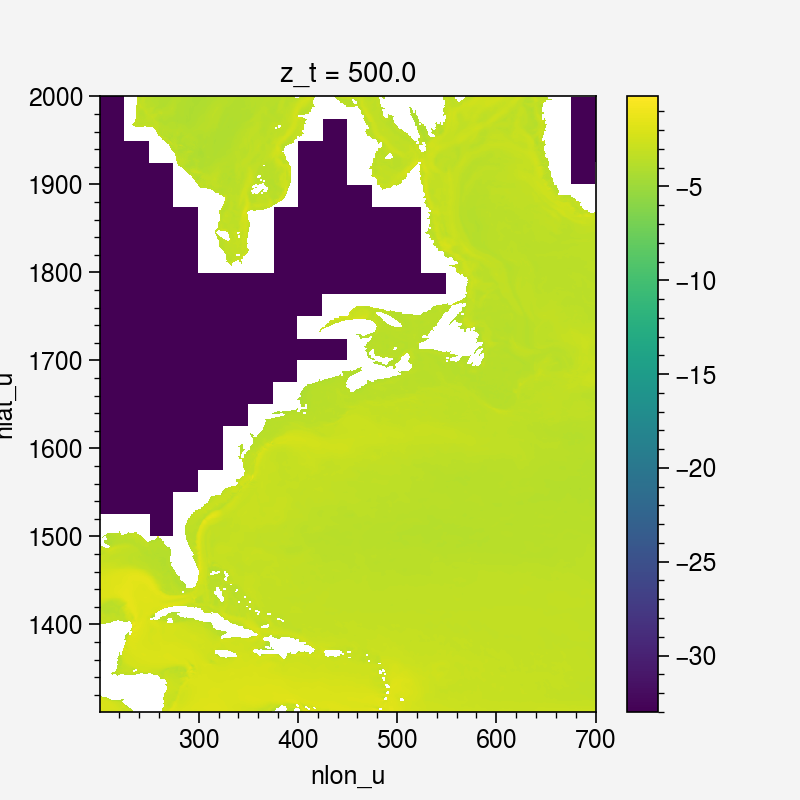

In [38]:
# np.log10(spd_Vag_t1var_r_TH).plot()

In [36]:
# # spd_Vag_t1var_r_TL.plot()
# spd_Vag_t1_r_TL
# # np.log10(spd_Vag_t1_r_TL.var('time')).plot()
# np.log10(spd_Vag_t1var_r_TH.var('time')).plot()

ValueError: 'time' not found in array dimensions ('nlat_u', 'nlon_u')

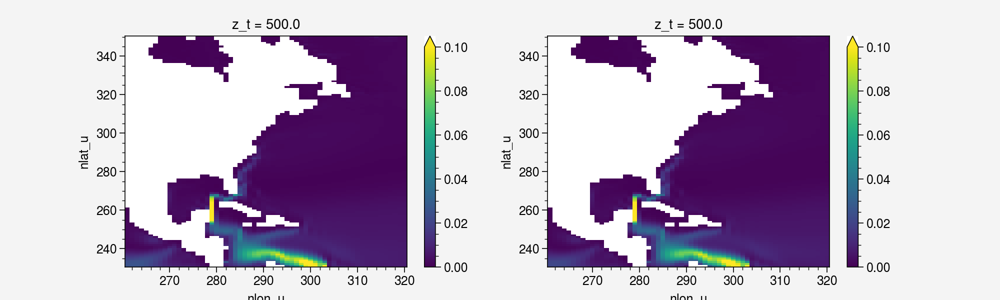

In [97]:
# fig, axs = plt.subplots(1,2, figsize=(10,3))
# Vag_var_t1_r_TL.isel(time=slice(0,120)).mean('time').plot(ax=axs[0], vmin=0, vmax=0.1)
# Vag_var_t1_r_TL.isel(time=slice(121,240)).mean('time').plot(ax=axs[1], vmin=0, vmax=0.1)

In [67]:
# # time_vvel_s_TH = Vg_var_r_TH.time.to_pandas().index.shift(-1,'D') # shift it one month back 
# # print(time_vvel_s_TH)
# Vg_var_r_TH = Vg_var_r_TH.assign_coords(time=time_vvel_s_TH)

# Vg_var_t1_r_TH = Vg_var_r_TH.sel(time=slice('2021','2040'))
# Vg_var_t1_r_TL = Vg_var_r_TL.sel(time=slice('2021','2040'))

# print(Vg_var_t1_r_TH.time[0].values, Vg_var_t1_r_TH.time[-1].values)
# print(Vg_var_t1_r_TL.time[0].values, Vg_var_t1_r_TL.time[-1].values)
# Vg_var_t1av_r_TH = Vg_var_t1_r_TH.mean('time')
# Vg_var_t1av_r_TL = Vg_var_t1_r_TL.mean('time')

2021-01-27 00:00:00 2040-12-27 00:00:00
2021-01-17 00:00:00 2040-12-17 00:00:00


NameError: name 'Vag_var_t1av_r_TL' is not defined

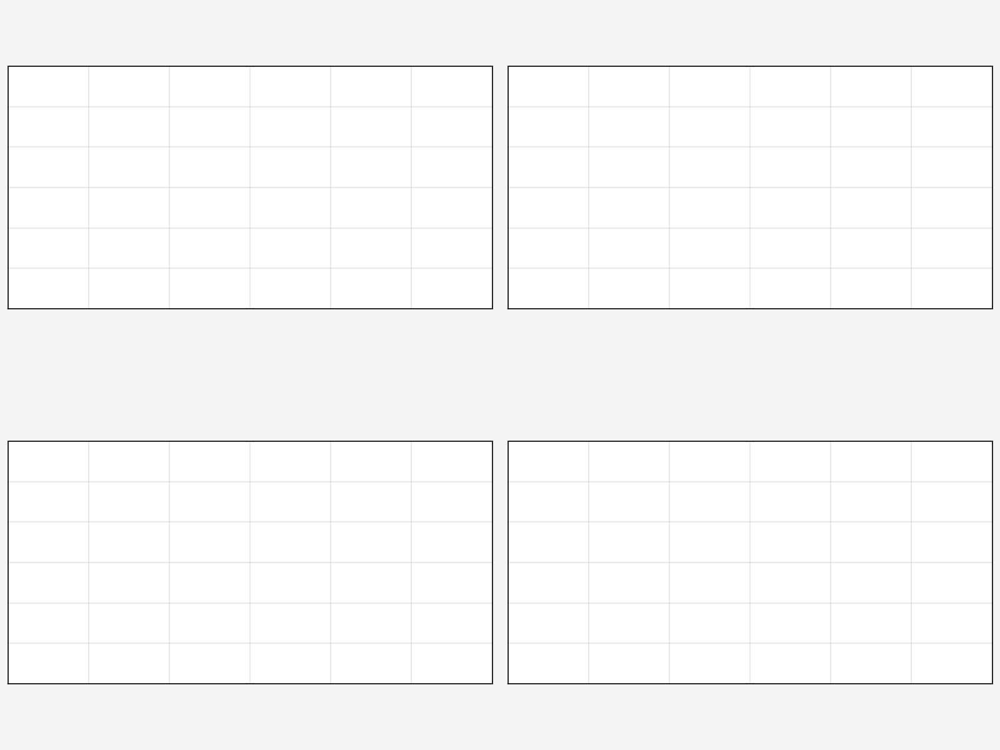

In [33]:
pc = cartopy.crs.PlateCarree()
lon_formatter = LongitudeFormatter(zero_direction_label=True)
lat_formatter = LatitudeFormatter()

# ds_r_g16 = ds_g16.isel()

fig1, axs = plot.subplots(nrows=2,ncols=2,proj='cyl',width='8in',height='6in')

m00=axs[0,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, 
        np.log10(Vag_var_t1av_r_TL), levels=np.arange(-4,-1+0.1,0.5), 
        transform=pc, cmap="viridis", extend='both')
axs[0,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[0,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,0].format(land=True, landcolor='grey')
axs[0,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,0].xaxis.set_major_formatter(lon_formatter)
axs[0,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,0].yaxis.set_major_formatter(lat_formatter)
axs[0,0].set_title(r'$\Delta$SSH (LR)', fontsize=12, fontweight='bold')
axs[0,0].text(-84, 53, 'a', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')

m01=axs[0,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, 
        np.log10(Vag_var_t1av_r_TH), levels=np.arange(-4,-1+0.1,0.5), 
        transform=pc, cmap="viridis", extend='both')
axs[0,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,1].format(land=True, landcolor='grey')
axs[0,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,1].xaxis.set_major_formatter(lon_formatter)
axs[0,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,1].yaxis.set_major_formatter(lat_formatter)
axs[0,1].set_title(r'$\Delta$SSH (HR)', fontsize=12, fontweight='bold')
axs[0,1].text(-84, 53, 'b', transform=pc, fontsize=12)
# add colorbar
cb = axs[0,1].colorbar(m01,loc='r', label='[cm]',width='2em')

# m10=axs[1,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, 
#         Vag_var_t1av_r_TL/Vg_var_t1av_r_TL, levels=np.arange(0,1+0.1,0.2), 
#         transform=pc, cmap="viridis", extend='max')
# axs[1,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# # Boston (71.1W, 42.4N)
# axs[1,0].coastlines(resolution='110m', color='black', linewidth=1)
# axs[1,0].format(land=True, landcolor='grey')
# axs[1,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
# axs[1,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
# axs[1,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
# axs[1,0].xaxis.set_major_formatter(lon_formatter)
# axs[1,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
# axs[1,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
# axs[1,0].yaxis.set_major_formatter(lat_formatter)
# axs[1,0].set_title(r'$\Delta$SSH (LR)', fontsize=12, fontweight='bold')
# axs[1,0].text(-84, 53, 'a', transform=pc, fontsize=12)
# # # add colorbar
# # cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')

# m11=axs[1,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, 
#             Vag_var_t1av_r_TL/Vg_var_t1av_r_TH, levels=np.arange(0,1+0.1,0.2), 
#         transform=pc, cmap="viridis", extend='max')
# axs[1,1].coastlines(resolution='110m', color='black', linewidth=1)
# axs[1,1].format(land=True, landcolor='grey')
# axs[1,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
# axs[1,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
# axs[1,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
# axs[1,1].xaxis.set_major_formatter(lon_formatter)
# axs[1,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
# axs[1,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
# axs[1,1].yaxis.set_major_formatter(lat_formatter)
# axs[1,1].set_title(r'$\Delta$SSH (HR)', fontsize=12, fontweight='bold')
# axs[1,1].text(-84, 53, 'b', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[1,1].colorbar(m11,loc='r', label='[cm]',width='2em')

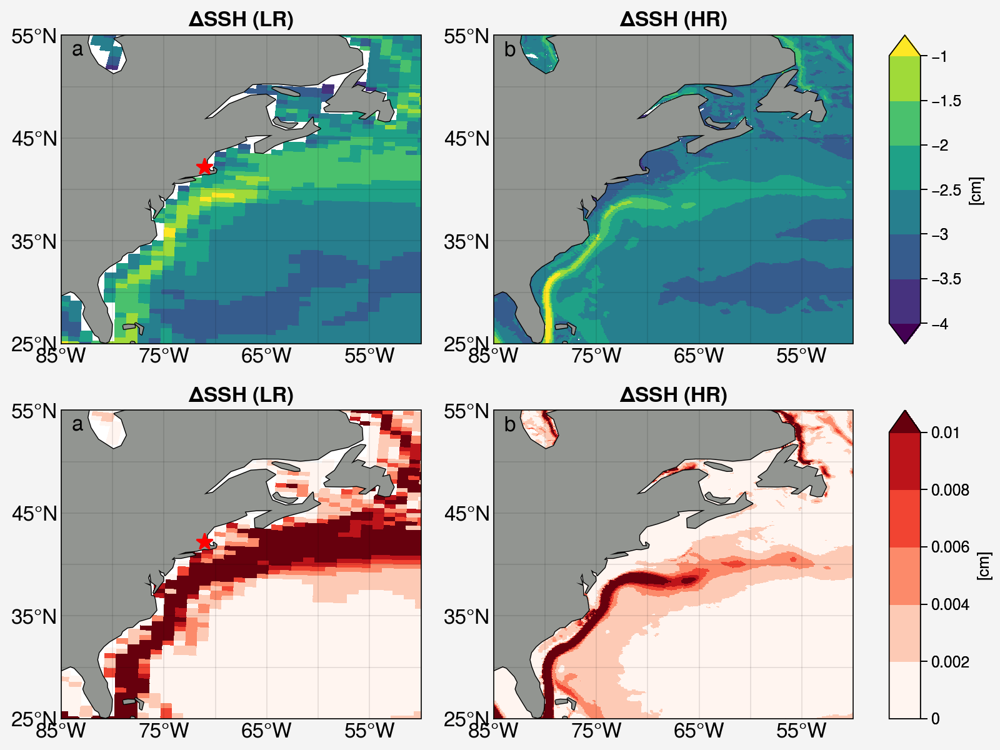

In [117]:
pc = cartopy.crs.PlateCarree()
lon_formatter = LongitudeFormatter(zero_direction_label=True)
lat_formatter = LatitudeFormatter()

ds_r_g16 = ds_g16.isel()

fig1, axs = plot.subplots(nrows=2,ncols=2,proj='cyl',width='8in',height='6in')

m00=axs[0,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, 
        np.log10(Vag_var_t1av_r_TL), levels=np.arange(-4,-1+0.1,0.5), 
        transform=pc, cmap="viridis", extend='both')
axs[0,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[0,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,0].format(land=True, landcolor='grey')
axs[0,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,0].xaxis.set_major_formatter(lon_formatter)
axs[0,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,0].yaxis.set_major_formatter(lat_formatter)
axs[0,0].set_title(r'$\Delta$SSH (LR)', fontsize=12, fontweight='bold')
axs[0,0].text(-84, 53, 'a', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')

m01=axs[0,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, 
               np.log10(Vag_var_t1av_r_TH), levels=np.arange(-4,-1+0.1,0.5), 
        transform=pc, cmap="viridis", extend='both')
axs[0,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[0,1].format(land=True, landcolor='grey')
axs[0,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[0,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[0,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[0,1].xaxis.set_major_formatter(lon_formatter)
axs[0,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[0,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[0,1].yaxis.set_major_formatter(lat_formatter)
axs[0,1].set_title(r'$\Delta$SSH (HR)', fontsize=12, fontweight='bold')
axs[0,1].text(-84, 53, 'b', transform=pc, fontsize=12)
# add colorbar
cb = axs[0,1].colorbar(m01,loc='r', label='[cm]',width='2em')

m10=axs[1,0].pcolormesh(xds_r_g16.ULONG, xds_r_g16.ULAT, 
        Vag_var_t1av_r_TL, levels=[0, 0.002, 0.004, 0.006, 0.008, 0.01], 
        transform=pc, cmap="Reds", extend='max')
axs[1,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# Boston (71.1W, 42.4N)
axs[1,0].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,0].format(land=True, landcolor='grey')
axs[1,0].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,0].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,0].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,0].xaxis.set_major_formatter(lon_formatter)
axs[1,0].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,0].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,0].yaxis.set_major_formatter(lat_formatter)
axs[1,0].set_title(r'$\Delta$SSH (LR)', fontsize=12, fontweight='bold')
axs[1,0].text(-84, 53, 'a', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[0,0].colorbar(m00,loc='r', label='[cm]',width='2em')

m11=axs[1,1].pcolormesh(xds_r_t12.ULONG, xds_r_t12.ULAT, 
               Vag_var_t1av_r_TH, levels=[0, 0.002, 0.004, 0.006, 0.008, 0.01], 
        transform=pc, cmap="Reds", extend='max')
axs[1,1].coastlines(resolution='110m', color='black', linewidth=1)
axs[1,1].format(land=True, landcolor='grey')
axs[1,1].set_extent([lon1_r, lon2_r, lat1_r, lat2_r], crs=pc)
axs[1,1].set_xticks(np.arange(lon1_r,lon2_r+1,10), crs=pc)
axs[1,1].set_xticklabels(np.arange(lon1_r,lon2_r+1,10), fontsize=12)
axs[1,1].xaxis.set_major_formatter(lon_formatter)
axs[1,1].set_yticks(np.arange(lat1_r,lat2_r+1, 10), crs=pc)
axs[1,1].set_yticklabels(np.arange(lat1_r,lat2_r+1, 10), fontsize=12)
axs[1,1].yaxis.set_major_formatter(lat_formatter)
axs[1,1].set_title(r'$\Delta$SSH (HR)', fontsize=12, fontweight='bold')
axs[1,1].text(-84, 53, 'b', transform=pc, fontsize=12)
# add colorbar
cb = axs[1,1].colorbar(m11,loc='r', label='[cm]',width='2em')

# m10=axs[1,0].pcolormesh(ds_NA_g16.TLONG, ds_NA_g16.TLAT, 
#         dh_rst_NA_TLmCL,levels=np.arange(-25,25+1,5), 
#         transform=pc, cmap="spectral_r", extend='both')
# # axs[0,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# # Boston (71.1W, 42.4N)
# axs[1,0].coastlines(resolution='110m', color='black', linewidth=1)
# axs[1,0].format(land=True, landcolor='grey')
# axs[1,0].set_extent([lon1_GMa, lon2_GMa, lat1_GMa, lat2_GMa], crs=pc)
# axs[1,0].set_xticks(np.arange(lon1_GMa,lon2_GMa+1,10), crs=pc)
# axs[1,0].set_xticklabels(np.arange(lon1_GMa,lon2_GMa+1,10), fontsize=12)
# axs[1,0].xaxis.set_major_formatter(lon_formatter)
# axs[1,0].set_yticks(np.arange(lat1_GMa,lat2_GMa+1, 10), crs=pc)
# axs[1,0].set_yticklabels(np.arange(lat1_GMa,lat2_GMa+1, 10), fontsize=12)
# axs[1,0].yaxis.set_major_formatter(lat_formatter)
# axs[1,0].set_title('(LR)', fontsize=15, fontweight='bold')
# axs[1,0].set_title(r'$\Delta$steric height (LR)', fontsize=12, fontweight='bold')
# axs[1,0].text(-84, 53, 'c', transform=pc, fontsize=12)
# ap=axs[1,0].add_patch(mpatches.Rectangle(xy=[lon1b_GMa, lat1b_GMa], 
#                                          width=(lon2b_GMa-lon1b_GMa), height=(lat2b_GMa-lat1b_GMa),
#                                          facecolor='none',transform=pc,
#                                          linewidth=2, edgecolor='r'))
# ap.set_zorder(2)


# m11=axs[1,1].pcolormesh(ds_NA_t12.TLONG, ds_NA_t12.TLAT, 
#         dh_rst_NA_THmCH, levels=np.arange(-25,25+1,5), 
#         transform=pc, cmap="spectral_r", extend='both')
# axs[1,1].coastlines(resolution='110m', color='black', linewidth=1)
# axs[1,1].format(land=True, landcolor='grey')
# axs[1,1].set_extent([lon1_GMa, lon2_GMa, lat1_GMa, lat2_GMa], crs=pc)
# axs[1,1].set_xticks(np.arange(lon1_GMa,lon2_GMa+1,10), crs=pc)
# axs[1,1].set_xticklabels(np.arange(lon1_GMa,lon2_GMa+1,10), fontsize=12)
# axs[1,1].xaxis.set_major_formatter(lon_formatter)
# axs[1,1].set_yticks(np.arange(lat1_GMa,lat2_GMa+1, 10), crs=pc)
# axs[1,1].set_yticklabels(np.arange(lat1_GMa,lat2_GMa+1, 10), fontsize=12)
# axs[1,1].yaxis.set_major_formatter(lat_formatter)
# axs[1,1].set_title(r'$\Delta$steric height (HR)', fontsize=12, fontweight='bold')
# axs[1,1].text(-84, 53, 'd', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[1,1].colorbar(m11,loc='r', label='[cm]',width='2em')

# m20=axs[2,0].pcolormesh(ds_NA_g16.TLONG, ds_NA_g16.TLAT, 
#         dh_m_NA_TLmCL,levels=np.arange(-5,40+1,5), 
#         transform=pc, cmap="spectral_r", extend='both')
# # axs[0,0].plot(-71.1,42.2,transform=pc,marker='*',color='r',markersize=10)
# # Boston (71.1W, 42.4N)
# axs[2,0].coastlines(resolution='110m', color='black', linewidth=1)
# axs[2,0].format(land=True, landcolor='grey')
# axs[2,0].set_extent([lon1_GMa, lon2_GMa, lat1_GMa, lat2_GMa], crs=pc)
# axs[2,0].set_xticks(np.arange(lon1_GMa,lon2_GMa+1,10), crs=pc)
# axs[2,0].set_xticklabels(np.arange(lon1_GMa,lon2_GMa+1,10), fontsize=12)
# axs[2,0].xaxis.set_major_formatter(lon_formatter)
# axs[2,0].set_yticks(np.arange(lat1_GMa,lat2_GMa+1, 10), crs=pc)
# axs[2,0].set_yticklabels(np.arange(lat1_GMa,lat2_GMa+1, 10), fontsize=12)
# axs[2,0].yaxis.set_major_formatter(lat_formatter)
# axs[2,0].set_title('(LR)', fontsize=15, fontweight='bold')
# axs[2,0].set_title(r'$\Delta$mass transport (LR)', fontsize=12, fontweight='bold')
# axs[2,0].text(-84, 53, 'e', transform=pc, fontsize=12)


# m21=axs[2,1].pcolormesh(ds_NA_t12.TLONG, ds_NA_t12.TLAT, 
#         dh_m_NA_THmCH,levels=np.arange(-5,40+1,5), 
#         transform=pc, cmap="spectral_r", extend='both')
# axs[2,1].coastlines(resolution='110m', color='black', linewidth=1)
# axs[2,1].format(land=True, landcolor='grey')
# axs[2,1].set_extent([lon1_GMa, lon2_GMa, lat1_GMa, lat2_GMa], crs=pc)
# axs[2,1].set_xticks(np.arange(lon1_GMa,lon2_GMa+1,10), crs=pc)
# axs[2,1].set_xticklabels(np.arange(lon1_GMa,lon2_GMa+1,10), fontsize=12)
# axs[2,1].xaxis.set_major_formatter(lon_formatter)
# axs[2,1].set_yticks(np.arange(lat1_GMa,lat2_GMa+1, 10), crs=pc)
# axs[2,1].set_yticklabels(np.arange(lat1_GMa,lat2_GMa+1, 10), fontsize=12)
# axs[2,1].yaxis.set_major_formatter(lat_formatter)
# axs[2,1].set_title(r'$\Delta$mass transport (HR)', fontsize=12, fontweight='bold')
# axs[2,1].text(-84, 53, 'f', transform=pc, fontsize=12)
# # add colorbar
# cb = axs[2,1].colorbar(m21,loc='r', label='[cm]',width='2em')

# fig1.savefig(pic1,bbox_inches='tight')

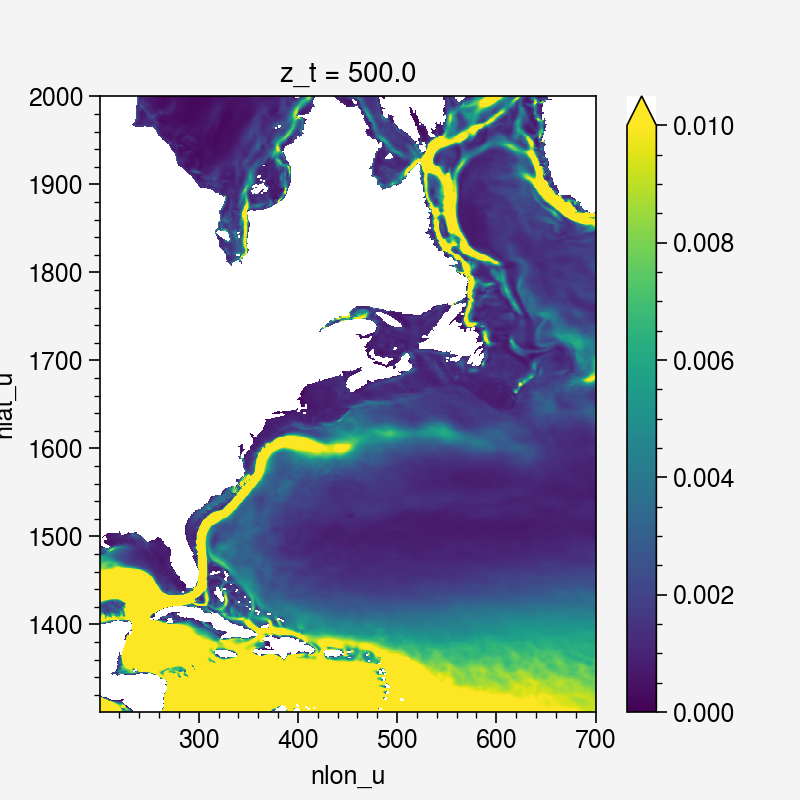

In [84]:
Vag_var_tre_r_TH.sel(time=slice('2001','2020')).mean('time').where(kmu_r_TH>0, np.nan).plot(vmin=0, vmax=0.01)

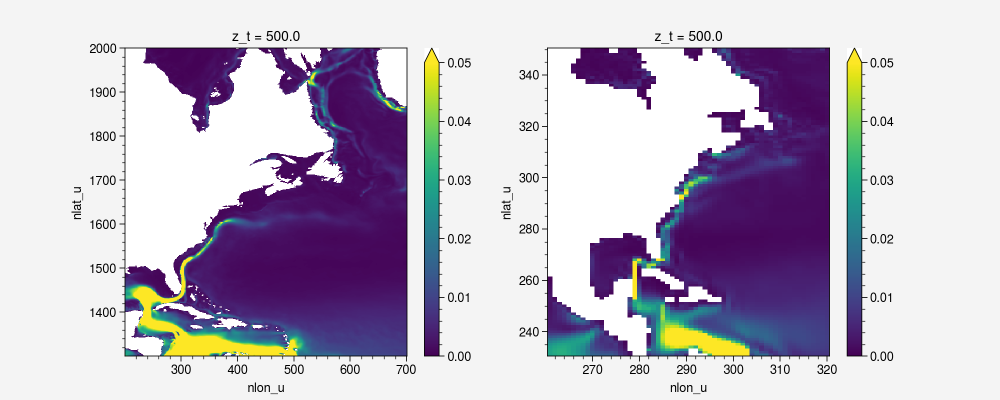

In [56]:
spd_Vag_tav_rm_TH = (spd_Vag_r_TH**2).isel(time=slice(0,20*12)).mean('time').where(kmu_r_TH>0, np.nan)
spd_Vag_tav_rm_TL = (spd_Vag_r_TL**2).isel(time=slice(0,20*12)).mean('time').where(kmu_r_TL>0, np.nan)
fig, axs = plt.subplots(1,2,figsize=(10, 4))
spd_Vag_tav_rm_TH.plot(ax=axs[0], vmin=0, vmax=0.05)
spd_Vag_tav_rm_TL.plot(ax=axs[1], vmin=0, vmax=0.05)

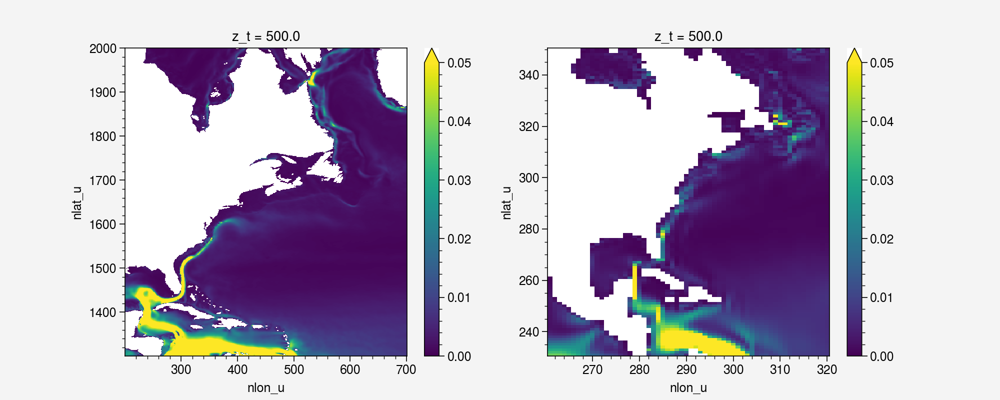

In [57]:
spd_Vag_tav_rm_TH = (spd_Vag_r_TH**2).isel(time=slice(-20*12,-1)).mean('time').where(kmu_r_TH>0, np.nan)
spd_Vag_tav_rm_TL = (spd_Vag_r_TL**2).isel(time=slice(-20*12,-1)).mean('time').where(kmu_r_TL>0, np.nan)
fig, axs = plt.subplots(1,2,figsize=(10, 4))
spd_Vag_tav_rm_TH.plot(ax=axs[0], vmin=0, vmax=0.05)
spd_Vag_tav_rm_TL.plot(ax=axs[1], vmin=0, vmax=0.05)

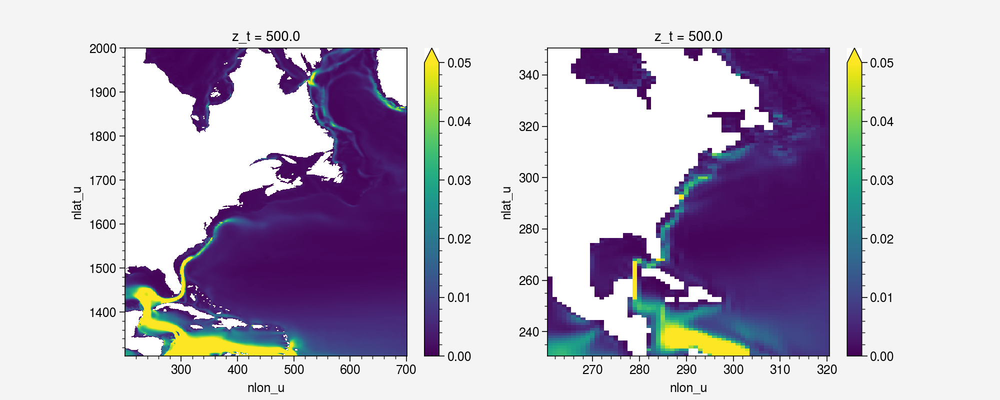

In [54]:
# spd_tav_rm_TH = spd_r_TH.mean('time').where(kmu_r_TH>0, np.nan)
# spd_tav_rm_TL = spd_r_TL.mean('time').where(kmu_r_TL>0, np.nan)

# fig, axs = plt.subplots(1,2,figsize=(10, 4))
# spd_tav_rm_TH.plot(ax=axs[0])
# spd_tav_rm_TL.plot(ax=axs[1])

# spd_Vag_tav_rm_TH = (spd_Vag_r_TH**2).mean('time').where(kmu_r_TH>0, np.nan)
# spd_Vag_tav_rm_TL = (spd_Vag_r_TL**2).mean('time').where(kmu_r_TL>0, np.nan)

fig, axs = plt.subplots(1,2,figsize=(10, 4))
spd_Vag_tav_rm_TH.plot(ax=axs[0], vmin=0, vmax=0.05)
spd_Vag_tav_rm_TL.plot(ax=axs[1], vmin=0, vmax=0.05)

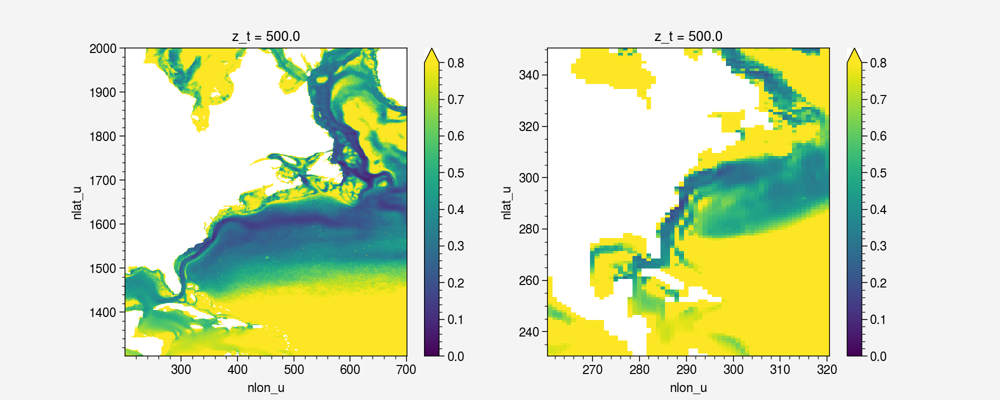

In [44]:
Vag2V_r_TH = spd_Vag_r_TH/spd_r_TH
Vag2V_r_TL = spd_Vag_r_TL/spd_r_TL

Vag2V_tav_rm_TH = Vag2V_r_TH.mean('time').where(kmu_r_TH>0, np.nan)
Vag2V_tav_rm_TL = Vag2V_r_TL.mean('time').where(kmu_r_TL>0, np.nan)

fig, axs = plt.subplots(1,2,figsize=(10, 4))
Vag2V_tav_rm_TH.plot(ax=axs[0], vmin=0, vmax=0.8)
Vag2V_tav_rm_TL.plot(ax=axs[1], vmin=0, vmax=0.8)

In [ ]:
spd_ag_r_TH = xr.ufuncs.sqrt(Uag_r_TH**2 + Vag_r_TH**2)
spd_r_TH = xr.ufuncs.sqrt(uvel_r_TH**2 + vvel_r_TH**2)

spd_ag_r_TL = xr.ufuncs.sqrt(Uag_r_TL**2 + Vag_r_TL**2)
spd_r_TL = xr.ufuncs.sqrt(uvel_r_TL**2 + vvel_r_TL**2)
# Uag_r = uvel_r - Ug_r
# Vag_r = vvel_r - Vg_r
fig, axs = plt.subplots(1,2,figsize=(10,4))
np.abs(spd_ag_r/spd_r).where(kmu_r>0).plot(ax=axs[0], vmin=0, vmax=1)
np.abs(spd_ag_r_TL/spd_r_TL).plot(ax=axs[1], vmin=0, vmax=1)

In [69]:
# ds_TL = ds_uvel_TL
# ds_TL["VVEL"] = ds_vvel_TL.VVEL
# # ds_TL["SSH"] = ds_ssh_TL.SSH
# # ds_TL["DZT"] = ds_3dDZT_t12.dz # cm
# # ds_TL["DZU"] = ds_3dDZU_t12.dz # cm
# ds_TL

<xarray.Dataset>
Dimensions:               (d2: 2, lat_aux_grid: 395, moc_comp: 3, moc_z: 61, nchar: 256, nlat: 384, nlon: 320, time: 3070, transport_comp: 5, transport_reg: 2, z_t: 60, z_t_150m: 15, z_w: 60, z_w_bot: 60, z_w_top: 60)
Coordinates:
  * time                  (time) object 1850-02-01 00:00:00 ... 2105-12-01 00...
  * z_t                   (z_t) float32 500.0 1.5e+03 ... 5.125e+05 5.375e+05
  * z_t_150m              (z_t_150m) float32 500.0 1.5e+03 ... 1.35e+04 1.45e+04
  * z_w                   (z_w) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_top               (z_w_top) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_bot               (z_w_bot) float32 1e+03 2e+03 ... 5.25e+05 5.5e+05
  * lat_aux_grid          (lat_aux_grid) float32 -79.49 -78.95 ... 89.47 90.0
  * moc_z                 (moc_z) float32 0.0 1e+03 2e+03 ... 5.25e+05 5.5e+05
    ULONG                 (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    ULAT                  (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    TLONG                 (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    TLAT                  (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
Dimensions without coordinates: d2, moc_comp, nchar, nlat, nlon, transport_comp, transport_reg
Data variables: (12/56)
    moc_components        (moc_comp, nchar) |S1 dask.array<chunksize=(3, 256), meta=np.ndarray>
    transport_components  (transport_comp, nchar) |S1 dask.array<chunksize=(5, 256), meta=np.ndarray>
    transport_regions     (transport_reg, nchar) |S1 dask.array<chunksize=(2, 256), meta=np.ndarray>
    dz                    (z_t) float32 dask.array<chunksize=(1,), meta=np.ndarray>
    dzw                   (z_w) float32 dask.array<chunksize=(60,), meta=np.ndarray>
    KMT                   (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    ...                    ...
    nsurface_t            float64 ...
    nsurface_u            float64 ...
    time_bound            (time, d2) object dask.array<chunksize=(1872, 2), meta=np.ndarray>
    UVEL                  (time, z_t, nlat, nlon) float32 dask.array<chunksize=(1872, 1, 384, 64), meta=np.ndarray>
    VVEL                  (time, z_t, nlat, nlon) float32 dask.array<chunksize=(1872, 1, 384, 64), meta=np.ndarray>
    SSH                   (time, nlat, nlon) float32 dask.array<chunksize=(3070, 384, 64), meta=np.ndarray>
Attributes:
    title:         B.E.13.BHISTC5.ne30g16.sehires38.003.sunway
    history:       none
    Conventions:   CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curren...
    contents:      Diagnostic and Prognostic Variables
    source:        CCSM POP2, the CCSM Ocean Component
    revision:      $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    calendar:      All years have exactly  365 days.
    start_time:    This dataset was created on 2020-04-11 at 22:22:40.9
    cell_methods:  cell_methods = time: mean ==> the variable values are aver...
    nsteps_total:  750
    tavg_sum:      2592000.0

In [ ]:
# ds_TL = ds_uvel_TL
# ds_ssh_TH["DZT"] = ds_3dDZT_t12.DZT*100 # cm
# ds_ssh_TH["DZU"] = ds_3dDZU_t12.DZU*100 # cm
# ds_vvel_TH["DZT"] = ds_3dDZT_t12.DZT*100 # cm
# ds_vvel_TH["DZU"] = ds_3dDZU_t12.DZU*100 # cm
# ds_ssh_TH

In [15]:
# grid_ssh, xds_ssh_TH = pop_tools.to_xgcm_grid_dataset(ds_ssh_TH)
# print(grid_ssh)
# xds_ssh_TH

<xgcm.Grid>
Y Axis (periodic, boundary=None):
  * center   nlat_t --> right
  * right    nlat_u --> center
Z Axis (periodic, boundary=None):
  * center   z_t --> left
  * right    z_w_bot --> center
  * left     z_w_top --> center
X Axis (periodic, boundary=None):
  * center   nlon_t --> right
  * right    nlon_u --> center


<xarray.Dataset>
Dimensions:             (d2: 2, nlat_t: 2400, nlat_u: 2400, nlon_t: 3600, nlon_u: 3600, time: 120, z_t: 62, z_t_150m: 15, z_w_bot: 62, z_w_top: 62)
Coordinates: (12/13)
  * z_t                 (z_t) float32 500.0 1.5e+03 ... 5.625e+05 5.875e+05
    TLAT                (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    TLONG               (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ULAT                (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ULONG               (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
  * time                (time) object 2006-02-01 00:00:00 ... 2016-01-01 00:0...
    ...                  ...
  * z_w_top             (z_w_top) float32 0.0 1e+03 2e+03 ... 5.5e+05 5.75e+05
  * z_w_bot             (z_w_bot) float32 1e+03 2e+03 3e+03 ... 5.75e+05 6e+05
  * nlon_u              (nlon_u) int64 1 2 3 4 5 6 ... 3596 3597 3598 3599 3600
  * nlat_u              (nlat_u) int64 1 2 3 4 5 6 ... 2396 2397 2398 2399 2400
  * nlon_t              (nlon_t) float64 0.5 1.5 2.5 ... 3.598e+03 3.6e+03
  * nlat_t              (nlat_t) float64 0.5 1.5 2.5 ... 2.398e+03 2.4e+03
Dimensions without coordinates: d2
Data variables: (12/53)
    ANGLE               (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ANGLET              (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    DXT                 (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    DXU                 (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    DYT                 (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    DYU                 (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ...                  ...
    sound               float64 ...
    stefan_boltzmann    float64 ...
    time_bound          (time, d2) object dask.array<chunksize=(120, 2), meta=np.ndarray>
    vonkar              float64 ...
    DZT                 (z_t, nlat_t, nlon_t) float64 nan nan nan ... nan nan
    DZU                 (z_t, nlat_u, nlon_u) float64 nan nan nan ... nan nan
Attributes: (12/14)
    title:                      B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway
    history:                    Fri Aug 27 12:07:23 2021: ncap2 -A -s time=ud...
    Conventions:                CF-1.0; http://www.cgd.ucar.edu/cms/eaton/net...
    contents:                   Diagnostic and Prognostic Variables
    source:                     CCSM POP2, the CCSM Ocean Component
    revision:                   $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlev...
    ...                         ...
    cell_methods:               cell_methods = time: mean ==> the variable va...
    nsteps_total:               2296931
    tavg_sum:                   2678400.0
    tavg_sum_qflux:             2678400.0
    NCO:                        netCDF Operators version 4.8.1 (Homepage = ht...
    history_of_appended_files:  Thu Aug 26 23:51:56 2021: Appended file time_...

In [58]:
# ds_vvel_TH["UVEL"] = ds_uvel_TH.UVEL
# grid_vvel, xds_vvel_TH = pop_tools.to_xgcm_grid_dataset(ds_vvel_TH, metrics=metrics)
# print(grid_vvel)
# xds_vvel_TH

<xgcm.Grid>
Y Axis (periodic, boundary=None):
  * center   nlat_t --> right
  * right    nlat_u --> center
Z Axis (periodic, boundary=None):
  * center   z_t --> left
  * right    z_w_bot --> center
  * left     z_w_top --> center
X Axis (periodic, boundary=None):
  * center   nlon_t --> right
  * right    nlon_u --> center


<xarray.Dataset>
Dimensions:             (d2: 2, nlat_t: 2400, nlat_u: 2400, nlon_t: 3600, nlon_u: 3600, time: 12, z_t: 62, z_t_150m: 15, z_w_bot: 62, z_w_top: 62)
Coordinates: (12/13)
  * z_t                 (z_t) float32 500.0 1.5e+03 ... 5.625e+05 5.875e+05
  * z_t_150m            (z_t_150m) float32 500.0 1.5e+03 ... 1.35e+04 1.45e+04
  * z_w_top             (z_w_top) float32 0.0 1e+03 2e+03 ... 5.5e+05 5.75e+05
  * z_w_bot             (z_w_bot) float32 1e+03 2e+03 3e+03 ... 5.75e+05 6e+05
    ULONG               (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ULAT                (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ...                  ...
    TLAT                (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
  * time                (time) object 2006-02-01 00:00:00 ... 2007-01-01 00:0...
  * nlon_u              (nlon_u) int64 1 2 3 4 5 6 ... 3596 3597 3598 3599 3600
  * nlat_u              (nlat_u) int64 1 2 3 4 5 6 ... 2396 2397 2398 2399 2400
  * nlon_t              (nlon_t) float64 0.5 1.5 2.5 ... 3.598e+03 3.6e+03
  * nlat_t              (nlat_t) float64 0.5 1.5 2.5 ... 2.398e+03 2.4e+03
Dimensions without coordinates: d2
Data variables: (12/54)
    dz                  (z_t) float32 dask.array<chunksize=(1,), meta=np.ndarray>
    dzw                 (z_w_top) float32 dask.array<chunksize=(62,), meta=np.ndarray>
    KMT                 (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    KMU                 (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    REGION_MASK         (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    UAREA               (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ...                  ...
    nsurface_u          float64 ...
    time_bound          (time, d2) object dask.array<chunksize=(12, 2), meta=np.ndarray>
    VVEL                (time, z_t, nlat_u, nlon_u) float32 dask.array<chunksize=(12, 1, 400, 300), meta=np.ndarray>
    DZT                 (z_t, nlat_t, nlon_t) float64 nan nan nan ... nan nan
    DZU                 (z_t, nlat_u, nlon_u) float64 nan nan nan ... nan nan
    UVEL                (time, z_t, nlat_u, nlon_u) float32 dask.array<chunksize=(12, 1, 400, 300), meta=np.ndarray>
Attributes:
    title:         B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF
    history:       Wed Aug 25 16:44:41 2021: ncap2 -A -s time=udunits(time, "...
    Conventions:   CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curren...
    contents:      Diagnostic and Prognostic Variables
    source:        CCSM POP2, the CCSM Ocean Component
    revision:      $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    calendar:      All years have exactly  365 days.
    start_time:    This dataset was created on 2020-04-08 at 15:43:53.8
    cell_methods:  cell_methods = time: mean ==> the variable values are aver...
    nsteps_total:  19331
    tavg_sum:      2676600.0
    NCO:           netCDF Operators version 4.8.1 (Homepage = http://nco.sf.n...

In [94]:
# ds_vvel_TL["UVEL"] = ds_uvel_TL.UVEL
# ds_vvel_TL["DZT"] = xr.DataArray(ds_uvel_TL.dz.values[:,None,None]*np.ones((len(ds_uvel_TL.dz),len(ds_uvel_TL.nlat),len(ds_uvel_TL.nlon)))
#                     , dims=['z_t','nlat','nlon'], coords={'z_t':ds_uvel_TL.z_t,'nlat':ds_uvel_TL.nlat,'nlon':ds_uvel_TL.nlon})
# ds_vvel_TL["DZU"] = xr.DataArray(ds_uvel_TL.dz.values[:,None,None]*np.ones((len(ds_uvel_TL.dz),len(ds_uvel_TL.nlat),len(ds_uvel_TL.nlon)))
#                     , dims=['z_t','nlat','nlon'], coords={'z_t':ds_uvel_TL.z_t,'nlat':ds_uvel_TL.nlat,'nlon':ds_uvel_TL.nlon})
# grid_vvel_TL, xds_vvel_TL = pop_tools.to_xgcm_grid_dataset(ds_vvel_TL, metrics=metrics)

# print(grid_vvel_TL)
# xds_vvel_TL

<xgcm.Grid>
Y Axis (periodic, boundary=None):
  * center   nlat_t --> right
  * right    nlat_u --> center
Z Axis (periodic, boundary=None):
  * center   z_t --> left
  * right    z_w_bot --> center
  * left     z_w_top --> center
X Axis (periodic, boundary=None):
  * center   nlon_t --> right
  * right    nlon_u --> center


<xarray.Dataset>
Dimensions:               (d2: 2, lat_aux_grid: 395, moc_comp: 3, moc_z: 61, nchar: 256, nlat_t: 384, nlat_u: 384, nlon_t: 320, nlon_u: 320, time: 3070, transport_comp: 5, transport_reg: 2, z_t: 60, z_t_150m: 15, z_w_bot: 60, z_w_top: 60)
Coordinates: (12/15)
  * z_t                   (z_t) float32 500.0 1.5e+03 ... 5.125e+05 5.375e+05
  * z_t_150m              (z_t_150m) float32 500.0 1.5e+03 ... 1.35e+04 1.45e+04
  * z_w_top               (z_w_top) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_bot               (z_w_bot) float32 1e+03 2e+03 ... 5.25e+05 5.5e+05
  * lat_aux_grid          (lat_aux_grid) float32 -79.49 -78.95 ... 89.47 90.0
  * moc_z                 (moc_z) float32 0.0 1e+03 2e+03 ... 5.25e+05 5.5e+05
    ...                    ...
    TLAT                  (nlat_t, nlon_t) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
  * time                  (time) object 1850-02-01 00:00:00 ... 2105-12-01 00...
  * nlon_u                (nlon_u) int64 1 2 3 4 5 6 ... 315 316 317 318 319 320
  * nlat_u                (nlat_u) int64 1 2 3 4 5 6 ... 379 380 381 382 383 384
  * nlon_t                (nlon_t) float64 0.5 1.5 2.5 3.5 ... 317.5 318.5 319.5
  * nlat_t                (nlat_t) float64 0.5 1.5 2.5 3.5 ... 381.5 382.5 383.5
Dimensions without coordinates: d2, moc_comp, nchar, transport_comp, transport_reg
Data variables: (12/57)
    moc_components        (moc_comp, nchar) |S1 dask.array<chunksize=(3, 256), meta=np.ndarray>
    transport_components  (transport_comp, nchar) |S1 dask.array<chunksize=(5, 256), meta=np.ndarray>
    transport_regions     (transport_reg, nchar) |S1 dask.array<chunksize=(2, 256), meta=np.ndarray>
    dz                    (z_t) float32 dask.array<chunksize=(1,), meta=np.ndarray>
    dzw                   (z_w_top) float32 dask.array<chunksize=(60,), meta=np.ndarray>
    KMT                   (nlat_t, nlon_t) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    ...                    ...
    nsurface_u            float64 ...
    time_bound            (time, d2) object dask.array<chunksize=(1872, 2), meta=np.ndarray>
    VVEL                  (time, z_t, nlat_u, nlon_u) float32 dask.array<chunksize=(1872, 1, 384, 64), meta=np.ndarray>
    UVEL                  (time, z_t, nlat_u, nlon_u) float32 dask.array<chunksize=(1872, 1, 384, 64), meta=np.ndarray>
    DZT                   (z_t, nlat_t, nlon_t) float64 1e+03 1e+03 ... 2.5e+04
    DZU                   (z_t, nlat_u, nlon_u) float64 1e+03 1e+03 ... 2.5e+04
Attributes:
    title:         B.E.13.BHISTC5.ne30g16.sehires38.003.sunway
    history:       none
    Conventions:   CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curren...
    contents:      Diagnostic and Prognostic Variables
    source:        CCSM POP2, the CCSM Ocean Component
    revision:      $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    calendar:      All years have exactly  365 days.
    start_time:    This dataset was created on 2020-04-11 at 22:22:40.9
    cell_methods:  cell_methods = time: mean ==> the variable values are aver...
    nsteps_total:  750
    tavg_sum:      2592000.0

In [60]:
# kmu_r = xds_vvel_TH.KMU.isel(nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))
# kmu_r

<xarray.DataArray 'KMU' (nlat_u: 700, nlon_u: 500)>
dask.array<getitem, shape=(700, 500), dtype=float64, chunksize=(400, 300), chunktype=numpy.ndarray>
Coordinates:
    ULONG    (nlat_u, nlon_u) float64 dask.array<chunksize=(300, 100), meta=np.ndarray>
    ULAT     (nlat_u, nlon_u) float64 dask.array<chunksize=(300, 100), meta=np.ndarray>
  * nlon_u   (nlon_u) int64 201 202 203 204 205 206 ... 695 696 697 698 699 700
  * nlat_u   (nlat_u) int64 1301 1302 1303 1304 1305 ... 1997 1998 1999 2000
Attributes:
    long_name:  k Index of Deepest Grid Cell on U Grid
    grid_loc:   2220

In [17]:
# # === 2022Jan07 DL https://github.com/NCAR/pop-tools/blob/master/docs/source/examples/pop_div_curl_xr_xgcm_metrics_compare.ipynb ===
# # pop_tools should handle this bit in the future
# metrics = {
#     ("X",): ["DXU", "DXT"],  # X distances
#     ("Y",): ["DYU", "DYT"],  # Y distances
#     ("Z",): ["DZU", "DZT"],  # Z distances
#     ("X", "Y"): ["UAREA", "TAREA"],  # areas, technically not needed
# }


# # xgcm metrics
# # gridm, xdsm = pop_tools.to_xgcm_grid_dataset(ds, periodic=False, metrics=metrics)
# grid_ssh, xds_ssh_TH = pop_tools.to_xgcm_grid_dataset(ds_ssh_TH, metrics=metrics)
# xds_ssh_TH

<xarray.Dataset>
Dimensions:             (d2: 2, nlat_t: 2400, nlat_u: 2400, nlon_t: 3600, nlon_u: 3600, time: 120, z_t: 62, z_t_150m: 15, z_w_bot: 62, z_w_top: 62)
Coordinates: (12/13)
  * z_t                 (z_t) float32 500.0 1.5e+03 ... 5.625e+05 5.875e+05
    TLAT                (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    TLONG               (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ULAT                (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ULONG               (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
  * time                (time) object 2006-02-01 00:00:00 ... 2016-01-01 00:0...
    ...                  ...
  * z_w_top             (z_w_top) float32 0.0 1e+03 2e+03 ... 5.5e+05 5.75e+05
  * z_w_bot             (z_w_bot) float32 1e+03 2e+03 3e+03 ... 5.75e+05 6e+05
  * nlon_u              (nlon_u) int64 1 2 3 4 5 6 ... 3596 3597 3598 3599 3600
  * nlat_u              (nlat_u) int64 1 2 3 4 5 6 ... 2396 2397 2398 2399 2400
  * nlon_t              (nlon_t) float64 0.5 1.5 2.5 ... 3.598e+03 3.6e+03
  * nlat_t              (nlat_t) float64 0.5 1.5 2.5 ... 2.398e+03 2.4e+03
Dimensions without coordinates: d2
Data variables: (12/53)
    ANGLE               (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ANGLET              (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    DXT                 (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    DXU                 (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    DYT                 (nlat_t, nlon_t) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    DYU                 (nlat_u, nlon_u) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ...                  ...
    sound               float64 ...
    stefan_boltzmann    float64 ...
    time_bound          (time, d2) object dask.array<chunksize=(120, 2), meta=np.ndarray>
    vonkar              float64 ...
    DZT                 (z_t, nlat_t, nlon_t) float64 nan nan nan ... nan nan
    DZU                 (z_t, nlat_u, nlon_u) float64 nan nan nan ... nan nan
Attributes: (12/14)
    title:                      B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway
    history:                    Fri Aug 27 12:07:23 2021: ncap2 -A -s time=ud...
    Conventions:                CF-1.0; http://www.cgd.ucar.edu/cms/eaton/net...
    contents:                   Diagnostic and Prognostic Variables
    source:                     CCSM POP2, the CCSM Ocean Component
    revision:                   $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlev...
    ...                         ...
    cell_methods:               cell_methods = time: mean ==> the variable va...
    nsteps_total:               2296931
    tavg_sum:                   2678400.0
    tavg_sum_qflux:             2678400.0
    NCO:                        netCDF Operators version 4.8.1 (Homepage = ht...
    history_of_appended_files:  Thu Aug 26 23:51:56 2021: Appended file time_...

In [81]:
# # expand dzt to 3d array, copied from heat_budget_Global_FOSI.ipynb
# dzt_3d_LR = xr.DataArray(ds_uvel_TL.dz.values[:,None,None]*np.ones((len(ds_uvel_TL.dz),len(ds_uvel_TL.nlat),len(ds_uvel_TL.nlon)))
#                      , dims=['z_t','nlat','nlon'], coords={'z_t':ds_uvel_TL.z_t,'nlat':ds_uvel_TL.nlat,'nlon':ds_uvel_TL.nlon})

<xarray.DataArray (z_t: 60, nlat: 384, nlon: 320)>
array([[[ 1000.        ,  1000.        ,  1000.        , ...,
          1000.        ,  1000.        ,  1000.        ],
        [ 1000.        ,  1000.        ,  1000.        , ...,
          1000.        ,  1000.        ,  1000.        ],
        [ 1000.        ,  1000.        ,  1000.        , ...,
          1000.        ,  1000.        ,  1000.        ],
        ...,
        [ 1000.        ,  1000.        ,  1000.        , ...,
          1000.        ,  1000.        ,  1000.        ],
        [ 1000.        ,  1000.        ,  1000.        , ...,
          1000.        ,  1000.        ,  1000.        ],
        [ 1000.        ,  1000.        ,  1000.        , ...,
          1000.        ,  1000.        ,  1000.        ]],

       [[ 1000.        ,  1000.        ,  1000.        , ...,
          1000.        ,  1000.        ,  1000.        ],
        [ 1000.        ,  1000.        ,  1000.        , ...,
          1000.        ,  1000.        ,  1000.        ],
        [ 1000.        ,  1000.        ,  1000.        , ...,
          1000.        ,  1000.        ,  1000.        ],
...
        [24996.24414062, 24996.24414062, 24996.24414062, ...,
         24996.24414062, 24996.24414062, 24996.24414062],
        [24996.24414062, 24996.24414062, 24996.24414062, ...,
         24996.24414062, 24996.24414062, 24996.24414062],
        [24996.24414062, 24996.24414062, 24996.24414062, ...,
         24996.24414062, 24996.24414062, 24996.24414062]],

       [[24998.109375  , 24998.109375  , 24998.109375  , ...,
         24998.109375  , 24998.109375  , 24998.109375  ],
        [24998.109375  , 24998.109375  , 24998.109375  , ...,
         24998.109375  , 24998.109375  , 24998.109375  ],
        [24998.109375  , 24998.109375  , 24998.109375  , ...,
         24998.109375  , 24998.109375  , 24998.109375  ],
        ...,
        [24998.109375  , 24998.109375  , 24998.109375  , ...,
         24998.109375  , 24998.109375  , 24998.109375  ],
        [24998.109375  , 24998.109375  , 24998.109375  , ...,
         24998.109375  , 24998.109375  , 24998.109375  ],
        [24998.109375  , 24998.109375  , 24998.109375  , ...,
         24998.109375  , 24998.109375  , 24998.109375  ]]])
Coordinates:
  * z_t      (z_t) float32 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
  * nlat     (nlat) int64 0 1 2 3 4 5 6 7 8 ... 376 377 378 379 380 381 382 383
  * nlon     (nlon) int64 0 1 2 3 4 5 6 7 8 ... 312 313 314 315 316 317 318 319

In [84]:
# ds_ssh_TL["DXT"]=ds_uvel_TL.DXT
# ds_ssh_TL["DYT"]=ds_uvel_TL.DYT
# ds_ssh_TL["DXU"]=ds_uvel_TL.DXU
# ds_ssh_TL["DYU"]=ds_uvel_TL.DYU
# ds_ssh_TL["DZT"]=xr.DataArray(ds_uvel_TL.dz.values[:,None,None]*np.ones((len(ds_uvel_TL.dz),len(ds_uvel_TL.nlat),len(ds_uvel_TL.nlon)))
#                     , dims=['z_t','nlat','nlon'], coords={'z_t':ds_uvel_TL.z_t,'nlat':ds_uvel_TL.nlat,'nlon':ds_uvel_TL.nlon})
# ds_ssh_TL["DZU"]=xr.DataArray(ds_uvel_TL.dz.values[:,None,None]*np.ones((len(ds_uvel_TL.dz),len(ds_uvel_TL.nlat),len(ds_uvel_TL.nlon)))
#                     , dims=['z_t','nlat','nlon'], coords={'z_t':ds_uvel_TL.z_t,'nlat':ds_uvel_TL.nlat,'nlon':ds_uvel_TL.nlon})
# ds_ssh_TL["UAREA"]=ds_uvel_TL.UAREA
# ds_ssh_TL["TAREA"]=ds_uvel_TL.TAREA
# ds_ssh_TL

<xarray.Dataset>
Dimensions:     (d2: 2, nlat: 384, nlon: 320, time: 3012, z_t: 60)
Coordinates:
  * nlat        (nlat) int64 0 1 2 3 4 5 6 7 ... 376 377 378 379 380 381 382 383
  * nlon        (nlon) int64 0 1 2 3 4 5 6 7 ... 312 313 314 315 316 317 318 319
  * time        (time) object 1850-01-17 12:00:00 ... 2100-12-17 00:00:00
    TLONG       (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    TLAT        (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    ULONG       (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    ULAT        (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
  * z_t         (z_t) float32 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
Dimensions without coordinates: d2
Data variables:
    time_bound  (time, d2) object dask.array<chunksize=(3012, 2), meta=np.ndarray>
    SSH         (time, nlat, nlon) float32 dask.array<chunksize=(3012, 384, 64), meta=np.ndarray>
    DXT         (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    DYT         (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    DXU         (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    DYU         (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    DZT         (z_t, nlat, nlon) float64 1e+03 1e+03 1e+03 ... 2.5e+04 2.5e+04
    DZU         (z_t, nlat, nlon) float64 1e+03 1e+03 1e+03 ... 2.5e+04 2.5e+04
    UAREA       (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    TAREA       (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
Attributes: (12/13)
    title:           B.E.13.BHISTC5.ne30g16.sehires38.003.sunway
    history:         Thu May 14 01:43:04 2020: ncra -O -v SSH /home/export/on...
    Conventions:     CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curr...
    contents:        Diagnostic and Prognostic Variables
    source:          CCSM POP2, the CCSM Ocean Component
    revision:        $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    ...              ...
    start_time:      This dataset was created on 2020-04-11 at 22:12:21.5
    cell_methods:    cell_methods = time: mean ==> the variable values are av...
    nsteps_total:    25
    tavg_sum:        86400.0
    tavg_sum_qflux:  86400.0
    NCO:             netCDF Operators version 4.9.1 (Homepage = http://nco.sf...

In [85]:
# grid_ssh_TL, xds_ssh_TL = pop_tools.to_xgcm_grid_dataset(ds_ssh_TL, metrics=metrics)
# xds_ssh_TL

<xarray.Dataset>
Dimensions:     (d2: 2, nlat_t: 384, nlat_u: 384, nlon_t: 320, nlon_u: 320, time: 3012, z_t: 60)
Coordinates:
  * time        (time) object 1850-01-17 12:00:00 ... 2100-12-17 00:00:00
    TLONG       (nlat_t, nlon_t) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    TLAT        (nlat_t, nlon_t) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    ULONG       (nlat_u, nlon_u) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    ULAT        (nlat_u, nlon_u) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
  * z_t         (z_t) float32 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
  * nlon_u      (nlon_u) int64 1 2 3 4 5 6 7 8 ... 314 315 316 317 318 319 320
  * nlat_u      (nlat_u) int64 1 2 3 4 5 6 7 8 ... 378 379 380 381 382 383 384
  * nlon_t      (nlon_t) float64 0.5 1.5 2.5 3.5 4.5 ... 316.5 317.5 318.5 319.5
  * nlat_t      (nlat_t) float64 0.5 1.5 2.5 3.5 4.5 ... 380.5 381.5 382.5 383.5
Dimensions without coordinates: d2
Data variables:
    time_bound  (time, d2) object dask.array<chunksize=(3012, 2), meta=np.ndarray>
    SSH         (time, nlat_t, nlon_t) float32 dask.array<chunksize=(3012, 384, 64), meta=np.ndarray>
    DXT         (nlat_t, nlon_t) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    DYT         (nlat_t, nlon_t) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    DXU         (nlat_u, nlon_u) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    DYU         (nlat_u, nlon_u) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    DZT         (z_t, nlat_t, nlon_t) float64 1e+03 1e+03 ... 2.5e+04 2.5e+04
    DZU         (z_t, nlat_u, nlon_u) float64 1e+03 1e+03 ... 2.5e+04 2.5e+04
    UAREA       (nlat_u, nlon_u) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    TAREA       (nlat_t, nlon_t) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
Attributes: (12/13)
    title:           B.E.13.BHISTC5.ne30g16.sehires38.003.sunway
    history:         Thu May 14 01:43:04 2020: ncra -O -v SSH /home/export/on...
    Conventions:     CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curr...
    contents:        Diagnostic and Prognostic Variables
    source:          CCSM POP2, the CCSM Ocean Component
    revision:        $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    ...              ...
    start_time:      This dataset was created on 2020-04-11 at 22:12:21.5
    cell_methods:    cell_methods = time: mean ==> the variable values are av...
    nsteps_total:    25
    tavg_sum:        86400.0
    tavg_sum_qflux:  86400.0
    NCO:             netCDF Operators version 4.9.1 (Homepage = http://nco.sf...

In [18]:
# # === 2022Jan07 DL https://github.com/NCAR/pop-tools/blob/master/docs/source/examples/pop_div_curl_xr_xgcm_metrics_compare.ipynb ===
# # xgcm_metrics -> this becomes really easy!
# def x_gradh(F, grid):
#     """
#     gradient of scalar xgcm_metrics
#     for pop
#     """
#     F_yi = grid.interp(F, axis="Y", boundary="extend")  # 0.5*(F[i,j+1]+F[i,j])
#     F_xi = grid.interp(F, axis="X", boundary="extend")  # 0.5*(F[i+1,j]+F[i,j])
#     dFdx = grid.derivative(F_yi, axis="X", boundary="extend")
#     dFdy = grid.derivative(F_xi, axis="Y", boundary="extend")
#     return dFdx, dFdy

In [86]:
# dsshdx_TL, dsshdy_TL = x_gradh(xds_ssh_TL.SSH, grid_ssh_TL)  # xgcm metrics version
# dsshdx_TL
# GX_xgcm_m, GY_xgcm_m = x_gradh(xds_ssh_TH.SSH, grid_ssh)  # xgcm metrics version
# GX_xgcm_m

,Array,Chunk
Bytes,7.72 GiB,109.22 MiB
Shape,"(120, 2400, 3600)","(120, 399, 299)"
Count,3914 Tasks,288 Chunks
Type,float64,numpy.ndarray


<xarray.DataArray (nlat_u: 120, nlon_u: 60)>
array([[-0.00563649, -0.00911043, -0.00965184, ..., -0.01197683,
        -0.01145732, -0.00938453],
       [-0.00593588, -0.01015809, -0.01114974, ..., -0.01174809,
        -0.01172901, -0.00979703],
       [-0.00625128, -0.01085712, -0.01197227, ..., -0.01143861,
        -0.01190926, -0.01021389],
       ...,
       [        nan,         nan,         nan, ..., -0.08594309,
         0.02475834,  0.02585299],
       [        nan,         nan,         nan, ..., -0.1207503 ,
         0.01434454,  0.00380798],
       [        nan,         nan,         nan, ..., -0.15303896,
         0.0103756 , -0.02962687]])
Coordinates:
    time     object 1933-05-17 00:00:00
  * nlat_u   (nlat_u) int64 231 232 233 234 235 236 ... 345 346 347 348 349 350
  * nlon_u   (nlon_u) int64 261 262 263 264 265 266 ... 315 316 317 318 319 320

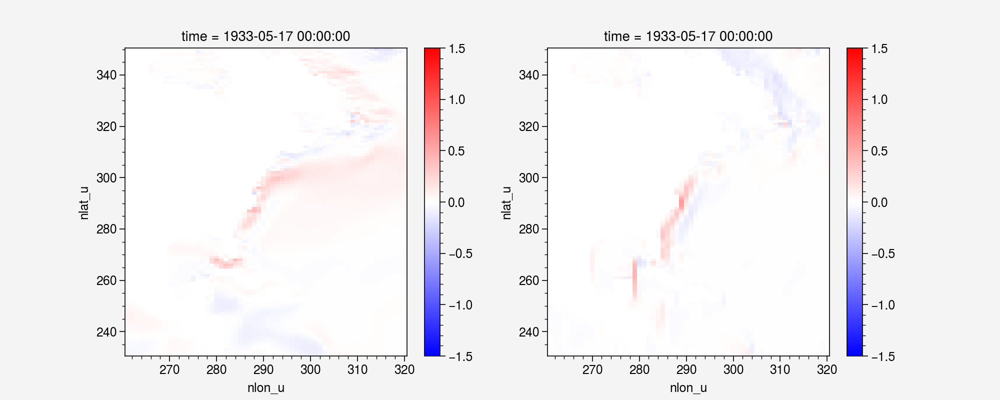

In [92]:
# dsshdx_TL
# Vg_r_TL = dsshdx_TL.isel(time=1000, nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))*10/1e-4 # m/s
# Vg_r_TL = Vg_r_TL.compute()
# Ug_r_TL = -dsshdy_TL.isel(time=1000, nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))*10/1e-4 # m/s
# Ug_r_TL = Ug_r_TL.compute()

# fig, axs = plt.subplots(1,2,figsize=(10,4))
# Ug_r_TL.plot(ax=axs[0],vmin=-1.5, vmax=1.5, cmap='bwr')
# Vg_r_TL.plot(ax=axs[1],vmin=-1.5, vmax=1.5, cmap='bwr')
# Vg_r_TL

<xarray.DataArray (nlat_u: 700, nlon_u: 500)>
array([[-0.08515261, -0.0857871 , -0.08235244, ..., -0.00505422,
        -0.00414828, -0.00338768],
       [-0.08900866, -0.08392041, -0.08032952, ..., -0.0052653 ,
        -0.00453051, -0.00407608],
       [-0.09059807, -0.08209821, -0.0802281 , ..., -0.00536666,
        -0.00472522, -0.00455793],
       ...,
       [-0.        , -0.        , -0.        , ..., -0.        ,
        -0.        , -0.        ],
       [-0.        , -0.        , -0.        , ..., -0.        ,
        -0.        , -0.        ],
       [-0.        , -0.        , -0.        , ...,         nan,
                nan,         nan]])
Coordinates:
    time     object 2006-02-01 00:00:00
  * nlat_u   (nlat_u) int64 1301 1302 1303 1304 1305 ... 1997 1998 1999 2000
  * nlon_u   (nlon_u) int64 201 202 203 204 205 206 ... 695 696 697 698 699 700

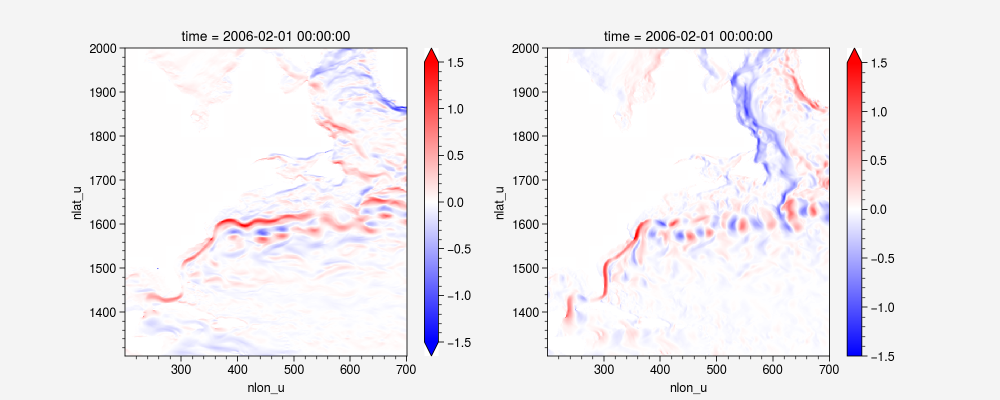

In [53]:
# Vg_r = GX_xgcm_m.isel(time=0, nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))*10/1e-4 # m/s
# Vg_r = Vg_r.compute()
# Ug_r = -GY_xgcm_m.isel(time=0, nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))*10/1e-4 # m/s
# Ug_r = Ug_r.compute()

# fig, axs = plt.subplots(1,2,figsize=(10,4))
# Ug_r.plot(ax=axs[0],vmin=-1.5, vmax=1.5, cmap='bwr')
# Vg_r.plot(ax=axs[1],vmin=-1.5, vmax=1.5, cmap='bwr')
# Vg_r

<xarray.DataArray 'VVEL' (nlat_u: 700, nlon_u: 500)>
array([[-0.20787339, -0.21567911, -0.22291873, ...,  0.04531908,
         0.04804841,  0.05035084],
       [-0.21781515, -0.22464028, -0.2391491 , ...,  0.04859084,
         0.0509087 ,  0.05266824],
       [-0.23654053, -0.24452507, -0.2565938 , ...,  0.05146389,
         0.05372899,  0.05514225],
       ...,
       [-0.01      , -0.01      , -0.01      , ..., -0.01      ,
        -0.01      , -0.01      ],
       [-0.01      , -0.01      , -0.01      , ..., -0.01      ,
        -0.01      , -0.01      ],
       [-0.01      , -0.01      , -0.01      , ..., -0.01      ,
        -0.01      , -0.01      ]], dtype=float32)
Coordinates:
    z_t      float32 500.0
    ULONG    (nlat_u, nlon_u) float64 -89.9 -89.8 -89.7 -89.6 ... -1.0 -1.0 -1.0
    ULAT     (nlat_u, nlon_u) float64 11.82 11.82 11.82 11.82 ... -1.0 -1.0 -1.0
    time     object 2006-02-01 00:00:00
  * nlon_u   (nlon_u) int64 201 202 203 204 205 206 ... 695 696 697 698 699 700
  * nlat_u   (nlat_u) int64 1301 1302 1303 1304 1305 ... 1997 1998 1999 2000

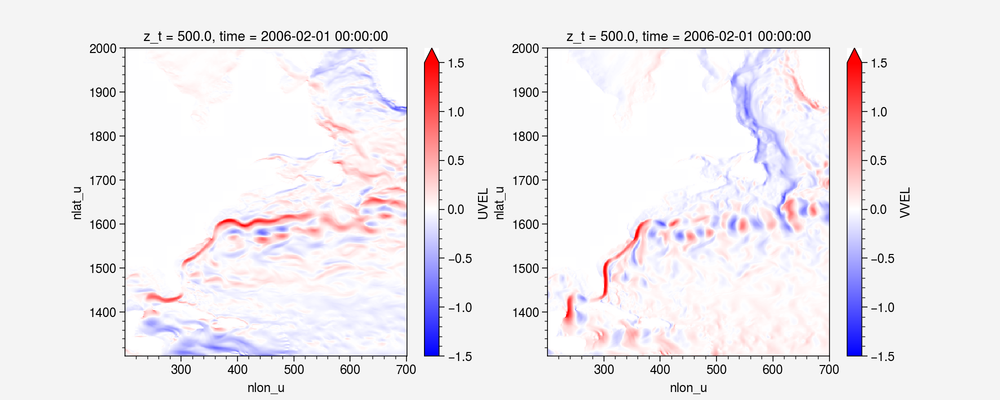

In [54]:
# vvel_r = xds_vvel_TH.VVEL.isel(time=0, z_t=0, nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))/100
# vvel_r = vvel_r.compute()
# uvel_r = xds_vvel_TH.UVEL.isel(time=0, z_t=0, nlon_u=slice(nlon1_r_t12, nlon2_r_t12), nlat_u=slice(nlat1_r_t12, nlat2_r_t12))/100
# uvel_r = uvel_r.compute()
# fig, axs = plt.subplots(1,2,figsize=(10,4))
# uvel_r.plot(ax=axs[0],vmin=-1.5, vmax=1.5, cmap='bwr')
# vvel_r.plot(ax=axs[1],vmin=-1.5, vmax=1.5, cmap='bwr')
# vvel_r

<xarray.DataArray 'VVEL' (nlat_u: 120, nlon_u: 60)>
array([[ 0.04912603,  0.0614063 ,  0.06410874, ...,  0.05682648,
         0.0536003 ,  0.03485676],
       [ 0.04658289,  0.05758791,  0.05876874, ...,  0.05575764,
         0.05384535,  0.03683608],
       [ 0.0450133 ,  0.05387985,  0.05327239, ...,  0.05480751,
         0.05406873,  0.03856386],
       ...,
       [        nan,         nan,         nan, ..., -0.10298619,
        -0.00567651, -0.02290194],
       [        nan,         nan,         nan, ..., -0.13944368,
        -0.00730472, -0.05650215],
       [        nan,         nan,         nan, ..., -0.1805148 ,
        -0.02418089, -0.0654119 ]], dtype=float32)
Coordinates:
    z_t      float32 500.0
    ULONG    (nlat_u, nlon_u) float64 253.6 254.8 255.9 ... 318.1 319.0 320.0
    ULAT     (nlat_u, nlon_u) float64 11.69 11.68 11.68 ... 58.74 58.73 58.73
    time     object 1850-02-01 00:00:00
  * nlon_u   (nlon_u) int64 261 262 263 264 265 266 ... 315 316 317 318 319 320
  * nlat_u   (nlat_u) int64 231 232 233 234 235 236 ... 345 346 347 348 349 350

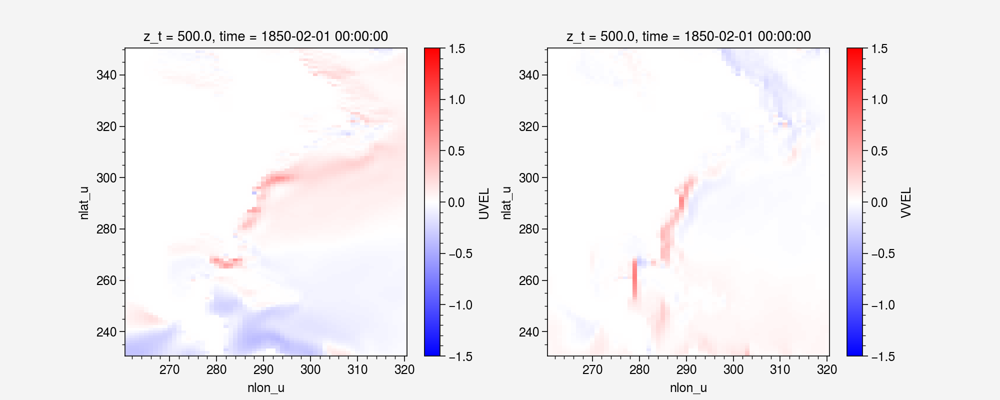

In [95]:
# vvel_r_TL = xds_vvel_TL.VVEL.isel(time=0, z_t=0, nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))/100
# vvel_r_TL = vvel_r_TL.compute()
# uvel_r_TL = xds_vvel_TL.UVEL.isel(time=0, z_t=0, nlon_u=slice(nlon1_r_g16, nlon2_r_g16), nlat_u=slice(nlat1_r_g16, nlat2_r_g16))/100
# uvel_r_TL = uvel_r_TL.compute()
# fig, axs = plt.subplots(1,2,figsize=(10,4))
# uvel_r_TL.plot(ax=axs[0],vmin=-1.5, vmax=1.5, cmap='bwr')
# vvel_r_TL.plot(ax=axs[1],vmin=-1.5, vmax=1.5, cmap='bwr')
# vvel_r_TL

<xarray.DataArray (nlat_u: 700, nlon_u: 500)>
array([[-0.12272078, -0.12989201, -0.14056629, ...,  0.0503733 ,
         0.05219669,  0.05373852],
       [-0.12880649, -0.14071987, -0.15881957, ...,  0.05385614,
         0.05543921,  0.05674432],
       [-0.14594246, -0.16242687, -0.17636569, ...,  0.05683055,
         0.05845421,  0.05970018],
       ...,
       [-0.01      , -0.01      , -0.01      , ..., -0.01      ,
        -0.01      , -0.01      ],
       [-0.01      , -0.01      , -0.01      , ..., -0.01      ,
        -0.01      , -0.01      ],
       [-0.01      , -0.01      , -0.01      , ...,         nan,
                nan,         nan]])
Coordinates:
    z_t      float32 500.0
    ULONG    (nlat_u, nlon_u) float64 -89.9 -89.8 -89.7 -89.6 ... -1.0 -1.0 -1.0
    ULAT     (nlat_u, nlon_u) float64 11.82 11.82 11.82 11.82 ... -1.0 -1.0 -1.0
    time     object 2006-02-01 00:00:00
  * nlon_u   (nlon_u) int64 201 202 203 204 205 206 ... 695 696 697 698 699 700
  * nlat_u   (nlat_u) int64 1301 1302 1303 1304 1305 ... 1997 1998 1999 2000

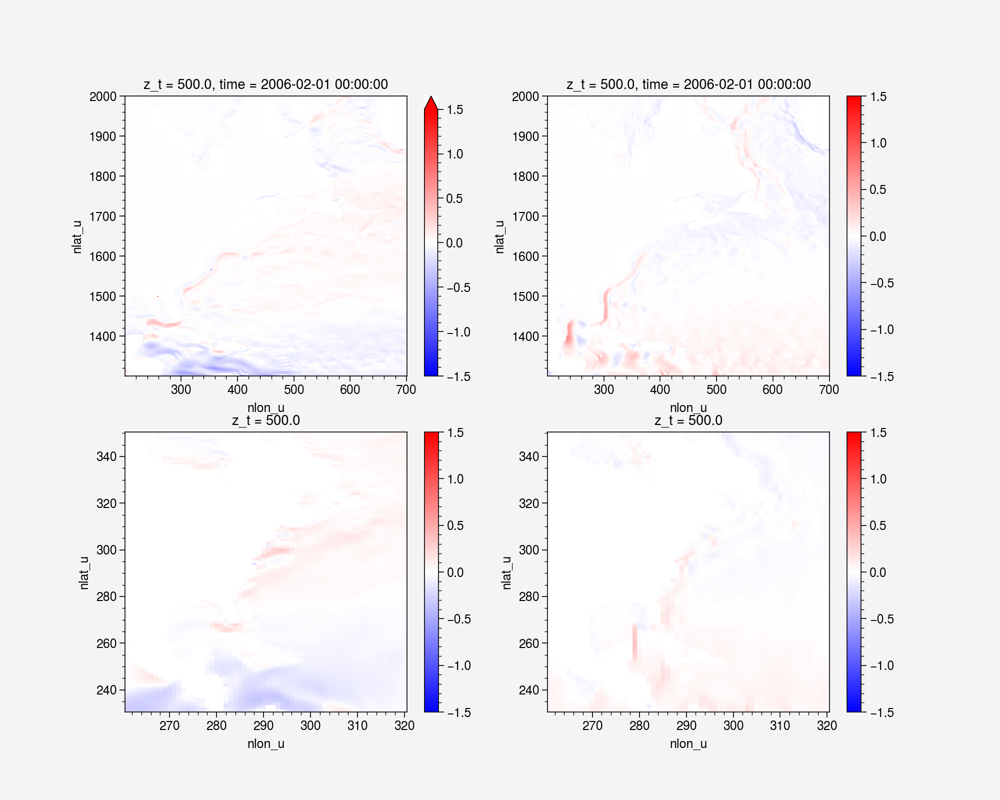

In [96]:
# Uag_r = uvel_r - Ug_r
# Vag_r = vvel_r - Vg_r
# Uag_r_TL = uvel_r_TL - Ug_r_TL
# Vag_r_TL = vvel_r_TL - Vg_r_TL
# fig, axs = plt.subplots(2,2,figsize=(10,8))
# Uag_r.plot(ax=axs[0,0],vmin=-1.5, vmax=1.5, cmap='bwr')
# Vag_r.plot(ax=axs[0,1],vmin=-1.5, vmax=1.5, cmap='bwr')
# Uag_r_TL.plot(ax=axs[1,0],vmin=-1.5, vmax=1.5, cmap='bwr')
# Vag_r_TL.plot(ax=axs[1,1],vmin=-1.5, vmax=1.5, cmap='bwr')
# Vag_r

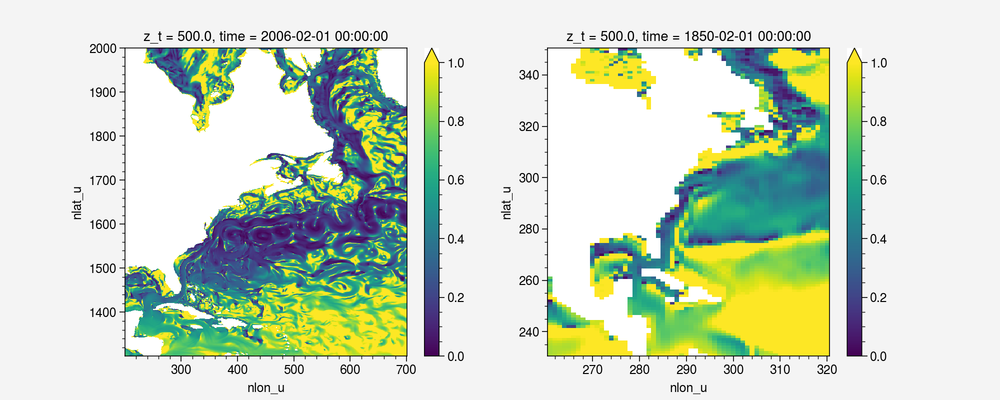

In [97]:
# spd_ag_r = xr.ufuncs.sqrt(Uag_r**2 + Vag_r**2)
# spd_r = xr.ufuncs.sqrt(uvel_r**2 + vvel_r**2)
# spd_ag_r_TL = xr.ufuncs.sqrt(Uag_r_TL**2 + Vag_r_TL**2)
# spd_r_TL = xr.ufuncs.sqrt(uvel_r_TL**2 + vvel_r_TL**2)
# # Uag_r = uvel_r - Ug_r
# # Vag_r = vvel_r - Vg_r
# fig, axs = plt.subplots(1,2,figsize=(10,4))
# np.abs(spd_ag_r/spd_r).where(kmu_r>0).plot(ax=axs[0], vmin=0, vmax=1)
# np.abs(spd_ag_r_TL/spd_r_TL).plot(ax=axs[1], vmin=0, vmax=1)

In [4]:
# read TH U, V vel

# 'B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway.pop.h.TEMP.192801-192812.nc'
yrs1a_TH = np.arange(2001,2005+1) 
prefix1a_TH = 'B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway.pop.h.'

indir1a_uvel_TH = ('/ihesp/archive/B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway/ocn/proc/tseries/month_1/UVEL/')
infiles1a_uvel_TH = [indir1a_uvel_TH + prefix1a_TH + 'UVEL.' + str(iyr) + '01-' + str(iyr) + '12.nc' 
               for iyr in yrs1a_TH]
infiles1a_uvel_TH

indir1a_vvel_TH = ('/ihesp/archive/B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway/ocn/proc/tseries/month_1/VVEL/')
infiles1a_vvel_TH = [indir1a_vvel_TH + prefix1a_TH + 'VVEL.' + str(iyr) + '01-' + str(iyr) + '12.nc' 
               for iyr in yrs1a_TH]
infiles1a_vvel_TH


yrs2_TH = np.arange(2006,2100+1)
prefix2_TH = 'B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF.pop.h.'
indir1b_uvel_TH = ('/ihesp/archive/B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF/ocn/proc/tseries/month_1/UVEL/')
infiles2_uvel_TH = [indir1b_uvel_TH + prefix2_TH + 'UVEL.' + str(iyr) + '01-' + str(iyr) + '12.nc' 
               for iyr in yrs2_TH]
infiles2_uvel_TH

indir1b_vvel_TH = ('/ihesp/archive/B.E.13.BRCP85C5CN.ne120_t12.sehires38.003.sunway.CN_OFF/ocn/proc/tseries/month_1/VVEL/')
infiles2_vvel_TH = [indir1b_vvel_TH + prefix2_TH + 'VVEL.' + str(iyr) + '01-' + str(iyr) + '12.nc' 
               for iyr in yrs2_TH]
infiles2_vvel_TH


ds_uvel_TH = xr.open_mfdataset(infiles1a_uvel_TH + infiles2_uvel_TH, compat="override", combine="by_coords", 
                       data_vars="minimal", coords="minimal", chunks=chunks_HR, 
                       parallel=True)

ds_vvel_TH = xr.open_mfdataset(infiles1a_vvel_TH + infiles2_vvel_TH, compat="override", combine="by_coords", 
                       data_vars="minimal", coords="minimal", chunks=chunks_HR, 
                       parallel=True)
ds_vvel_TH 

<xarray.Dataset>
Dimensions:             (d2: 2, nlat: 2400, nlon: 3600, time: 1200, z_t: 62, z_t_150m: 15, z_w: 62, z_w_bot: 62, z_w_top: 62)
Coordinates:
  * z_t                 (z_t) float32 500.0 1.5e+03 ... 5.625e+05 5.875e+05
  * z_t_150m            (z_t_150m) float32 500.0 1.5e+03 ... 1.35e+04 1.45e+04
  * z_w                 (z_w) float32 0.0 1e+03 2e+03 ... 5.5e+05 5.75e+05
  * z_w_top             (z_w_top) float32 0.0 1e+03 2e+03 ... 5.5e+05 5.75e+05
  * z_w_bot             (z_w_bot) float32 1e+03 2e+03 3e+03 ... 5.75e+05 6e+05
    ULONG               (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ULAT                (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    TLONG               (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    TLAT                (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
  * time                (time) object 2001-02-01 00:00:00 ... 2101-01-01 00:0...
Dimensions without coordinates: d2, nlat, nlon
Data variables: (12/51)
    dz                  (z_t) float32 dask.array<chunksize=(1,), meta=np.ndarray>
    dzw                 (z_w) float32 dask.array<chunksize=(62,), meta=np.ndarray>
    KMT                 (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    KMU                 (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    REGION_MASK         (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    UAREA               (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ...                  ...
    salinity_factor     float64 ...
    sflux_factor        float64 ...
    nsurface_t          float64 ...
    nsurface_u          float64 ...
    time_bound          (time, d2) object dask.array<chunksize=(12, 2), meta=np.ndarray>
    VVEL                (time, z_t, nlat, nlon) float32 dask.array<chunksize=(12, 1, 400, 300), meta=np.ndarray>
Attributes:
    title:         B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway
    history:       Thu Aug 26 14:23:01 2021: ncap2 -A -s time=udunits(time, "...
    Conventions:   CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curren...
    contents:      Diagnostic and Prognostic Variables
    source:        CCSM POP2, the CCSM Ocean Component
    revision:      $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    calendar:      All years have exactly  365 days.
    start_time:    This dataset was created on 2020-03-16 at 08:33:13.4
    cell_methods:  cell_methods = time: mean ==> the variable values are aver...
    nsteps_total:  34411091
    tavg_sum:      2678400.0
    NCO:           netCDF Operators version 4.8.1 (Homepage = http://nco.sf.n...

In [5]:
# read CH U, V vel

# 'B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway.pop.h.TEMP.192801-192812.nc'
yrs1a_CH = np.arange(401,500+1) 
prefix1a_CH = 'B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02.pop.h.'

indir1a_uvel_CH = ('/ihesp/archive/B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02/ocn/proc/UVEL/')
infiles1a_uvel_CH = [indir1a_uvel_CH + prefix1a_CH + 'UVEL.' + str(iyr).zfill(4) +'01-' + str(iyr).zfill(4)+ '12.nc'
                     for iyr in yrs1a_CH]
infiles1a_uvel_CH

indir1a_vvel_CH = ('/ihesp/archive/B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02/ocn/proc/VVEL/')
infiles1a_vvel_CH = [indir1a_vvel_CH + prefix1a_CH + 'VVEL.' + str(iyr).zfill(4) +'01-' + str(iyr).zfill(4)+ '12.nc'
               for iyr in yrs1a_CH]
infiles1a_vvel_CH

ds_uvel_CH = xr.open_mfdataset(infiles1a_uvel_CH, compat="override", combine="by_coords", 
                       data_vars="minimal", coords="minimal", chunks=chunks_HR, 
                       parallel=True)

ds_vvel_CH = xr.open_mfdataset(infiles1a_vvel_CH, compat="override", combine="by_coords", 
                       data_vars="minimal", coords="minimal", chunks=chunks_HR, 
                       parallel=True)
ds_vvel_CH 

<xarray.Dataset>
Dimensions:             (d2: 2, nlat: 2400, nlon: 3600, time: 1200, z_t: 62, z_t_150m: 15, z_w: 62, z_w_bot: 62, z_w_top: 62)
Coordinates:
  * z_t                 (z_t) float32 500.0 1.5e+03 ... 5.625e+05 5.875e+05
  * z_t_150m            (z_t_150m) float32 500.0 1.5e+03 ... 1.35e+04 1.45e+04
  * z_w                 (z_w) float32 0.0 1e+03 2e+03 ... 5.5e+05 5.75e+05
  * z_w_top             (z_w_top) float32 0.0 1e+03 2e+03 ... 5.5e+05 5.75e+05
  * z_w_bot             (z_w_bot) float32 1e+03 2e+03 3e+03 ... 5.75e+05 6e+05
    ULONG               (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ULAT                (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    TLONG               (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    TLAT                (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
  * time                (time) object 0401-02-01 00:00:00 ... 0501-01-01 00:0...
Dimensions without coordinates: d2, nlat, nlon
Data variables: (12/51)
    dz                  (z_t) float32 dask.array<chunksize=(1,), meta=np.ndarray>
    dzw                 (z_w) float32 dask.array<chunksize=(62,), meta=np.ndarray>
    KMT                 (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    KMU                 (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    REGION_MASK         (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    UAREA               (nlat, nlon) float64 dask.array<chunksize=(400, 300), meta=np.ndarray>
    ...                  ...
    salinity_factor     float64 ...
    sflux_factor        float64 ...
    nsurface_t          float64 ...
    nsurface_u          float64 ...
    time_bound          (time, d2) object dask.array<chunksize=(12, 2), meta=np.ndarray>
    VVEL                (time, z_t, nlat, nlon) float32 dask.array<chunksize=(12, 1, 400, 300), meta=np.ndarray>
Attributes:
    title:         B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02
    history:       Sat Jul 24 15:04:58 2021: ncap2 -A -s time=udunits(time, "...
    Conventions:   CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curren...
    contents:      Diagnostic and Prognostic Variables
    source:        CCSM POP2, the CCSM Ocean Component
    revision:      $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    calendar:      All years have exactly  365 days.
    start_time:    This dataset was created on 2020-01-03 at 01:54:07.7
    cell_methods:  cell_methods = time: mean ==> the variable values are aver...
    nsteps_total:  86568131
    tavg_sum:      2678400.0
    NCO:           netCDF Operators version 4.8.1 (Homepage = http://nco.sf.n...

In [62]:
# infile1_uvel_TL = ('/ihesp/archive/B.E.13.BHISTC5.ne30g16.sehires38.003.sunway/tseries/ocn/to_archive/'
#                    'B.E.13.BHISTC5.ne30g16.sehires38.003.sunway.pop.h.UVEL.185001-200512.nc')
# infile1_vvel_TL = ('/ihesp/archive/B.E.13.BHISTC5.ne30g16.sehires38.003.sunway/tseries/ocn/to_archive/'
#                    'B.E.13.BHISTC5.ne30g16.sehires38.003.sunway.pop.h.VVEL.185001-200512.nc')

# infile2_uvel_TL = ('/ihesp/archive/B.E.13.BRCP85C5CN.ne30g16.sehires38.003.sunway.CN_OFF/tseries/ocn/to_archive/'
#                    'B.E.13.BRCP85C5CN.ne30g16.sehires38.003.sunway.CN_OFF.pop.h.UVEL.200601-210512.nc')
# infile2_vvel_TL = ('/ihesp/archive/B.E.13.BRCP85C5CN.ne30g16.sehires38.003.sunway.CN_OFF/tseries/ocn/to_archive/'
#                    'B.E.13.BRCP85C5CN.ne30g16.sehires38.003.sunway.CN_OFF.pop.h.VVEL.200601-210512.nc')

# ds_uvel_TL = xr.open_mfdataset([infile1_uvel_TL, infile2_uvel_TL], compat="override", combine="by_coords", 
#                        data_vars="minimal", coords="minimal", chunks=chunks_LR, parallel=True)

# ds_vvel_TL = xr.open_mfdataset([infile1_vvel_TL, infile2_vvel_TL], compat="override", combine="by_coords", 
#                        data_vars="minimal", coords="minimal", chunks=chunks_LR, parallel=True)
# ds_vvel_TL

<xarray.Dataset>
Dimensions:               (d2: 2, lat_aux_grid: 395, moc_comp: 3, moc_z: 61, nchar: 256, nlat: 384, nlon: 320, time: 3070, transport_comp: 5, transport_reg: 2, z_t: 60, z_t_150m: 15, z_w: 60, z_w_bot: 60, z_w_top: 60)
Coordinates:
  * z_t                   (z_t) float32 500.0 1.5e+03 ... 5.125e+05 5.375e+05
  * z_t_150m              (z_t_150m) float32 500.0 1.5e+03 ... 1.35e+04 1.45e+04
  * z_w                   (z_w) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_top               (z_w_top) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_bot               (z_w_bot) float32 1e+03 2e+03 ... 5.25e+05 5.5e+05
  * lat_aux_grid          (lat_aux_grid) float32 -79.49 -78.95 ... 89.47 90.0
  * moc_z                 (moc_z) float32 0.0 1e+03 2e+03 ... 5.25e+05 5.5e+05
    ULONG                 (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    ULAT                  (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    TLONG                 (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    TLAT                  (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
  * time                  (time) object 1850-02-01 00:00:00 ... 2105-12-01 00...
Dimensions without coordinates: d2, moc_comp, nchar, nlat, nlon, transport_comp, transport_reg
Data variables: (12/54)
    moc_components        (moc_comp, nchar) |S1 dask.array<chunksize=(3, 256), meta=np.ndarray>
    transport_components  (transport_comp, nchar) |S1 dask.array<chunksize=(5, 256), meta=np.ndarray>
    transport_regions     (transport_reg, nchar) |S1 dask.array<chunksize=(2, 256), meta=np.ndarray>
    dz                    (z_t) float32 dask.array<chunksize=(1,), meta=np.ndarray>
    dzw                   (z_w) float32 dask.array<chunksize=(60,), meta=np.ndarray>
    KMT                   (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    ...                    ...
    salinity_factor       float64 ...
    sflux_factor          float64 ...
    nsurface_t            float64 ...
    nsurface_u            float64 ...
    time_bound            (time, d2) object dask.array<chunksize=(1872, 2), meta=np.ndarray>
    VVEL                  (time, z_t, nlat, nlon) float32 dask.array<chunksize=(1872, 1, 384, 64), meta=np.ndarray>
Attributes:
    title:         B.E.13.BHISTC5.ne30g16.sehires38.003.sunway
    history:       none
    Conventions:   CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curren...
    contents:      Diagnostic and Prognostic Variables
    source:        CCSM POP2, the CCSM Ocean Component
    revision:      $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    calendar:      All years have exactly  365 days.
    start_time:    This dataset was created on 2020-04-11 at 22:22:40.9
    cell_methods:  cell_methods = time: mean ==> the variable values are aver...
    nsteps_total:  750
    tavg_sum:      2592000.0

In [7]:
# read TL U, V vel
indir1_TL = ('/ihesp/archive/'
          'B.E.13.BHISTC5.ne30g16.sehires38.003.sunway/ocn/monthly/')
infiles1_TL = sorted(glob.glob(indir1_TL+'cmpr_B.E.13.BHISTC5.ne30g16.sehires38.003.sunway.pop.h.200[1-5]-??.nc'))

indir2_TL = ('/ihesp/archive/'
          'B.E.13.BRCP85C5CN.ne30g16.sehires38.003.sunway.CN_OFF/ocn/monthly/')
infiles2a_TL = sorted(glob.glob(indir2_TL+'cmpr_B.E.13.BRCP85C5CN.ne30g16.sehires38.003.sunway.CN_OFF.pop.h.20??-??.nc'))

infiles2b_TL = sorted(glob.glob(indir2_TL+'cmpr_B.E.13.BRCP85C5CN.ne30g16.sehires38.003.sunway.CN_OFF.pop.h.2100-??.nc')) # add year 2100, 
infiles_TL = infiles1_TL + infiles2a_TL + infiles2b_TL
print(infiles_TL[0])
print(infiles_TL[-1])

ds0_TL=xr.open_dataset(infiles2a_TL[0])

keeplist=['UVEL','VVEL','time','z_t','ULONG','ULAT']

droplist_TL=list(ds0_TL.variables)
for i in keeplist:
    droplist_TL.remove(i)
# droplist
droplist_TL = droplist_TL + ['CFC_IFRAC','CFC_XKW','CFC_ATM_PRESS','CFC11','STF_CFC11','CFC12','STF_CFC12']
# HIST and RCP85 have different outputs, add more variables to droplist
# print(droplist_TL)

ds_TL = xr.open_mfdataset(infiles_TL, compat="override", combine="by_coords", 
                       data_vars="minimal", coords="minimal", chunks=chunks_LR, 
                       drop_variables=droplist_TL, parallel=True)
ds_TL

/ihesp/archive/B.E.13.BHISTC5.ne30g16.sehires38.003.sunway/ocn/monthly/cmpr_B.E.13.BHISTC5.ne30g16.sehires38.003.sunway.pop.h.2001-01.nc
/ihesp/archive/B.E.13.BRCP85C5CN.ne30g16.sehires38.003.sunway.CN_OFF/ocn/monthly/cmpr_B.E.13.BRCP85C5CN.ne30g16.sehires38.003.sunway.CN_OFF.pop.h.2100-12.nc


<xarray.Dataset>
Dimensions:  (nlat: 384, nlon: 320, time: 1199, z_t: 60)
Coordinates:
  * time     (time) object 2001-02-01 00:00:00 ... 2101-01-01 00:00:00
  * z_t      (z_t) float32 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
    ULONG    (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    ULAT     (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
Dimensions without coordinates: nlat, nlon
Data variables:
    UVEL     (time, z_t, nlat, nlon) float32 dask.array<chunksize=(1, 1, 384, 64), meta=np.ndarray>
    VVEL     (time, z_t, nlat, nlon) float32 dask.array<chunksize=(1, 1, 384, 64), meta=np.ndarray>
Attributes:
    title:         B.E.13.BHISTC5.ne30g16.sehires38.003.sunway
    history:       none
    Conventions:   CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curren...
    contents:      Diagnostic and Prognostic Variables
    source:        CCSM POP2, the CCSM Ocean Component
    revision:      $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    calendar:      All years have exactly  365 days.
    start_time:    This dataset was created on 2020-04-29 at 09:51:46.0
    cell_methods:  cell_methods = time: mean ==> the variable values are aver...
    nsteps_total:  1378625
    tavg_sum:      2678400.0

In [8]:
# read CL U, V  vel
indir_CL = ('/ihesp/archive/'
          'B.E.13.B1850C5.ne30g16.sehires38.003.sunway/ocn/monthly/')
infiles1a_CL = sorted(glob.glob(indir_CL+'cmpr_B.E.13.B1850C5.ne30g16.sehires38.003.sunway.pop.h.04??-??.nc'))
del infiles1a_CL[0:11+1] # remove year 400

infiles1b_CL = sorted(glob.glob(indir_CL+'cmpr_B.E.13.B1850C5.ne30g16.sehires38.003.sunway.pop.h.0500-??.nc')) # add year 500, 
infiles_CL = infiles1a_CL + infiles1b_CL
print(infiles_CL[0])
print(infiles_CL[-1])

ds0_CL=xr.open_dataset(infiles_CL[0])

keeplist=['UVEL','VVEL','time','z_t','ULONG','ULAT']

droplist_CL=list(ds0_CL.variables)
for i in keeplist:
    droplist_CL.remove(i)
# droplist

ds_CL = xr.open_mfdataset(infiles_CL, compat="override", combine="by_coords", 
                       data_vars="minimal", coords="minimal", chunks=chunks_LR, 
                       drop_variables=droplist_CL, parallel=True)
ds_CL

/ihesp/archive/B.E.13.B1850C5.ne30g16.sehires38.003.sunway/ocn/monthly/cmpr_B.E.13.B1850C5.ne30g16.sehires38.003.sunway.pop.h.0401-01.nc
/ihesp/archive/B.E.13.B1850C5.ne30g16.sehires38.003.sunway/ocn/monthly/cmpr_B.E.13.B1850C5.ne30g16.sehires38.003.sunway.pop.h.0500-12.nc


<xarray.Dataset>
Dimensions:  (nlat: 384, nlon: 320, time: 1197, z_t: 60)
Coordinates:
  * time     (time) object 0401-02-01 00:00:00 ... 0501-01-01 00:00:00
  * z_t      (z_t) float32 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
    ULONG    (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
    ULAT     (nlat, nlon) float64 dask.array<chunksize=(384, 64), meta=np.ndarray>
Dimensions without coordinates: nlat, nlon
Data variables:
    UVEL     (time, z_t, nlat, nlon) float32 dask.array<chunksize=(1, 1, 384, 64), meta=np.ndarray>
    VVEL     (time, z_t, nlat, nlon) float32 dask.array<chunksize=(1, 1, 384, 64), meta=np.ndarray>
Attributes:
    title:         B.E.13.B1850C5.ne30g16.sehires38.003.sunway
    history:       none
    Conventions:   CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curren...
    contents:      Diagnostic and Prognostic Variables
    source:        CCSM POP2, the CCSM Ocean Component
    revision:      $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    calendar:      All years have exactly  365 days.
    start_time:    This dataset was created on 2020-04-28 at 19:05:54.5
    cell_methods:  cell_methods = time: mean ==> the variable values are aver...
    nsteps_total:  3650750
    tavg_sum:      2678400.0

In [9]:
# infile_uvel_CL = ('/ihesp/archive/B.E.13.B1850C5.ne30g16.sehires38.003.sunway/tseries/ocn/to_archive/'
#                   'B.E.13.B1850C5.ne30g16.sehires38.003.sunway.pop.h.UVEL.25001-50112.nc')
# infile_vvel_CL = ('/ihesp/archive/B.E.13.B1850C5.ne30g16.sehires38.003.sunway/tseries/ocn/to_archive/'
#                   'B.E.13.B1850C5.ne30g16.sehires38.003.sunway.pop.h.VVEL.25001-50112.nc')

# ds_uvel_CL = xr.open_dataset(infile_uvel_CL, chunks=chunks_LR)
# ds_vvel_CL = xr.open_dataset(infile_vvel_CL, chunks=chunks_LR)
# ds_vvel_CL

In [10]:
# supplimentary files 
# infile0_LR = ('/ihesp/user/dapengli/Projects4iHESP/SupplementaryFiles4POP/'
#               'cmpr_B.E.13.BHISTC5.ne30g16.sehires38.003.sunway.pop.h.1850-01.nc')
# ds0_LR = xr.open_dataset(infile0_LR)
# ds0_LR

# infile0_HR = ('/ihesp/user/dapengli/Projects4iHESP/SupplementaryFiles4POP/'
#               'B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway.pop.h.1850-01.nc')
# ds0_HR = xr.open_dataset(infile0_HR)
# ds0_HR

infile_t12 = ('/ihesp/user/dapengli/Projects4iHESP/SupplementaryFiles4POP/POP_grids_2021Nov01/'
              'POPgrids_tx0.1v2_2020Jun29.nc') # POP t12 grid file
ds_t12 = xr.open_dataset(infile_t12)
ds_t12

infile_g16 = ('/ihesp/user/dapengli/Projects4iHESP/SupplementaryFiles4POP/POP_grids_2021Nov01/'
              'POPgrids_gx1v6_2020Jun29.nc') # POP g16 grid file
ds_g16 = xr.open_dataset(infile_g16)
ds_g16

ds_r_t12 = ds_t12.isel(nlon=slice(nlon1_r_t12, nlon2_r_t12), 
                       nlat=slice(nlat1_r_t12, nlat2_r_t12))
ds_r_g16 = ds_g16.isel(nlon=slice(nlon1_r_g16, nlon2_r_g16), 
                       nlat=slice(nlat1_r_g16, nlat2_r_g16))

# data analysis 

In [11]:
%%time
time_s_TH = ds_uvel_TH.time.to_pandas().index.shift(-1,'D') 
u_r_z_TH = ds_uvel_TH.UVEL.isel(nlon=slice(nlon1_r_t12, nlon2_r_t12), 
                                nlat=slice(nlat1_r_t12, nlat2_r_t12)).sel(z_t=z, method='nearest')
u_r_z_rs_TH = u_r_z_TH.assign_coords(time=time_s_TH).resample(time='A').mean('time').compute()

v_r_z_TH = ds_vvel_TH.VVEL.isel(nlon=slice(nlon1_r_t12, nlon2_r_t12), 
                                nlat=slice(nlat1_r_t12, nlat2_r_t12)).sel(z_t=z, method='nearest')
v_r_z_rs_TH = v_r_z_TH.assign_coords(time=time_s_TH).resample(time='A').mean('time').compute()
v_r_z_rs_TH

CPU times: user 3.26 s, sys: 329 ms, total: 3.59 s
Wall time: 1min 30s


<xarray.DataArray 'VVEL' (time: 100, nlat: 700, nlon: 500)>
array([[[ 5.0404253 ,  3.8274708 ,  2.2243226 , ...,  3.6525185 ,
          3.5658188 ,  3.4656389 ],
        [ 4.724835  ,  3.5263832 ,  1.9117179 , ...,  3.5084445 ,
          3.433532  ,  3.3443096 ],
        [ 4.215998  ,  3.0852072 ,  1.599857  , ...,  3.3339443 ,
          3.2905319 ,  3.224307  ],
        ...,
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ],
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ],
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ]],

       [[ 1.0973922 ,  0.921818  ,  0.8545823 , ...,  2.5264883 ,
          2.2887783 ,  2.107879  ],
        [ 0.6629973 ,  0.409935  ,  0.2245946 , ...,  2.5333238 ,
          2.3306935 ,  2.1860652 ],
        [ 0.14940389, -0.1828429 , -0.5317897 , ...,  2.5718567 ,
          2.419237  ,  2.3185418 ],
...
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ],
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ],
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ]],

       [[ 7.98718   ,  6.862327  ,  5.770471  , ...,  3.8471396 ,
          4.0575514 ,  4.2619805 ],
        [ 7.957186  ,  6.845402  ,  5.730887  , ...,  3.7969263 ,
          4.0286565 ,  4.2430873 ],
        [ 7.6664124 ,  6.6110616 ,  5.5376306 , ...,  3.7216015 ,
          3.946635  ,  4.1496615 ],
        ...,
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ],
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ],
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ]]], dtype=float32)
Coordinates:
  * time     (time) object 2001-12-31 00:00:00 ... 2100-12-31 00:00:00
    z_t      float32 1.5e+03
    ULONG    (nlat, nlon) float64 -89.9 -89.8 -89.7 -89.6 ... -1.0 -1.0 -1.0
    ULAT     (nlat, nlon) float64 11.82 11.82 11.82 11.82 ... -1.0 -1.0 -1.0
    TLONG    (nlat, nlon) float64 270.1 270.1 270.2 270.4 ... -1.0 -1.0 -1.0
    TLAT     (nlat, nlon) float64 11.77 11.77 11.77 11.77 ... -1.0 -1.0 -1.0
Dimensions without coordinates: nlat, nlon

In [12]:
%%time
time_s_CH = ds_uvel_CH.time.to_pandas().index.shift(-1,'D') 
u_r_z_CH = ds_uvel_CH.UVEL.isel(nlon=slice(nlon1_r_t12, nlon2_r_t12), 
                                nlat=slice(nlat1_r_t12, nlat2_r_t12)).sel(z_t=z, method='nearest')
u_r_z_rs_CH = u_r_z_CH.assign_coords(time=time_s_CH).resample(time='A').mean('time').compute()
v_r_z_CH = ds_vvel_CH.VVEL.isel(nlon=slice(nlon1_r_t12, nlon2_r_t12), 
                                nlat=slice(nlat1_r_t12, nlat2_r_t12)).sel(z_t=z, method='nearest')
v_r_z_rs_CH = v_r_z_CH.assign_coords(time=time_s_CH).resample(time='A').mean('time').compute()
v_r_z_rs_CH

CPU times: user 3.14 s, sys: 355 ms, total: 3.5 s
Wall time: 1min 30s


<xarray.DataArray 'VVEL' (time: 100, nlat: 700, nlon: 500)>
array([[[ 8.204425  ,  8.391732  ,  8.374383  , ...,  3.0405076 ,
          3.2101376 ,  3.4029882 ],
        [ 7.91643   ,  8.051533  ,  7.9693074 , ...,  2.9229946 ,
          3.1974661 ,  3.4536197 ],
        [ 7.3743215 ,  7.5031238 ,  7.4017425 , ...,  2.7509701 ,
          3.0996416 ,  3.4542263 ],
        ...,
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ],
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ],
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ]],

       [[-5.1573043 , -6.585226  , -7.887055  , ...,  5.5431046 ,
          5.543923  ,  5.4019394 ],
        [-5.6395698 , -7.1076207 , -8.413292  , ...,  5.508385  ,
          5.5679364 ,  5.4735446 ],
        [-6.091142  , -7.5791802 , -8.886073  , ...,  5.3734684 ,
          5.4639745 ,  5.4352207 ],
...
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ],
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ],
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ]],

       [[ 5.772306  ,  5.055331  ,  4.5958614 , ...,  3.5592155 ,
          3.1866481 ,  2.906909  ],
        [ 5.1858745 ,  4.5523925 ,  4.0314994 , ...,  3.4291418 ,
          3.0870068 ,  2.8219175 ],
        [ 4.4025083 ,  3.8749046 ,  3.3279607 , ...,  3.1920338 ,
          2.8761318 ,  2.642357  ],
        ...,
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ],
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ],
        [-1.        , -1.        , -1.        , ..., -1.        ,
         -1.        , -1.        ]]], dtype=float32)
Coordinates:
  * time     (time) object 0401-12-31 00:00:00 ... 0500-12-31 00:00:00
    z_t      float32 1.5e+03
    ULONG    (nlat, nlon) float64 -89.9 -89.8 -89.7 -89.6 ... -1.0 -1.0 -1.0
    ULAT     (nlat, nlon) float64 11.82 11.82 11.82 11.82 ... -1.0 -1.0 -1.0
    TLONG    (nlat, nlon) float64 270.1 270.1 270.2 270.4 ... -1.0 -1.0 -1.0
    TLAT     (nlat, nlon) float64 11.77 11.77 11.77 11.77 ... -1.0 -1.0 -1.0
Dimensions without coordinates: nlat, nlon

In [13]:
%%time
time_s_TL = ds_TL.time.to_pandas().index.shift(-1,'D') 
u_r_z_TL = ds_TL.UVEL.isel(nlon=slice(nlon1_r_g16, nlon2_r_g16), 
                           nlat=slice(nlat1_r_g16, nlat2_r_g16)).sel(z_t=z, method='nearest')
u_r_z_rs_TL = u_r_z_TL.assign_coords(time=time_s_TL).resample(time='A').mean('time').compute()

v_r_z_TL = ds_TL.VVEL.isel(nlon=slice(nlon1_r_g16, nlon2_r_g16), 
                           nlat=slice(nlat1_r_g16, nlat2_r_g16)).sel(z_t=z, method='nearest')
v_r_z_rs_TL = v_r_z_TL.assign_coords(time=time_s_TL).resample(time='A').mean('time').compute()
v_r_z_rs_TL

CPU times: user 3.55 s, sys: 140 ms, total: 3.69 s
Wall time: 4min


<xarray.DataArray 'VVEL' (time: 100, nlat: 120, nlon: 60)>
array([[[  1.8789445 ,   1.6319137 ,   1.4175316 , ...,   4.516933  ,
           4.286947  ,   4.122481  ],
        [  1.816915  ,   1.4614973 ,   1.12332   , ...,   4.5158362 ,
           4.2905755 ,   4.1364093 ],
        [  1.7477528 ,   1.2609795 ,   0.8390446 , ...,   4.5057044 ,
           4.2959867 ,   4.1512127 ],
        ...,
        [         nan,          nan,          nan, ...,  -8.09797   ,
           0.29670182,   0.6242373 ],
        [         nan,          nan,          nan, ..., -11.614616  ,
          -1.0347701 ,  -1.0689404 ],
        [         nan,          nan,          nan, ..., -14.7480955 ,
          -2.8751829 ,  -3.0475693 ]],

       [[  1.6798183 ,   1.4112436 ,   1.4275737 , ...,   4.049048  ,
           3.986411  ,   3.9979115 ],
        [  1.5203328 ,   1.2188505 ,   1.1653414 , ...,   4.08167   ,
           4.015213  ,   4.032957  ],
        [  1.3699726 ,   1.0234958 ,   0.91582346, ...,   4.104703  ,
           4.0335846 ,   4.058085  ],
...
        [         nan,          nan,          nan, ...,  -5.3291225 ,
          -3.351354  ,  -2.2012184 ],
        [         nan,          nan,          nan, ...,  -8.4595785 ,
          -4.684361  ,  -3.2035801 ],
        [         nan,          nan,          nan, ..., -12.498901  ,
          -6.9928737 ,  -4.4720454 ]],

       [[  3.7130668 ,   3.4790418 ,   3.434438  , ...,   4.896376  ,
           4.7805014 ,   4.6688046 ],
        [  3.575476  ,   3.2865322 ,   3.1425226 , ...,   4.851948  ,
           4.721553  ,   4.594223  ],
        [  3.412883  ,   3.0507505 ,   2.7877808 , ...,   4.787951  ,
           4.6478367 ,   4.515593  ],
        ...,
        [         nan,          nan,          nan, ...,  -5.372392  ,
          -3.019337  ,  -2.0006943 ],
        [         nan,          nan,          nan, ...,  -8.595473  ,
          -4.4721475 ,  -2.9360878 ],
        [         nan,          nan,          nan, ..., -12.560123  ,
          -6.792004  ,  -4.159743  ]]], dtype=float32)
Coordinates:
  * time     (time) object 2001-12-31 00:00:00 ... 2100-12-31 00:00:00
    z_t      float32 1.5e+03
    ULONG    (nlat, nlon) float64 253.6 254.8 255.9 257.0 ... 318.1 319.0 320.0
    ULAT     (nlat, nlon) float64 11.69 11.68 11.68 11.67 ... 58.74 58.73 58.73
Dimensions without coordinates: nlat, nlon

In [14]:
%%time
time_s_CL = ds_CL.time.to_pandas().index.shift(-1,'D') 
u_r_z_CL = ds_CL.UVEL.isel(nlon=slice(nlon1_r_g16, nlon2_r_g16), 
                           nlat=slice(nlat1_r_g16, nlat2_r_g16)).sel(z_t=z, method='nearest')
u_r_z_rs_CL = u_r_z_CL.assign_coords(time=time_s_CL).resample(time='A').mean('time').compute()

v_r_z_CL = ds_CL.VVEL.isel(nlon=slice(nlon1_r_g16, nlon2_r_g16), 
                           nlat=slice(nlat1_r_g16, nlat2_r_g16)).sel(z_t=z, method='nearest')
v_r_z_rs_CL = v_r_z_CL.assign_coords(time=time_s_CL).resample(time='A').mean('time').compute()
v_r_z_rs_CL

CPU times: user 6.13 s, sys: 251 ms, total: 6.38 s
Wall time: 3min 57s


<xarray.DataArray 'VVEL' (time: 100, nlat: 120, nlon: 60)>
array([[[  1.9621371 ,   1.6616858 ,   1.3214498 , ...,   4.0265093 ,
           3.938411  ,   3.7910697 ],
        [  1.9296228 ,   1.4933704 ,   1.0493274 , ...,   4.1217465 ,
           4.006231  ,   3.8592856 ],
        [  1.8774743 ,   1.3119651 ,   0.76983714, ...,   4.205486  ,
           4.0692177 ,   3.907554  ],
        ...,
        [         nan,          nan,          nan, ...,  -8.171173  ,
           0.77807903,   1.7277732 ],
        [         nan,          nan,          nan, ..., -11.152381  ,
          -1.8962151 ,   0.2885819 ],
        [         nan,          nan,          nan, ..., -13.382592  ,
          -4.086659  ,  -3.2484803 ]],

       [[  1.1932281 ,   0.9831694 ,   1.0964717 , ...,   4.11873   ,
           3.9263086 ,   3.7723293 ],
        [  1.3060997 ,   0.968908  ,   0.92058414, ...,   4.2218013 ,
           3.9911282 ,   3.858403  ],
        [  1.4225578 ,   0.9354264 ,   0.73292047, ...,   4.307461  ,
           4.0628705 ,   3.9402828 ],
...
        [         nan,          nan,          nan, ...,  -7.2667727 ,
           1.6655884 ,   2.099469  ],
        [         nan,          nan,          nan, ..., -10.655069  ,
          -0.1461647 ,   0.58344513],
        [         nan,          nan,          nan, ..., -13.51518   ,
          -2.2584355 ,  -2.0321727 ]],

       [[  1.3826574 ,   1.4310268 ,   1.3537849 , ...,   4.171957  ,
           3.93015   ,   3.7083902 ],
        [  1.4766302 ,   1.4881406 ,   1.2849191 , ...,   4.25499   ,
           3.9797857 ,   3.757869  ],
        [  1.5604984 ,   1.5308442 ,   1.2576941 , ...,   4.2899966 ,
           4.0084653 ,   3.8024235 ],
        ...,
        [         nan,          nan,          nan, ...,  -8.137235  ,
           0.54196304,   0.8393717 ],
        [         nan,          nan,          nan, ..., -11.587596  ,
          -1.4898661 ,  -0.5029969 ],
        [         nan,          nan,          nan, ..., -14.383248  ,
          -3.9136646 ,  -3.1245995 ]]], dtype=float32)
Coordinates:
  * time     (time) object 0401-12-31 00:00:00 ... 0500-12-31 00:00:00
    z_t      float32 1.5e+03
    ULONG    (nlat, nlon) float64 253.6 254.8 255.9 257.0 ... 318.1 319.0 320.0
    ULAT     (nlat, nlon) float64 11.69 11.68 11.68 11.67 ... 58.74 58.73 58.73
Dimensions without coordinates: nlat, nlon

In [15]:
spd_r_z_TH = xr.ufuncs.sqrt(u_r_z_rs_TH**2+ v_r_z_rs_TH**2)
spd_r_z_CH = xr.ufuncs.sqrt(u_r_z_rs_CH**2+ v_r_z_rs_CH**2).assign_coords(time=spd_r_z_TH.time)
spd_r_z_THmCH = spd_r_z_TH - spd_r_z_CH
spd_r_z_THmCH
spd_r_z_TL = xr.ufuncs.sqrt(u_r_z_rs_TL**2+ v_r_z_rs_TL**2)
spd_r_z_CL = xr.ufuncs.sqrt(u_r_z_rs_CL**2+ v_r_z_rs_CL**2).assign_coords(time=spd_r_z_TL.time)
spd_r_z_TLmCL = spd_r_z_TL - spd_r_z_CL

In [16]:
%%time 
# takes ~5 min to run
_, nlat_r_t12, nlon_r_t12 = spd_r_z_THmCH.shape
spd_tr_r_THmCH = np.empty((nlat_r_t12, nlon_r_t12))
spd_tr_r_THmCH[:] = np.nan
p_r_THmCH = np.empty((nlat_r_t12, nlon_r_t12))
p_r_THmCH[:] = np.nan

for ilon in np.arange(0,nlon_r_t12):
    for ilat in np.arange(0,nlat_r_t12):
#         slope, intercept, r_value, p_value, std_err = stats.linregress(x,y)
        spd_tr_r_THmCH[ilat,ilon], _, _, p_r_THmCH[ilat,ilon], _ = stats.linregress(
            time2, spd_r_z_THmCH[:,ilat,ilon])
    
# px_NA_TLmCL = xr.DataArray(data=p_NA_TLmCL, dims=["nlon","nlat"])  
# px_NA_TLmCL

lat_r_t12 = ds_r_t12.ULAT#.where(px_NA_TLmCL>0.05)
latm_r_t12 = np.where(p_r_THmCH>0.1,lat_r_t12, np.nan) # m: mask

lon_r_t12 = ds_r_t12.ULONG#.where(px_NA_TLmCL>0.05)
lonm_r_t12 = np.where(p_r_THmCH>0.1,lon_r_t12, np.nan) # m: mask

CPU times: user 4min 20s, sys: 1.17 s, total: 4min 21s
Wall time: 4min 20s


In [17]:
%%time
_, nlat_r_g16, nlon_r_g16 = spd_r_z_TLmCL.shape

spd_tr_r_TLmCL = np.empty((nlat_r_g16, nlon_r_g16))
spd_tr_r_TLmCL[:] = np.nan
p_r_TLmCL = np.empty((nlat_r_g16, nlon_r_g16))
p_r_TLmCL[:] = np.nan

for ilon in np.arange(0,nlon_r_g16):
    for ilat in np.arange(0,nlat_r_g16):
#         slope, intercept, r_value, p_value, std_err = stats.linregress(x,y)
        spd_tr_r_TLmCL[ilat,ilon], _, _, p_r_TLmCL[ilat,ilon], _ = stats.linregress(
            time2, spd_r_z_TLmCL[:,ilat,ilon])
    
# px_NA_TLmCL = xr.DataArray(data=p_NA_TLmCL, dims=["nlon","nlat"])  
# px_NA_TLmCL

lat_r_g16 = ds_r_g16.ULAT#.where(px_NA_TLmCL>0.05)
latm_r_g16 = np.where(p_r_TLmCL>0.1,lat_r_g16, np.nan) # m: mask

lon_r_g16 = ds_r_g16.ULONG#.where(px_NA_TLmCL>0.05)
lonm_r_g16 = np.where(p_r_TLmCL>0.1,lon_r_g16, np.nan) # m: mask

CPU times: user 5.96 s, sys: 21.7 ms, total: 5.98 s
Wall time: 5.98 s


TH spd begin/end time 2001-12-31 00:00:00 2100-12-31 00:00:00
CH spd begin/end time 2001-12-31 00:00:00 2100-12-31 00:00:00
TL spd begin/end time 2001-12-31 00:00:00 2100-12-31 00:00:00
CL spd begin/end time 2001-12-31 00:00:00 2100-12-31 00:00:00


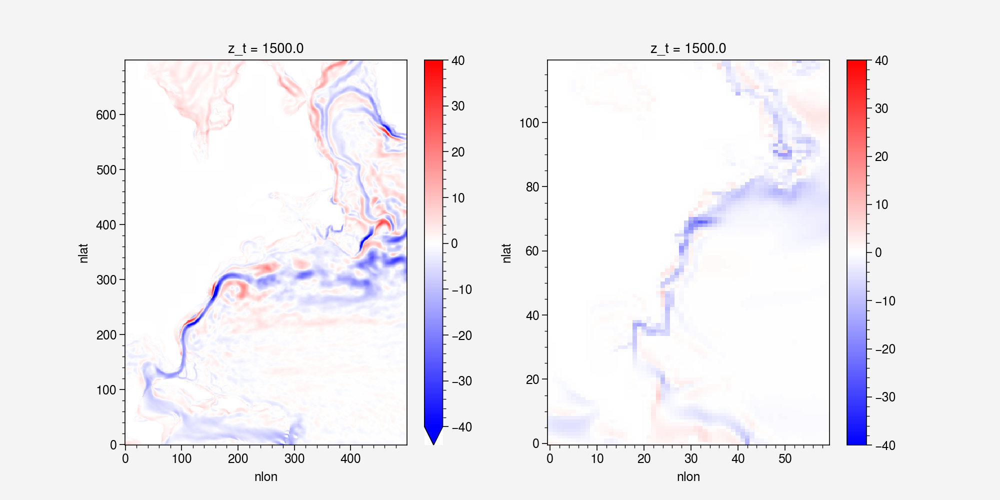

In [18]:
# compute vel spd difference between two time periods
print('TH spd begin/end time', spd_r_z_TH.time.values[0], spd_r_z_TH.time.values[-1])
print('CH spd begin/end time', spd_r_z_CH.time.values[0], spd_r_z_CH.time.values[-1])

print('TL spd begin/end time', spd_r_z_TL.time.values[0], spd_r_z_TL.time.values[-1])
print('CL spd begin/end time', spd_r_z_CL.time.values[0], spd_r_z_CL.time.values[-1])

dspd_r_z_TH=spd_r_z_TH.sel(time=slice('2081','2100')).mean('time')-spd_r_z_TH.sel(time=slice('2001','2020')).mean('time')
dspd_r_z_CH=spd_r_z_CH.sel(time=slice('2081','2100')).mean('time')-spd_r_z_CH.sel(time=slice('2001','2020')).mean('time')
dspd_r_z_THmCH = dspd_r_z_TH - dspd_r_z_CH

dspd_r_z_TL=spd_r_z_TL.sel(time=slice('2081','2100')).mean('time')-spd_r_z_TL.sel(time=slice('2001','2020')).mean('time')
dspd_r_z_CL=spd_r_z_CL.sel(time=slice('2081','2100')).mean('time')-spd_r_z_CL.sel(time=slice('2001','2020')).mean('time')
dspd_r_z_TLmCL = dspd_r_z_TL - dspd_r_z_CL

fig, axs = plt.subplots(1,2,figsize=(10,5))
dspd_r_z_THmCH.plot(ax=axs[0],vmin=-40,vmax=40,cmap='bwr')
dspd_r_z_TLmCL.plot(ax=axs[1],vmin=-40,vmax=40,cmap='bwr')